<a href="https://colab.research.google.com/github/Ela-Na/Ryerson-cind860/blob/main/Ela_CAPProject_cind860_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### <font color="purple"> CIND 860- Advanced Data Analytics Project </font>

 ### <font color="green"> Elaheh Najafi </font>


 # Diagnosis of Retina Abnormality from normal and the types of Anomalies 

## Introducing Data Set 

Dataset of validated OCT images for diagnosis of retinal diseases gathered by  Kermany et al. Images are split into a training set and a testing set of independent patients. Images are labeled as (disease)-(randomized patient ID) -(image number by this patient) and split into 4 directories: CNV, DME, DRUSEN, and NORMAL. CNV, DME are different types of Retinal diseases and NORMAL folder includes images of normal and healthy REtina. Originally there were  84,495 X-Ray images (JPEG), which for this project 10253 were used by reducing the number of images in train folder. 

# <font color="Olive"> Reading Data Set, importing some libraries and Pre-processing images </font> 



In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
import os
print("current working dir", os.getcwd())

import numpy as np
print("np", np.__version__)

import sys

import keras
from tensorflow import keras

import tensorflow as tf
print("tf", tf.__version__)
print("tf.keras", tf.keras.__version__)

import pandas as pd

import matplotlib.pyplot as plt

from tensorflow.python.client import device_lib 

from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image # Module with imagepreprocessing utilities

# keras functions through tensorflow
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model

from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers

import pickle

current working dir /content
np 1.21.5
tf 2.8.0
tf.keras 2.8.0


In [ ]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 15306429283458932890
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 16154099712
locality {
  bus_id: 1
  links {
  }
}
incarnation: 17894725931256131102
physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"
xla_global_id: 416903419
]


In [ ]:
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
print("gpu_devices", gpu_devices)

gpu_devices [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
## check if gpu is there, if not it will raise error
## go to "Runtime/Change runtime type" to activate GPU
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

tf.config.experimental.set_memory_growth(gpu_devices[0], enable=True)

Found GPU at: /device:GPU:0


In [ ]:
from IPython.display import HTML, display

def set_background(color):    
    script = (
        "var cell = this.closest('.jp-CodeCell');"
        "var editor = cell.querySelector('.jp-Editor');"
        "editor.style.background='{}';"
        "this.parentNode.removeChild(this)"
    ).format(color)
    
    display(HTML('<img src onerror="{}" style="display:none">'.format(script)))

In [ ]:
set_background('orange')

In [ ]:
#import shutil
#shutil.unpack_archive("/content/drive/MyDrive/OCT2017-Data.zip", "/content/drive/MyDrive")

In [3]:
train_dir = '/content/drive/MyDrive/OCT2017-Data/train'
train_normal = '/content/drive/MyDrive/OCT2017-Data/train/NORMAL'
train_cnv = '/content/drive/MyDrive/OCT2017-Data/train/CNV'
train_drusen = '/content/drive/MyDrive/OCT2017-Data/train/DRUSEN'
train_dme = '/content/drive/MyDrive/OCT2017-Data/train/DME'

In [4]:
validation_dir = '/content/drive/MyDrive/OCT2017-Data/val'
val_normal = '/content/drive/MyDrive/OCT2017-Data/val/NORMAL'
val_cnv = '/content/drive/MyDrive/OCT2017-Data/val/CNV'
val_drusen = '/content/drive/MyDrive/OCT2017-Data/val/DRUSEN'
val_dme = '/content/drive/MyDrive/OCT2017-Data/val/DME'

In [5]:
test_dir = '/content/drive/MyDrive/OCT2017-Data/test'
test_normal = '/content/drive/MyDrive/OCT2017-Data/test/NORMAL'
test_cnv = '/content/drive/MyDrive/OCT2017-Data/test/CNV'
test_drusen = '/content/drive/MyDrive/OCT2017-Data/test/DRUSEN'
test_dme = '/content/drive/MyDrive/OCT2017-Data/test/DME'

In [6]:
train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
valid_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
test_datagen = ImageDataGenerator(rescale=1./255)

In [7]:
train_generator1 = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=150,
    class_mode='binary')

val_generator1 = valid_datagen.flow_from_directory(
    validation_dir,
    target_size=(224, 224),
    batch_size=150,
    class_mode='binary')

test_generator1 = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=150,
    class_mode='binary')

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
for data_batch, labels_batch in train_generator1:
  print('data batch shape:', data_batch.shape)
  print('labels batch shape:', labels_batch.shape)
  break

data batch shape: (150, 150, 150, 3)
labels batch shape: (150,)


# <font color='orange'> Exploratory Image Data Analysis </font>









In [ ]:
sample_training_images, _ = next(train_generator1)


# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
def plotImages(images_arr):
    fig, axes = plt.subplots(10, 10, figsize=(100,100))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

plotImages(sample_training_images[:100])

In [ ]:
import matplotlib.pyplot as plt

def plotImages(images_arr):
    fig, axes = plt.subplots(10, 15, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

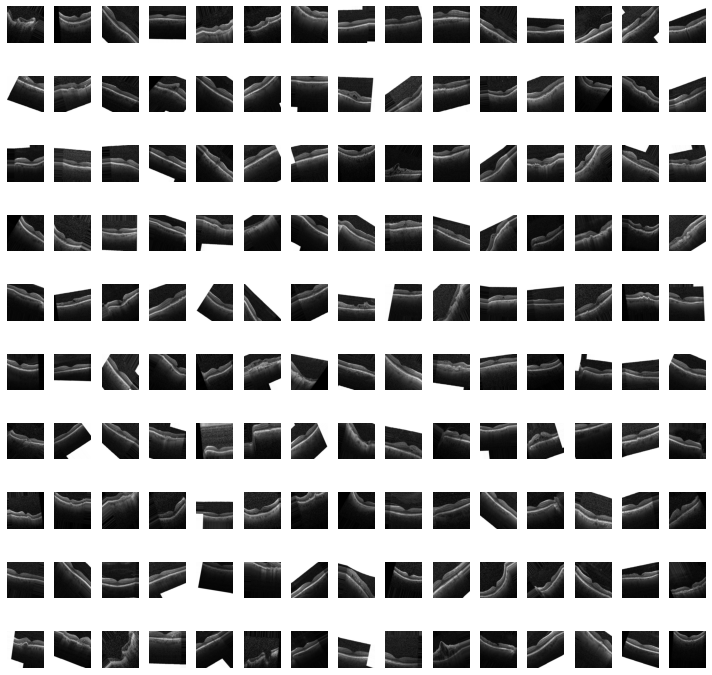

In [ ]:
images_tg = train_generator1[0][0]
images_arr = np.array(images_tg)
plotImages(images_arr)

In [ ]:
!pip install -q easyimages

     |████████████████████████████████| 88 kB 3.7 MB/s 



## <font color='orange'> Using basic-image-eda to Explore Data </font>

In [ ]:
!pip install -q basic-image-eda


In [ ]:
# latest version
# pip install git+https://github.com/Soongja/basic-image-eda



found 3081 images.
Using 2 threads. (max:2)



100%|██████████| 3081/3081 [00:59<00:00, 51.57it/s] 



*--------------------------------------------------------------------------------------*
number of images                         |  3081

dtype                                    |  uint8
channels                                 |  [1]
extensions                               |  ['jpeg']

min height                               |  496
max height                               |  512
mean height                              |  502.9899383317105
median height                            |  496

min width                                |  384
max width                                |  1536
mean width                               |  623.5481986368062
median width                             |  512

mean height/width ratio                  |  0.8066576720634286
median height/width ratio                |  0.96875
recommended input size(by mean)          |  [504 624] (h x w, multiples of 8)
recommended input size(by mean)          |  [496 624] (h x w, multiples of 16)
recommended input siz

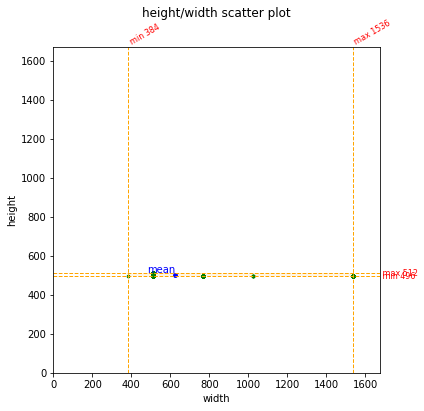

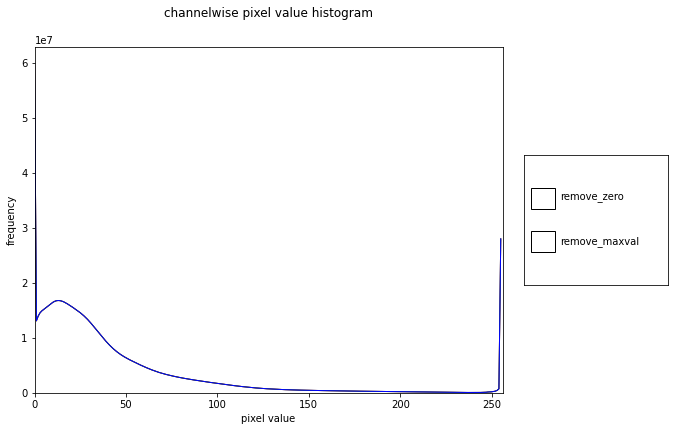


found 1542 images.
Using 2 threads. (max:2)



100%|██████████| 1542/1542 [00:39<00:00, 38.74it/s]



*--------------------------------------------------------------------------------------*
number of images                         |  1542

dtype                                    |  uint8
channels                                 |  [1]
extensions                               |  ['jpeg']

min height                               |  496
max height                               |  496
mean height                              |  496.0
median height                            |  496

min width                                |  512
max width                                |  1536
mean width                               |  730.9779507133593
median width                             |  512

mean height/width ratio                  |  0.6785430388371565
median height/width ratio                |  0.96875
recommended input size(by mean)          |  [496 728] (h x w, multiples of 8)
recommended input size(by mean)          |  [496 736] (h x w, multiples of 16)
recommended input size(by mean)  

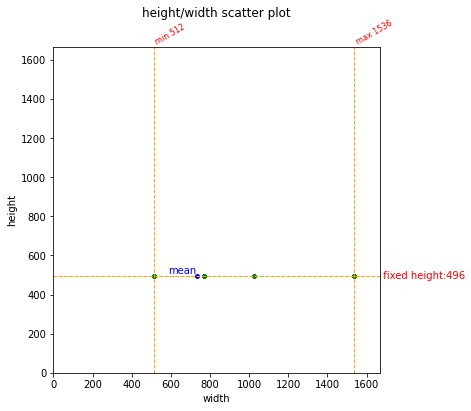

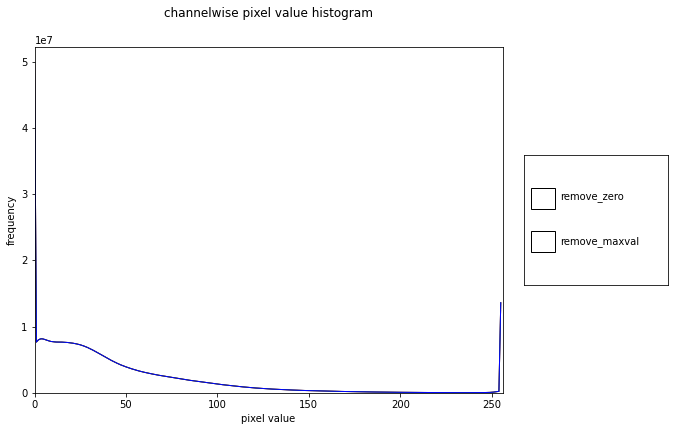


found 1539 images.
Using 2 threads. (max:2)



100%|██████████| 1539/1539 [00:31<00:00, 48.20it/s]



*--------------------------------------------------------------------------------------*
number of images                         |  1539

dtype                                    |  uint8
channels                                 |  [1]
extensions                               |  ['jpeg']

min height                               |  496
max height                               |  512
mean height                              |  509.26575698505525
median height                            |  512

min width                                |  512
max width                                |  1536
mean width                               |  556.9122807017544
median width                             |  512

mean height/width ratio                  |  0.9144451911589008
median height/width ratio                |  1.0
recommended input size(by mean)          |  [512 560] (h x w, multiples of 8)
recommended input size(by mean)          |  [512 560] (h x w, multiples of 16)
recommended input size(b

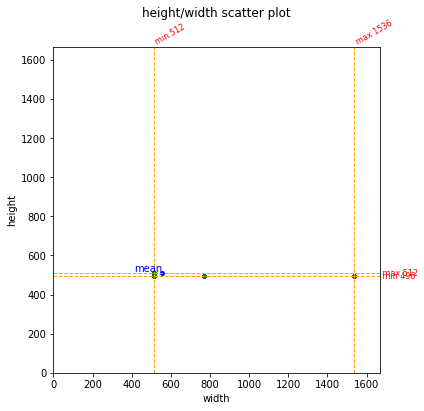

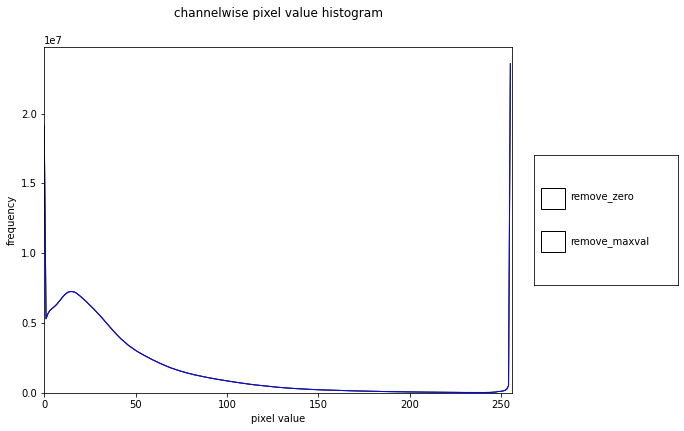


found 1590 images.
Using 2 threads. (max:2)



100%|██████████| 1590/1590 [00:26<00:00, 59.68it/s] 



*--------------------------------------------------------------------------------------*
number of images                         |  1590

dtype                                    |  uint8
channels                                 |  [1]
extensions                               |  ['jpeg']

min height                               |  496
max height                               |  496
mean height                              |  496.0
median height                            |  496

min width                                |  512
max width                                |  1536
mean width                               |  640.3220125786164
median width                             |  512

mean height/width ratio                  |  0.7746102589891878
median height/width ratio                |  0.96875
recommended input size(by mean)          |  [496 640] (h x w, multiples of 8)
recommended input size(by mean)          |  [496 640] (h x w, multiples of 16)
recommended input size(by mean)  

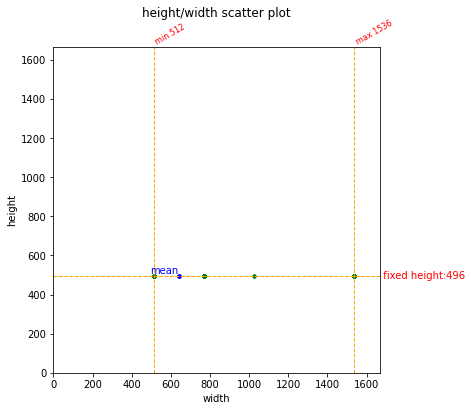

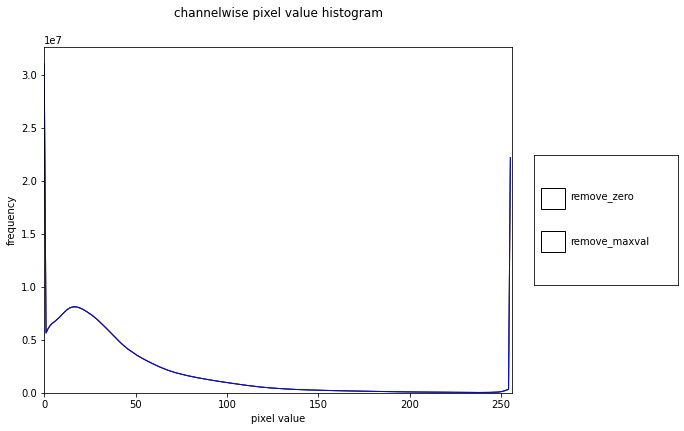

In [ ]:
from basic_image_eda import BasicImageEDA


data_dir1 = '/content/drive/MyDrive/OCT2017-Data/train/NORMAL/'
data_dir2 = '/content/drive/MyDrive/OCT2017-Data/train/CNV/'
data_dir3 = '/content/drive/MyDrive/OCT2017-Data/train/DME/'
data_dir4 = '/content/drive/MyDrive/OCT2017-Data/train/DRUSEN/'

dirs = [data_dir1, data_dir2, data_dir3, data_dir4]
extensions = ['png', 'jpg', 'jpeg']
threads = 0
dimension_plot = True
channel_hist = True
nonzero = False
hw_division_factor = 1.0

for dir in dirs:

  BasicImageEDA.explore(dir, extensions, threads, dimension_plot, channel_hist, nonzero, hw_division_factor)

## <font color='orange'> Using pandas-profiling library to Explore Data </font>

> 



In [ ]:
!pip install -q https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

# after installation restart the runtime to work


In [ ]:
!pip install -q -U https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  

In [ ]:
#!pip3 install -q pandas_profiling --

In [ ]:
#!pip install -q pandas-profiling==2.8.0

     |████████████████████████████████| 259 kB 6.9 MB/s 
     |████████████████████████████████| 59 kB 4.1 MB/s 


In [ ]:
'''import sys
!{sys.executable} -m pip install -q -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension'''


Enabling notebook extension jupyter-js-widgets/extension...
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json
      - Validating: OK
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json


In [ ]:
import pandas_profiling as pdpf

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
import os
import pandas as pd

BASE_DIR = '/content/drive/MyDrive/OCT2017-Data/train/'
train_cnv = BASE_DIR+'CNV/'
train_dme = BASE_DIR+'DME/'
train_normal = BASE_DIR+'NORMAL/'
train_drusen = BASE_DIR+'DRUSEN/'

images_cnv = sorted(os.listdir(train_cnv))
images_dme = sorted(os.listdir(train_dme))
images_drusen = sorted(os.listdir(train_drusen))
images_normal = sorted(os.listdir(train_normal))

images1=[i for i in images_cnv]
images2=[i for i in images_dme]
images3=[i for i in images_drusen]
images4=[i for i in images_normal]

train_images = [images1, images2, images3, images4]

length = []
max_l = 0

for l in train_images:
  length.append(len(l))

for l in length:
  if l > length[0]:
    max_l = l
  else:
    max_l = length[0]


df1 = pd.DataFrame()
df2 = pd.DataFrame()
df3 = pd.DataFrame()
df4 = pd.DataFrame()
df1['cnv']=[train_cnv+str(x) for x in images1]
df2['dme']=[train_dme+str(x) for x in images2]
df3['drusen']=[train_drusen+str(x) for x in images3]
df4['normal']=[train_normal+str(x) for x in images4]


df = pd.DataFrame()

df = pd.concat([df1, df2, df3, df4], axis=1, join='outer', ignore_index = True)


#df['oct'] = [train_cnv+str(x) for x in images1]
#df['label'] = ['cnv' for 'cnv' in range(len(images1))]
cnv_df = df.to_csv('/content/drive/MyDrive/OCT2017-Data/train/oct_train.csv', index =False, header=None)
'''
dme_df = df2.to_csv('/content/drive/MyDrive/OCT2017-Data/train/oct_dme.csv', index =False, header=None)
drusen = df3.to_csv('/content/drive/MyDrive/OCT2017-Data/train/oct_drusen.csv', index =False, header=None)
normal_df = df4.to_csv('/content/drive/MyDrive/OCT2017-Data/train/oct_normal.csv', index =False, header=None)'''

"\ndme_df = df2.to_csv('/content/drive/MyDrive/OCT2017-Data/train/oct_dme.csv', index =False, header=None)\ndrusen = df3.to_csv('/content/drive/MyDrive/OCT2017-Data/train/oct_drusen.csv', index =False, header=None)\nnormal_df = df4.to_csv('/content/drive/MyDrive/OCT2017-Data/train/oct_normal.csv', index =False, header=None)"

In [ ]:
max_l
length


[1542, 1539, 1590, 3081]

In [ ]:
profile = pdpf.ProfileReport(df)
print(profile)


In [ ]:
df.profile_report()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile = df.profile_report(title='Pandas Profiling Report')
profile.to_file(output_file='OCT.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)

In [ ]:
profile2 = df.profile_report(title='Pandas Profiling Report', plot={'histogram': {'bins': 8}})
profile2.to_file("oct2.pdf")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:263: UserWarning: Extension .pdf not supported. For now we assume .html was intended. To remove this warning, please use .html or .json.
  f"Extension {suffix} not supported. For now we assume .html was intended. "


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile2

In [ ]:
# Installing the opencv-python library
!pip install -q opencv-python


In [ ]:
# Importing the cv2 module
#import cv2

In [ ]:
 %matplotlib inline
import matplotlib.pyplot as plt

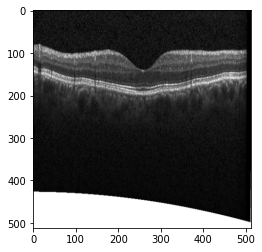

In [ ]:
import imageio


img = imageio.imread('/content/drive/MyDrive/OCT2017-Data/train/NORMAL/NORMAL-15307-3.jpeg')
img.shape  # im is a numpy array
img = img.astype(np.uint8)
img = img / 255
plt.imshow(img,cmap='gray')


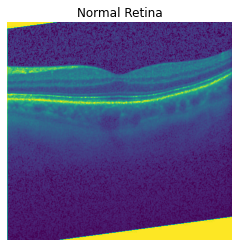

In [ ]:
img_array=plt.imread('/content/drive/MyDrive/OCT2017-Data/train/NORMAL/NORMAL-2567-3.jpeg') 
plt.imshow(img_array)
plt.title('Normal Retina') 
plt.axis('off')
plt.show()

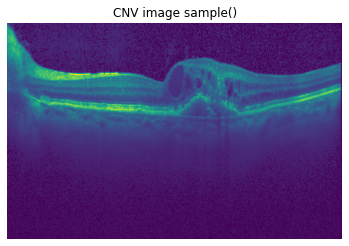

In [ ]:
img_array=plt.imread('//content/drive/MyDrive/OCT2017-Data/train/CNV/CNV-53018-6.jpeg') 
plt.imshow(img_array)
plt.title('CNV image sample()') 
plt.axis('off')
plt.show()

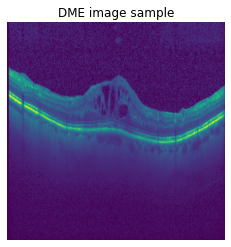

In [ ]:
img_array=plt.imread('/content/drive/MyDrive//OCT2017-Data/train/DME/DME-30521-20.jpeg') 
plt.imshow(img_array)
plt.title('DME image sample') 
plt.axis('off')
plt.show()

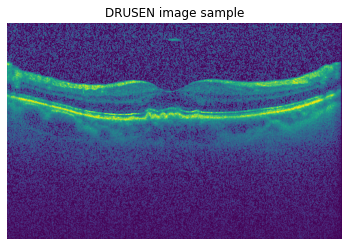

In [ ]:
img_array=plt.imread('/content/drive/MyDrive/OCT2017-Data/train/DRUSEN/DRUSEN-79215-1.jpeg') 
plt.imshow(img_array)
plt.title('DRUSEN image sample') 
plt.axis('off')
plt.show()

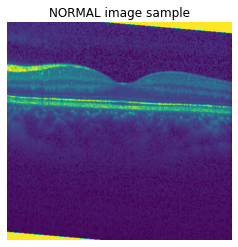

In [ ]:
img_array=plt.imread('/content/drive/MyDrive/OCT2017_2/OCT2017/train/NORMAL/NORMAL-112928-6.jpeg') 
plt.imshow(img_array)
plt.title('NORMAL image sample') 
plt.axis('off')
plt.show()

## <font color='blue'> Exploring main influential features as  predictors for classifying retina diseases </font>

### <font color='blue'> Feature Analyzing using PCA </font>

In [ ]:
import math

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(2250 / (1.0 * n)) 
# 1.0 above is to skip integer division

ptrain_label = []
ptrain_data = []

for i in range(0,int(number_generator)):
    ptrain_label.extend(np.array(train_generator1[i][1]))
    ptrain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
ptrain_label = np.array(ptrain_label)
ptrain_data = np.array(ptrain_data)

In [ ]:
np.array(ptrain_data).shape

(2250, 224, 224, 3)

In [ ]:
ptrain_data = ptrain_data.reshape([2250, 224*224*3])

In [ ]:

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(700 / (1.0 * n)) 
# 1.0 above is to skip integer division

ptest_label = []
ptest_data = []

for i in range(0,int(number_generator)):
    ptest_label.extend(np.array(test_generator1[i][1]))
    ptest_data.extend(np.array(test_generator1[i][0]))


In [ ]:
ptest_label = np.array(ptest_label)
ptest_data = np.array(ptest_data)

In [ ]:
ptest_data = ptest_data.reshape([750, 224*224*3])

In [ ]:
np.array(ptest_data).shape

(750, 150528)

In [ ]:

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(450 / (1.0 * n)) 
# 1.0 above is to skip integer division

pval_label = []
pval_data = []

for i in range(0,int(number_generator)):
    pval_label.extend(np.array(val_generator1[i][1]))
    pval_data.extend(np.array(val_generator1[i][0]))


In [ ]:
pval_label = np.array(pval_label)
pval_data = np.array(pval_data)

In [ ]:
pval_data = pval_data.reshape (450, 224*224*3)

224 . 224 . 3 = 150528 number of features

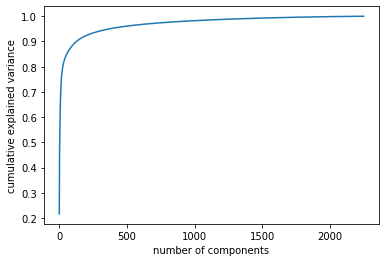

In [ ]:
from sklearn.decomposition import PCA

pca = PCA().fit(ptrain_data)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

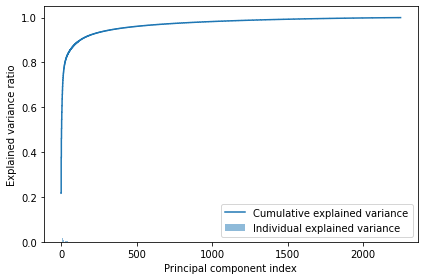

In [ ]:
exp_var_pca = pca.explained_variance_ratio_
#
# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

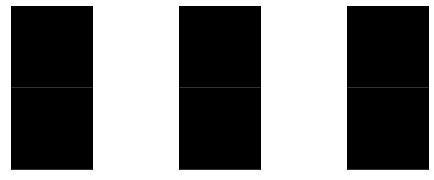

In [ ]:
from sklearn.decomposition import PCA
#n_components=0.80 means it will return the Eigenvectors that have the 80% of the variation in the dataset
#pca = PCA(n_components=28)
pca = PCA(0.80)
poct1 = pca.fit(ptrain_data)
poct2 = PCA(n_components=6).fit(ptrain_data)
fig, axes = plt.subplots(2,3,figsize=(9,3),
 subplot_kw={'xticks':[], 'yticks':[]},
 gridspec_kw=dict(hspace=0.01, wspace=0.01))
for i, ax in enumerate(axes.flat):
  ax.imshow(poct2.components_[i].reshape(224,224, 3).astype('uint8'), cmap='viridis')
 


In [ ]:
print(pca.explained_variance_ratio_)
len(pca.explained_variance_ratio_)

[0.21643405 0.15995832 0.08457466 0.04451961 0.04019431 0.03220138
 0.02963006 0.02878294 0.02077816 0.01880021 0.01756348 0.01503648
 0.01267169 0.01072526 0.00987053 0.00730039 0.00706642 0.00667332
 0.00587839 0.00533638 0.00476127 0.00445541 0.00418365 0.0038532
 0.00334024 0.00310093 0.00302444]


27

In [ ]:

import time

start1 = time.time()
start2 = time.clock()

%memit components = pca.transform(ptrain_data)


end1 = time.time()
end2 = time.clock()



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """


peak memory: 8182.44 MiB, increment: 62.42 MiB


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  # This is added back by InteractiveShellApp.init_path()


In [ ]:
duration1 = end1 - start1
duration2 = end2 - start2

print('duration time =', duration1, 'duration clock =',  duration2)

duration time = 2.0732028484344482 duration clock = 2.4379799999996976


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

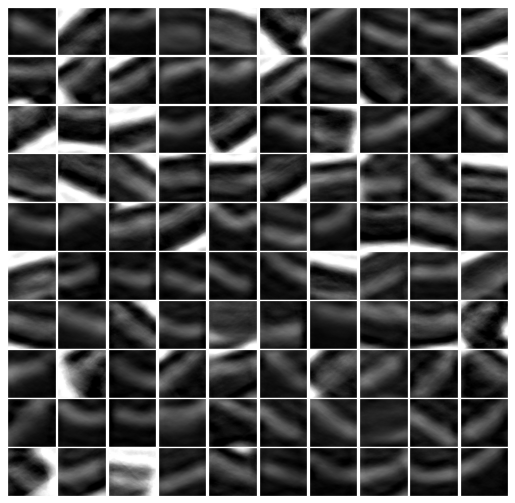

In [ ]:
projected = pca.inverse_transform(components)
fig, axes = plt.subplots(10,10,figsize=(9,9), subplot_kw={'xticks':[], 'yticks':[]},
            gridspec_kw=dict(hspace=0.01, wspace=0.01))
for i, ax in enumerate(axes.flat):
    img = projected[i].reshape(224, 224, 3)
    #img = img.astype(np.uint8)
    #img = img / 255
    ax.imshow(img, cmap='gray')

In [ ]:
import pickle

In [ ]:
filename = '/content/drive/MyDrive/OCT2017_2/pca_model.sav'
pickle.dump(pca, open(filename, 'wb'))

In [ ]:
!pwd

/content


In [ ]:

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(ptest_data, ptest_label)
print(result)

# <font color='YellowGreen'>Feature Selection</font>

### <font color='YellowGreen'>  Feature Selection using Machine Learning Techniques</font>

### <font color='green'> Using PCA for feature selection </font>

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 200, num = 5)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [20, 35]
#max_depth.append()
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [10, 57, 105, 152, 200], 'max_features': ['auto', 'sqrt'], 'max_depth': [20, 35], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 10, cv = 3, verbose=2, random_state=10, n_jobs = -1)
# Fit the random search model
rf_random.fit(ptrain_data, ptrain_label)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [20, 35],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [10, 57, 105, 152,
                                                         200]},
                   random_state=10, verbose=2)

In [ ]:
rf_random.best_params_


{'bootstrap': True,
 'max_depth': 35,
 'max_features': 'sqrt',
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'n_estimators': 105}

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=20, min_samples_leaf=1, min_samples_split=2, max_features='sqrt', n_estimators=105, bootstrap=False)


In [ ]:
from imblearn.ensemble import BalancedRandomForestClassifier


brforest = BalancedRandomForestClassifier(criterion='entropy', max_depth=20, min_samples_leaf=1, min_samples_split=2, max_features='sqrt', n_estimators=105, bootstrap=False)

In [ ]:
!pip -q install memory_profiler

In [ ]:
!pip install psutil # optional dependency for memory profiler to execute fast

In [ ]:
%load_ext  memory_profiler

In [ ]:
import time

start1 = time.time()
start2 = time.clock()

%memit brforest.fit(components, ptrain_label)

end1 = time.time()
end2 = time.clock()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  after removing the cwd from sys.path.


peak memory: 7518.83 MiB, increment: 24.20 MiB


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  if __name__ == '__main__':


In [ ]:
duration1 = end1 - start1
duration2 = end2 - start2

print('duration time =', duration1, 'duration clock =',  duration2)

duration time = 6.099987268447876 duration clock = 5.793768999999884


In [ ]:
filename = '/content/drive/MyDrive/OCT2017_2/bprforest_model.sav'
pickle.dump(rforest, open(filename, 'wb'))

In [ ]:

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(ptest_data, ptest_label)
print(result)

In [ ]:
pptest = pca.transform(ptest_data)
prf_pred = brforest.predict(pptest)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(ptest_label, prf_pred)

0.2946666666666667

In [ ]:
cm = confusion_matrix(ptest_label,prf_pred)
cm

array([[ 39,  30,  68,  60],
       [ 30,  26,  60,  74],
       [ 18,  17,  54,  90],
       [ 11,  16,  55, 102]])

In [ ]:
from sklearn.metrics import confusion_matrix

cnf_matrix = cm
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.42  0.136 0.284 0.592]
Specificity :  [0.87866667 0.912      0.78933333 0.564     ]
Precision :  [0.53571429 0.34       0.31004367 0.31157895]
FPR :  [0.12133333 0.088      0.21066667 0.436     ]
FNR :  [0.58  0.864 0.716 0.408]
Accuracy :  [0.764 0.718 0.663 0.571]


In [ ]:
tn, fp, fn, tp = confusion_matrix(ptest_label, prf_pred)
pca_specificity = tn / (tn+fp)
pca_sensitivity = tp / (tp+fn)
pca_precision = tp / (tp+fp)
pfnr = fn / (tp+fn)
pacc = (tp+tn)/(tp+tn+fn+fp)

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
print(classification_report(ptest_label, prf_pred))


              precision    recall  f1-score   support

         0.0       0.40      0.20      0.26       197
         1.0       0.29      0.14      0.19       190
         2.0       0.23      0.30      0.26       179
         3.0       0.31      0.55      0.40       184

    accuracy                           0.29       750
   macro avg       0.31      0.30      0.28       750
weighted avg       0.31      0.29      0.28       750



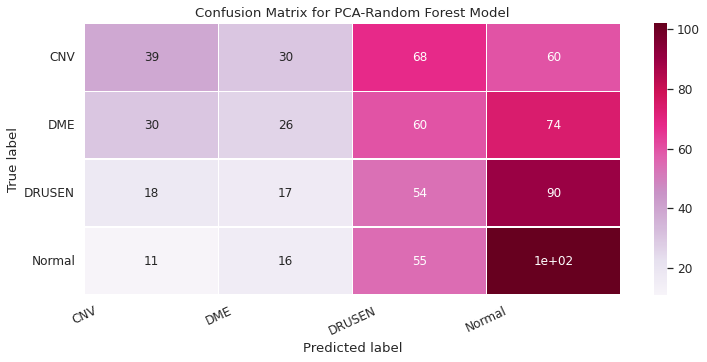

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(ptest_label, prf_pred)
#matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.1)
sns.heatmap(matrix, annot=True, annot_kws={'size':12},
            cmap=plt.cm.PuRd, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for PCA-Random Forest Model')
plt.show()

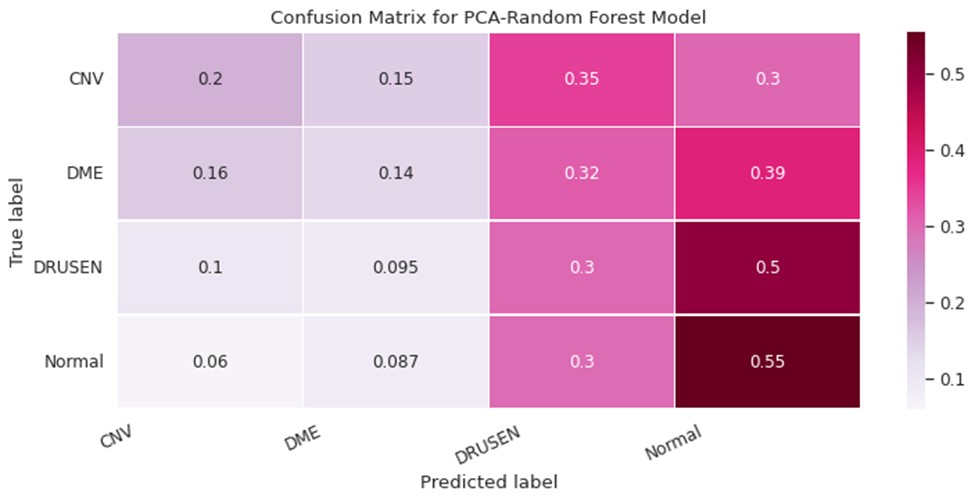

In [ ]:
ppval = pca.transform(pval_data)


In [ ]:
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score

cv = RepeatedKFold(n_splits=10, n_repeats=10, random_state=10)
scores = cross_val_score(rforest, pval_data, pval_label, scoring='accuracy', cv=cv)


In [ ]:
scores

array([0.75555556, 0.64444444, 0.68888889, 0.62222222, 0.82222222,
       0.82222222, 0.53333333, 0.71111111, 0.75555556, 0.66666667,
       0.75555556, 0.57777778, 0.68888889, 0.75555556, 0.73333333,
       0.68888889, 0.73333333, 0.66666667, 0.77777778, 0.75555556,
       0.8       , 0.66666667, 0.73333333, 0.71111111, 0.75555556,
       0.73333333, 0.57777778, 0.77777778, 0.64444444, 0.68888889,
       0.75555556, 0.68888889, 0.84444444, 0.68888889, 0.82222222,
       0.64444444, 0.55555556, 0.68888889, 0.75555556, 0.66666667,
       0.68888889, 0.64444444, 0.64444444, 0.82222222, 0.57777778,
       0.73333333, 0.82222222, 0.68888889, 0.68888889, 0.68888889,
       0.77777778, 0.73333333, 0.71111111, 0.66666667, 0.73333333,
       0.68888889, 0.62222222, 0.71111111, 0.75555556, 0.68888889,
       0.75555556, 0.73333333, 0.71111111, 0.71111111, 0.57777778,
       0.73333333, 0.75555556, 0.55555556, 0.75555556, 0.68888889,
       0.75555556, 0.75555556, 0.64444444, 0.8       , 0.66666

In [ ]:
print(np.mean(scores))

0.7062222222222221


In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, pval_data,pval_label, cv=5)
np.average(scores)
np.mean(scores)

0.6977777777777778

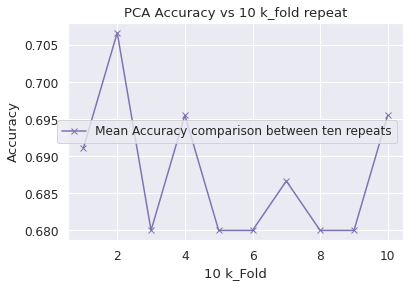

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=5, random_state=10, shuffle=True)
	scores = cross_val_score(rforest, pval_data, pval_label, scoring='accuracy', cv=cv)
	results.append(np.mean(scores))
 
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('PCA Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

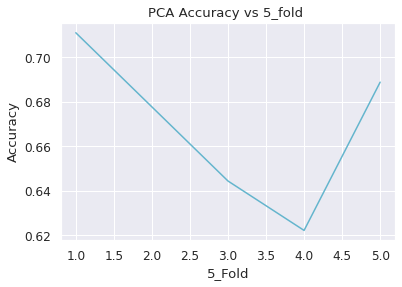

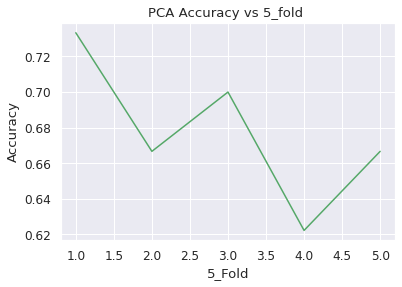

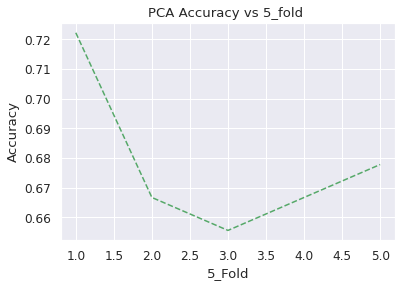

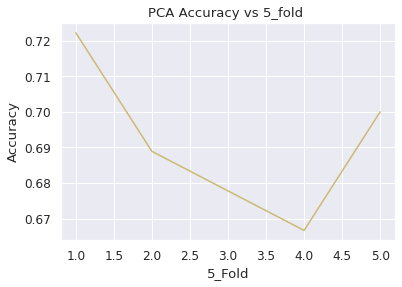

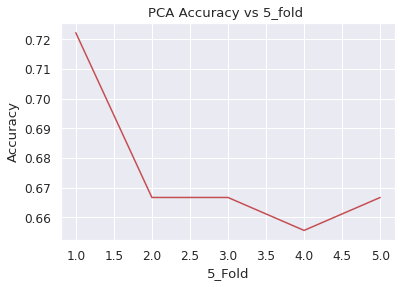

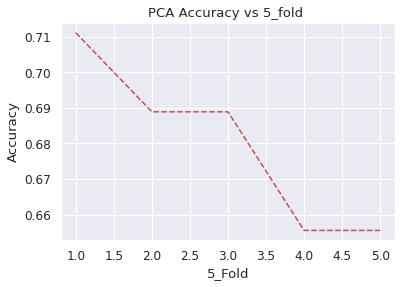

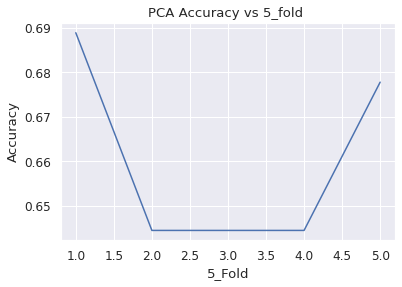

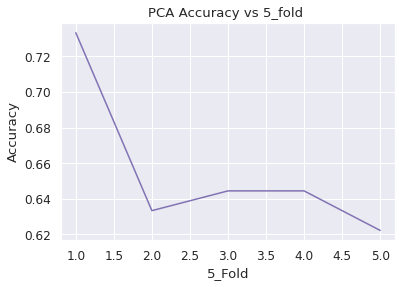

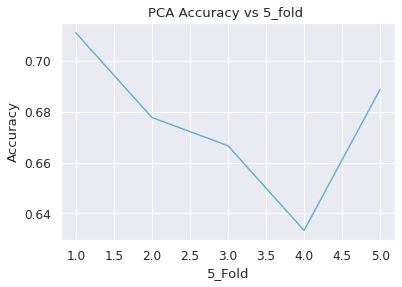

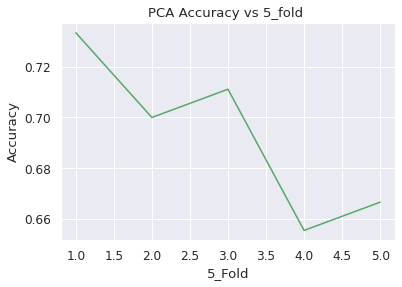

No handles with labels found to put in legend.


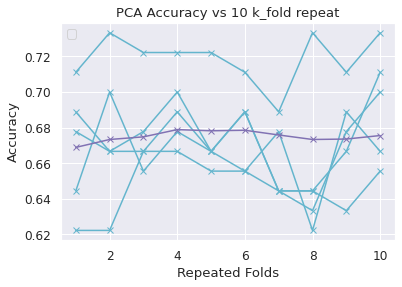

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, pval_data, pval_label, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('PCA Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('PCA Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(model, pval_data, pval_label, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
'''from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())'''


> folds=1, accuracy=0.671 (0.633,0.733)
> folds=2, accuracy=0.662 (0.644,0.722)
> folds=3, accuracy=0.671 (0.644,0.700)
> folds=4, accuracy=0.676 (0.656,0.689)
> folds=5, accuracy=0.684 (0.622,0.744)
> folds=6, accuracy=0.676 (0.633,0.733)
> folds=7, accuracy=0.682 (0.611,0.733)
> folds=8, accuracy=0.691 (0.678,0.711)
> folds=9, accuracy=0.676 (0.644,0.722)
> folds=10, accuracy=0.680 (0.633,0.756)


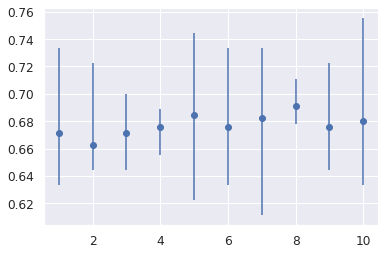

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

prf1 = RandomForestClassifier()
prf1.fit(pval_data, pval_label)
prf_score = prf1.predict_proba(pval_data)

#Binarize the output
prf_bin = label_binarize(pval_label, classes=[1, 2, 3, 4])
n_classes = prf_bin.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(prf_bin[:, i], prf_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


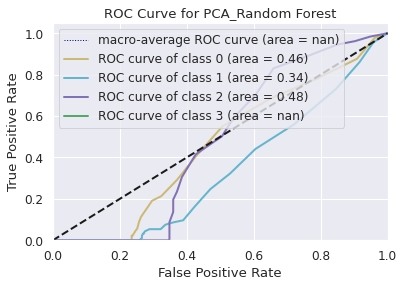

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=1,
)

colors = cycle(['y','c', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for PCA_Random Forest")
plt.legend(loc="upper left")
plt.show()

## <font color='YellowGreen'> Feature Selection Deep Learning </font>

## <font color='green'> Feature Selection Using CNN </font>



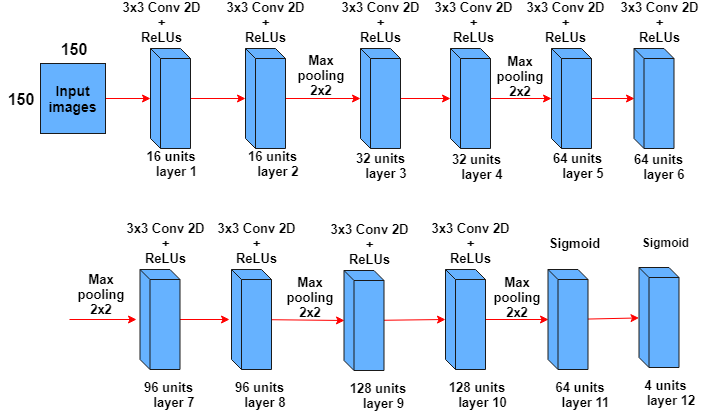

In [8]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import numpy as np
from tensorflow.keras.optimizers import SGD
from keras.layers import BatchNormalization

In [ ]:
'''
kcnn = Sequential()
kcnn.add(Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)))
kcnn.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Dropout(0.2))
kcnn.add(Conv2D(4, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Dropout(0.2))
'''

In [12]:

kcnn = Sequential()
kcnn.add(Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3), kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Dropout(0.2))
kcnn.add(Conv2D(4, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Dropout(0.2))



In [ ]:
kcnn.add(Flatten())

kcnn.add(Dense(4, activation='softmax'))

In [ ]:
kcnn.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_146 (Conv2D)         (None, 224, 224, 16)      448       
                                                                 
 conv2d_147 (Conv2D)         (None, 224, 224, 16)      2320      
                                                                 
 max_pooling2d_61 (MaxPoolin  (None, 112, 112, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_148 (Conv2D)         (None, 112, 112, 32)      4640      
                                                                 
 conv2d_149 (Conv2D)         (None, 112, 112, 32)      9248      
                                                                 
 max_pooling2d_62 (MaxPoolin  (None, 56, 56, 32)       0         
 g2D)                                                

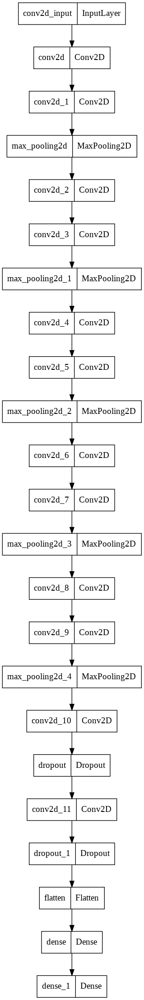

In [ ]:
plot_model(kcnn, to_file='kcnn.png')

In [ ]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

    train_path = data_dir+'/train'
    val_path = data_dir+'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN' ,'NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [ ]:
train_batches, val_batches, test_batches = Kermany2018(50, 224, '/content/drive/MyDrive/OCT2017-Data')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 50
epoch = 10
val_size = 501

In [ ]:
type(train_batches.labels)

numpy.ndarray

In [ ]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
import time 

In [ ]:
def clf_model(model):
  model = model
  model.compile(optimizer=opt1, loss='categorical_crossentropy', metrics=['accuracy'])
  return model

In [ ]:
clf = KerasClassifier(build_fn= lambda:clf_model(kcnn), verbose=0)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  """Entry point for launching an IPython kernel.


In [ ]:
#init = ['glorot_uniform', 'normal', 'uniform']
#n_iter = 15
#batches = np.array([150, 50])
epochs = [10, 5]

#param_grid = dict(batch_size=batches, epochs=epochs)

param_grid = dict(epochs=epochs)

grid = GridSearchCV(estimator=clf, param_grid=param_grid, cv=3)
grid_result = grid.fit(ptrain_data, ptrain_label)


#param_grid = dict(epochs=epochs, batch_size=batches)

#random_search = RandomizedSearchCV(estimator=clf, param_distributions=param_grid, n_iter=4)
#random_search.fit(ctrain_data, ctrain_label)

NameError: ignored

In [ ]:
grid.best_params_

In [ ]:
print("Best: %f using %s" % (random_search.best_score_, random_search.best_params_))
means = random_search.cv_results_['mean_test_score']
stds = random_search.cv_results_['std_test_score']
params = random_search.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017_2/kcnn-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [ ]:
from tensorflow.keras import optimizers

opt0 = tf.keras.optimizers.RMSprop(learning_rate=0.01)
opt1 = tf.keras.optimizers.SGD(learning_rate=0.01)
opt2 = tf.keras.optimizers.Adam()

#momentum=0.9

In [ ]:
!pip -q install memory_profiler

In [ ]:
!pip install psutil # optional dependency for memory profiler to execute fast

In [ ]:
%load_ext  memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
kcnn.compile(optimizer=opt1, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
import time
start1 = time.clock()
start2 = time.time()

%memit history = kcnn.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=epoch, class_weight=class_weight, verbose=1)

end1 = time.clock()
end2 = time.time()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  


Epoch 1/10
155/155 [==============================] - 121s 775ms/step - loss: 1.4048 - accuracy: 0.2539 - val_loss: 1.3903 - val_accuracy: 0.2096
Epoch 2/10
155/155 [==============================] - 120s 771ms/step - loss: 1.3908 - accuracy: 0.2379 - val_loss: 1.3797 - val_accuracy: 0.2854
Epoch 3/10
155/155 [==============================] - 119s 767ms/step - loss: 1.3856 - accuracy: 0.2738 - val_loss: 1.3875 - val_accuracy: 0.2635
Epoch 4/10
155/155 [==============================] - 120s 773ms/step - loss: 1.3881 - accuracy: 0.2439 - val_loss: 1.3833 - val_accuracy: 0.2695
Epoch 5/10
155/155 [==============================] - 119s 768ms/step - loss: 1.3868 - accuracy: 0.2437 - val_loss: 1.3818 - val_accuracy: 0.3293
Epoch 6/10
155/155 [==============================] - 119s 767ms/step - loss: 1.3876 - accuracy: 0.2520 - val_loss: 1.3820 - val_accuracy: 0.3393
Epoch 7/10
155/155 [==============================] - 120s 772ms/step - loss: 1.3857 - accuracy: 0.2639 - val_loss: 1.3807 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  import sys


In [ ]:
d2= end2 - start2
d1 = end1 - start1

print('Duration time =', d1, 'Duration Clock=', d2)

Duration time = 1243.142269 Duration Clock= 1317.9225404262543


In [ ]:
best_epoch_model = np.argmin(history.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, history.history['val_loss'][best_epoch_model], history.history['val_accuracy'][best_epoch_model]))

best epoch:7 validation loss:1.383 validation acc:0.407


In [ ]:
from keras.models import model_from_json
from keras.models import load_model

# serialize model to JSON
#  the keras model which is trained is defined as 'model' in this example
kcnn_json = kcnn.to_json()


with open("model_num.json", "w") as json_file:
    json_file.write(kcnn_json)

# serialize weights to HDF5

kcnn.save_weights("/content/drive/MyDrive/OCT2017-Data/kcnn_w.h5")
# creates a HDF5 file 'my_model.h5'
kcnn.save('/content/drive/MyDrive/OCT2017-Data/kcnn.h5')  

In [ ]:
# load json and create model
json_file = open('/content/drive/MyDrive/OCT2017-Data/kcnn_jason.json', 'r')

loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

# load weights into new model
loaded_model.load_weights("/content/drive/MyDrive/OCT2017-Data/kcnn_w.h5")
print("Loaded model from disk")

loaded_model.save('/content/drive/MyDrive/OCT2017-Data/kcnn.hdf5')
loaded_model=load_model('/content/drive/MyDrive/OCT2017-Data/kcnn.hdf5')

In [ ]:
kcnn.layers[17]._name='conv11'
print(kcnn.layers[17].name)

conv11


In [ ]:
from keras.models import Model

#layer_name = 'conv11'
kcnn_base = Model(inputs=kcnn.input, outputs=kcnn.get_layer('conv11').output)
#kcnn_output = kcnn_base.predict(test_batches)

In [ ]:
def cnn_extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 7, 7, 4))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(224, 224),
      batch_size = batch_size,
      class_mode ='binary')
 

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = kcnn_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [ ]:
batch_size = 50
epoch = 10

In [ ]:
train_featurec, train_labelc = cnn_extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
validation_featurec, validation_labelc = cnn_extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
test_featurec, test_labelc = cnn_extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
train_featurec = np.reshape(train_featurec, (7752, 7 * 7 * 4))
validation_featurec = np.reshape(validation_featurec, (501, 7 * 7 * 4))
test_featurec = np.reshape(test_featurec, (1000, 7 * 7 * 4))

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')


In [ ]:
start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit rforest.fit(train_featurec, train_labelc)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.


peak memory: 9860.26 MiB, increment: 0.00 MiB


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 19.608580999998594 duration2= 19.789130449295044


In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'cnn-forest_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, validation_featurec, validation_labelc, cv=5)
np.average(scores)
np.mean(scores)

0.4231683168316832

In [ ]:
cnr_pred = rforest.predict(test_featurec)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_labelc, cnr_pred)


0.35

In [ ]:
cm = confusion_matrix(test_labelc, cnr_pred)
cm

array([[102,  34,  51,  63],
       [ 64,  42,  50,  94],
       [ 49,  26,  76,  99],
       [ 23,  38,  59, 130]])

In [ ]:
from sklearn.metrics import confusion_matrix

cnf_matrix = cm
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.408 0.168 0.304 0.52 ]
Specificity :  [0.81866667 0.86933333 0.78666667 0.65866667]
Precision :  [0.42857143 0.3        0.3220339  0.33678756]
FPR :  [0.18133333 0.13066667 0.21333333 0.34133333]
FNR :  [0.592 0.832 0.696 0.48 ]
Accuracy :  [0.716 0.694 0.666 0.624]


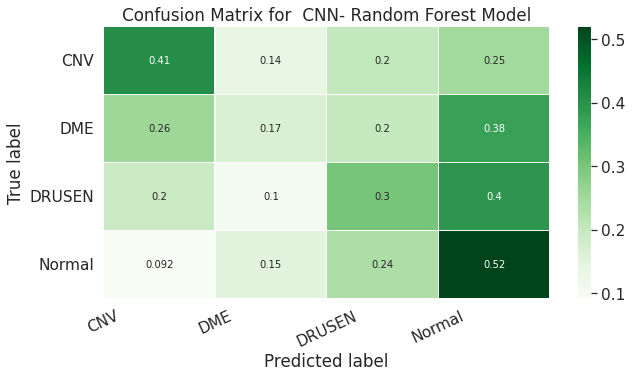

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(test_labelc, cnr_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for  CNN- Random Forest Model')
plt.show()

In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

cn_score = rforest.predict_proba(test_featurec)

#Binarize the output
cn_bin = label_binarize(test_labelc, classes=[1, 2, 3, 4])
n_classes = cn_bin.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(cn_bin[:, i], cn_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


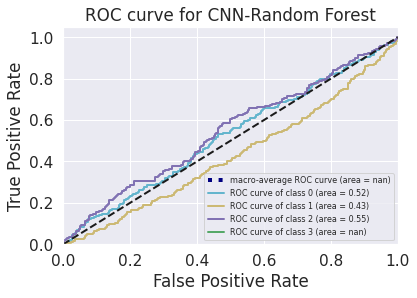

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['c', 'y', 'm' , 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC curve for CNN-Random Forest")
plt.legend(loc="lower right", fontsize=8)
plt.show()

In [ ]:
print(classification_report(test_labelc, cnr_pred))


              precision    recall  f1-score   support

         0.0       0.43      0.41      0.42       250
         1.0       0.30      0.17      0.22       250
         2.0       0.32      0.30      0.31       250
         3.0       0.34      0.52      0.41       250

    accuracy                           0.35      1000
   macro avg       0.35      0.35      0.34      1000
weighted avg       0.35      0.35      0.34      1000



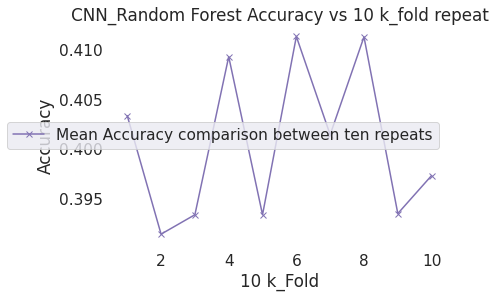

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	rfc_scores = cross_val_score(rforest, validation_featurec, validation_labelc, scoring='accuracy', cv=cv)
	results.append(np.mean(rfc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('CNN_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

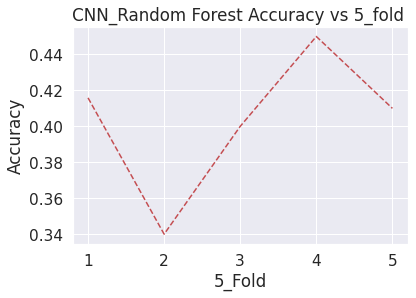

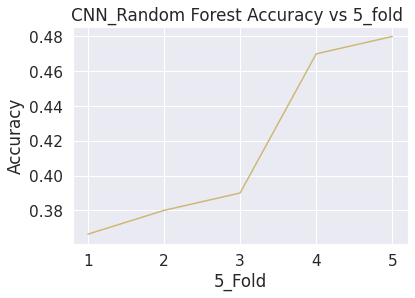

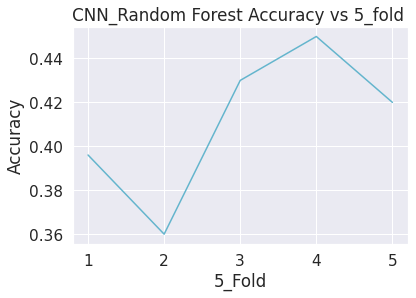

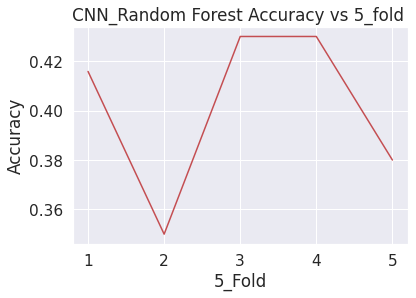

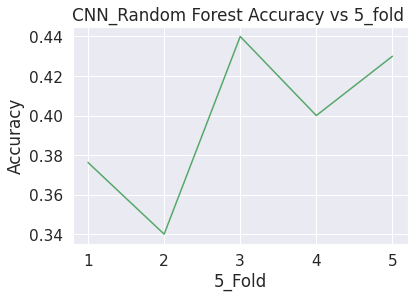

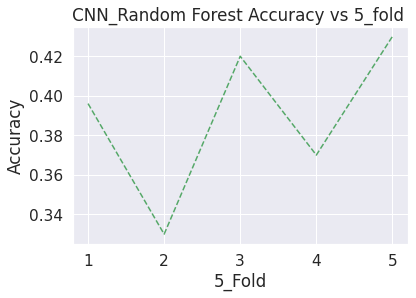

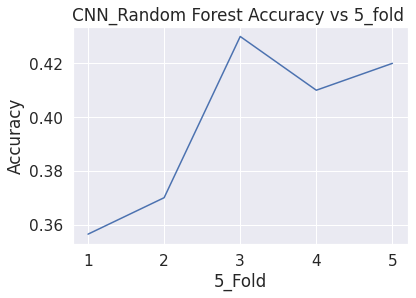

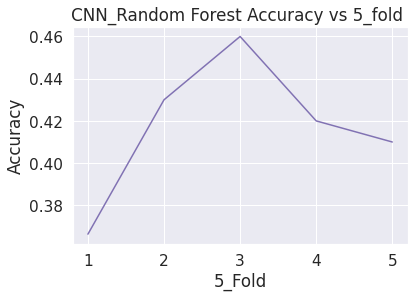

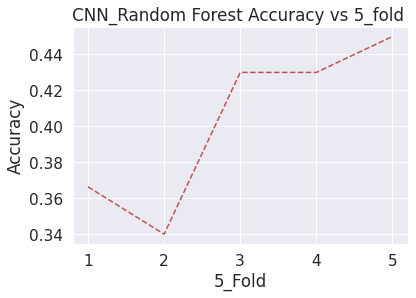

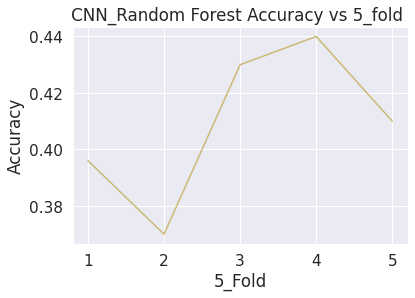

No handles with labels found to put in legend.


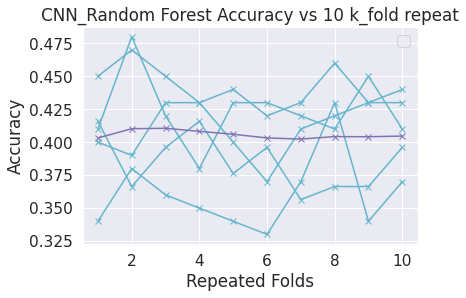

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, validation_featurec, validation_labelc, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('CNN_Random Forest Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('CNN_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
'''
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(rforest, validation_featurec, validation_labelc, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()
	'''

In [ ]:
'''
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())
'''


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/backend/resource_tracker.py:120: UserWarning: resource_tracker: process died unexpectedly, relaunching.  Some folders/sempahores might leak.
  warnings.warn('resource_tracker: process died unexpectedly, '


> folds=1, accuracy=0.689 (0.630,0.730)
> folds=2, accuracy=0.693 (0.670,0.720)
> folds=3, accuracy=0.671 (0.600,0.730)
> folds=4, accuracy=0.677 (0.660,0.690)
> folds=5, accuracy=0.677 (0.630,0.740)
> folds=6, accuracy=0.685 (0.650,0.720)
> folds=7, accuracy=0.687 (0.650,0.710)
> folds=8, accuracy=0.689 (0.660,0.750)
> folds=9, accuracy=0.693 (0.660,0.720)
> folds=10, accuracy=0.679 (0.640,0.730)


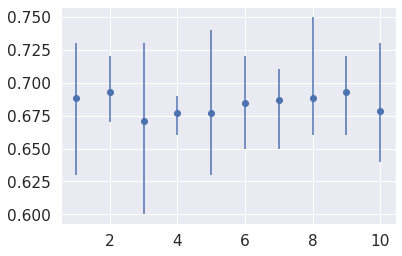

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

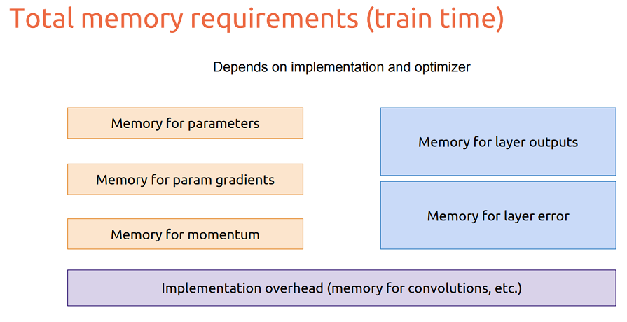

## <font color='YellowGreen'> Feature Selection Using Pretrained Networks </font>



## <font color='Green'> Feature Selection Using VGGNet16 </font>


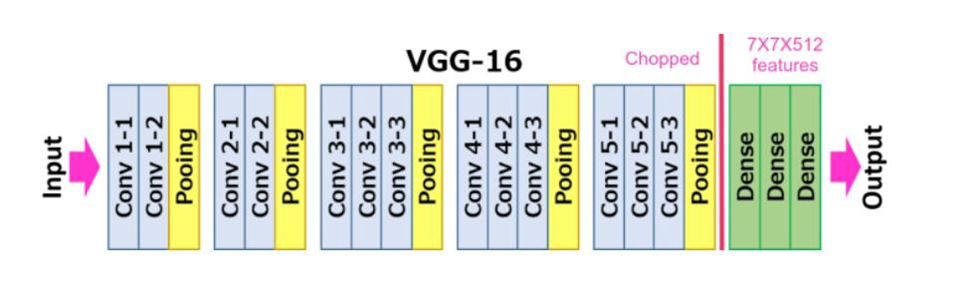

In [ ]:

from keras.applications.vgg16 import VGG16
vgg_16 = VGG16()

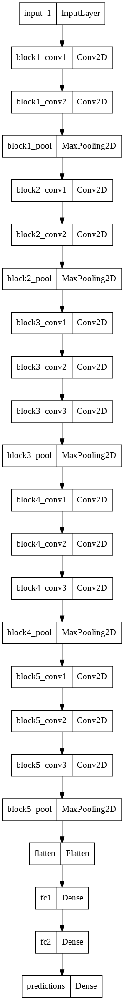

In [ ]:
from keras.utils.vis_utils import plot_model

plot_model(vgg_16, to_file='vgg.png')

In [ ]:
# load the model

print(vgg_16.summary())

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 50
epoch = 20
val_size = 501



In [ ]:
vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in vgg16_base.layers:
            layer.trainable = False

vgg16_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
def extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 7, 7, 512))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(224, 224),
      batch_size=batch_size,
      class_mode='binary')
 

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = vgg16_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [ ]:
% memit train_features, train_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
% memit val_features, val_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
% memit test_features, test_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
peak memory: 9399.34 MiB, increment: 78.43 MiB
Found 501 images belonging to 4 classes.
peak memory: 9411.14 MiB, increment: 11.80 MiB
Found 1000 images belonging to 4 classes.
peak memory: 9412.08 MiB, increment: 0.94 MiB


In [ ]:
train_features = np.reshape(train_features, (7752, 7 * 7 * 512))
validation_features = np.reshape(val_features, (501, 7 * 7 * 512))
test_features = np.reshape(test_features, (1000, 7* 7 * 512))

In [ ]:
'''
from imblearn.ensemble import BalancedRandomForestClassifier

brfoest = BalancedRandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')
'''

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')


In [ ]:
start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit rforest.fit(train_features, train_labels)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.


peak memory: 10133.59 MiB, increment: 723.80 MiB


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 65.6622870000001 duration2= 65.5946478843689


In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'vgg-forest_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, validation_features, val_labels, cv=5)
np.average(scores)
np.mean(scores)

0.5509504950495049

In [ ]:
vr_pred = rforest.predict(test_features)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_labels, vr_pred)


0.712

In [ ]:
cm = confusion_matrix(test_labels, vr_pred)
cm

array([[228,   8,   9,   5],
       [ 24, 121,   5, 100],
       [107,   5, 119,  19],
       [  0,   6,   0, 244]])

In [ ]:
from sklearn.metrics import confusion_matrix

cnf_matrix = cm
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.912 0.484 0.476 0.976]
Specificity :  [0.82533333 0.97466667 0.98133333 0.83466667]
Precision :  [0.63509749 0.86428571 0.89473684 0.66304348]
FPR :  [0.17466667 0.02533333 0.01866667 0.16533333]
FNR :  [0.088 0.516 0.524 0.024]
Accuracy :  [0.847 0.852 0.855 0.87 ]


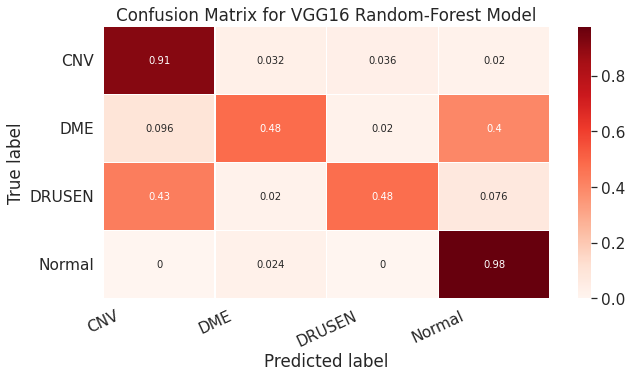

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(test_labels, vr_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Reds, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for VGG16 Random-Forest Model')
plt.show()

In [ ]:
print(classification_report(test_labels, vr_pred))


              precision    recall  f1-score   support

         0.0       0.64      0.91      0.75       250
         1.0       0.86      0.48      0.62       250
         2.0       0.89      0.48      0.62       250
         3.0       0.66      0.98      0.79       250

    accuracy                           0.71      1000
   macro avg       0.76      0.71      0.70      1000
weighted avg       0.76      0.71      0.70      1000



In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize


vg_score = rforest.predict_proba(test_features)

#Binarize the output
vg_bin = label_binarize(test_labels, classes=[1, 2, 3, 4])
n_classes = vg_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(vg_bin[:, i], vg_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


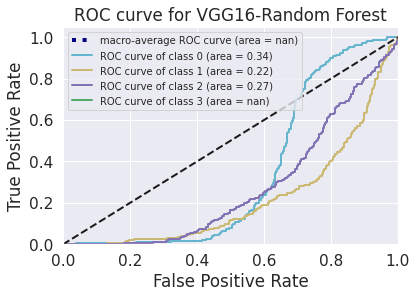

In [ ]:
from cycler import cycle
import matplotlib
import matplotlib.pyplot as plt


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['c', 'y', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )
#ax, fig = plt.subplots(1,1)
#font = {'size': 10}
#matplotlib.rc('font', **font)
#plt.rcParams.update({'font.size': 12})

plt.rc('legend', fontsize=10)

ax.set_facecolor('white')
plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC curve for VGG16-Random Forest")
plt.legend(loc="upper left")
plt.show()

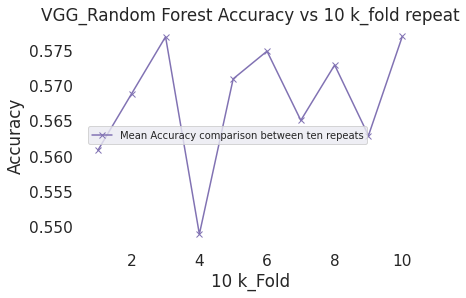

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	rfc_scores = cross_val_score(rforest, validation_features, val_labels, scoring='accuracy', cv=cv)
	results.append(np.mean(rfc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('VGG_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

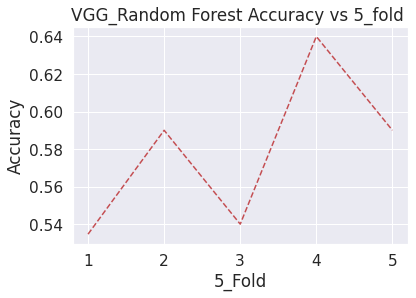

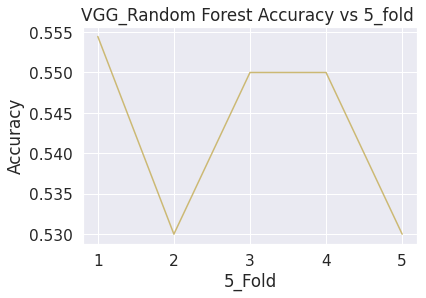

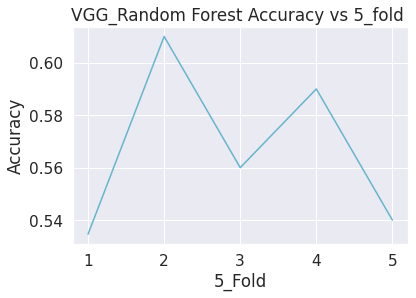

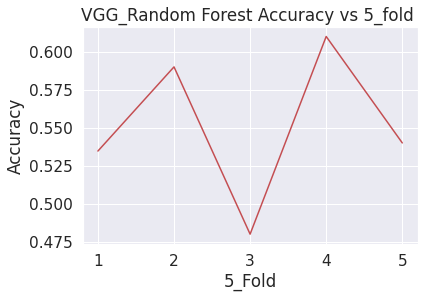

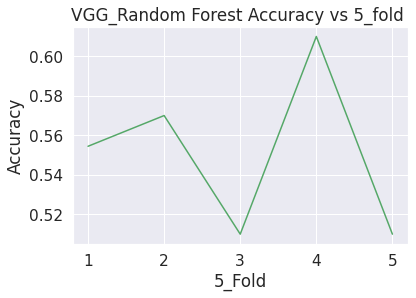

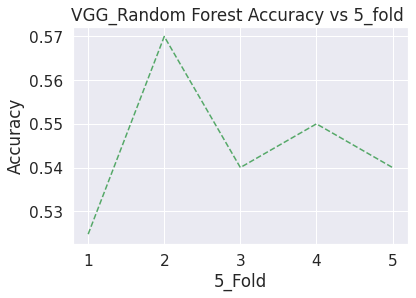

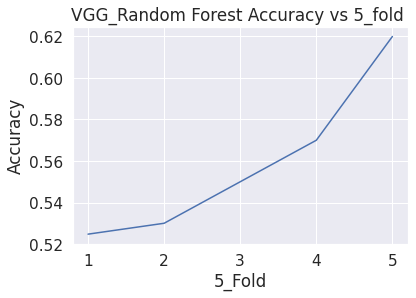

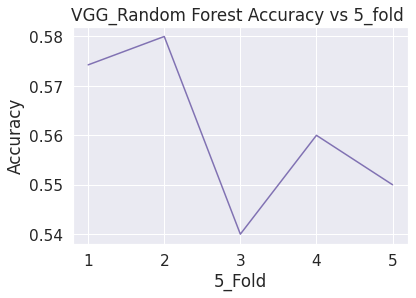

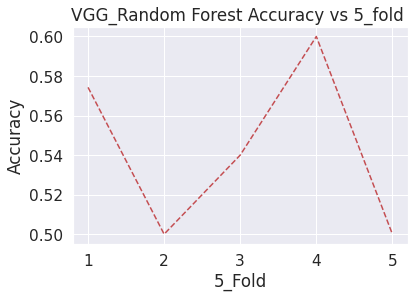

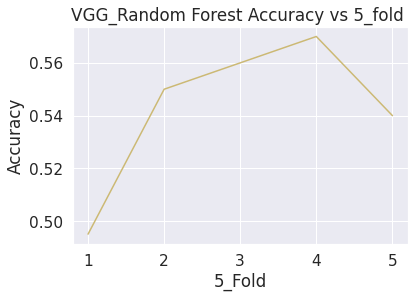

No handles with labels found to put in legend.


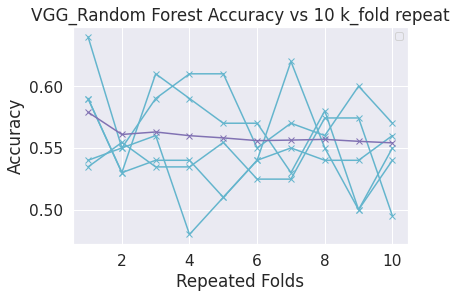

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, validation_features, val_labels, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('VGG_Random Forest Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('VGG_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
'''
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(rforest, validation_features, val_labels, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()
	'''

In [ ]:
'''
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())
'''


> folds=1, accuracy=0.491 (0.430,0.540)
> folds=2, accuracy=0.487 (0.440,0.545)
> folds=3, accuracy=0.489 (0.440,0.530)
> folds=4, accuracy=0.491 (0.440,0.554)
> folds=5, accuracy=0.463 (0.440,0.490)
> folds=6, accuracy=0.495 (0.450,0.530)
> folds=7, accuracy=0.497 (0.450,0.535)
> folds=8, accuracy=0.477 (0.390,0.520)
> folds=9, accuracy=0.475 (0.450,0.505)
> folds=10, accuracy=0.469 (0.410,0.510)


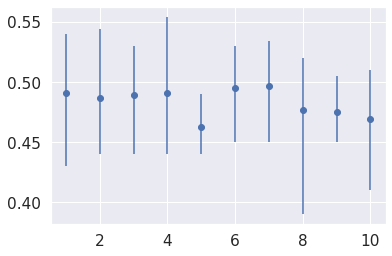

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

## <font color='green'>Feature Selection Using ResNet50</font>





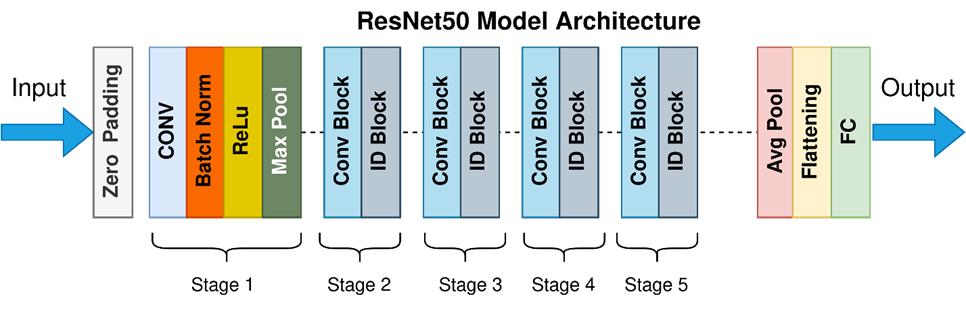

In [ ]:
#from tf.keras.applications.resnet50 import ResNet50

resnet_50 = tf.keras.applications.resnet50.ResNet50()

resnet_50.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [ ]:
resnet50_base = tf.keras.applications.resnet50.ResNet50(weights='imagenet', include_top=False, input_shape=(150,150, 3))
resnet50_base.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 156, 156, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 75, 75, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 75, 75, 64)   256         ['conv1_conv[0][0]']      

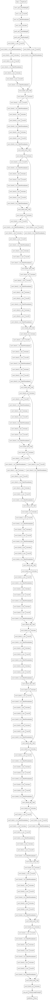

In [ ]:
plot_model(resnet_50, to_file='resnet.png')

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
epoch = 20
batch_size = 50

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
def r_extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 5, 5, 512 * 4))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(150, 150),
      batch_size=batch_size,
      class_mode='binary')

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = resnet50_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 50
epoch = 20
val_size = 501

In [ ]:
train_feature, train_label = r_extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
val_feature, val_label = r_extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
test_feature, test_label = r_extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
np.array(test_feature).shape

(1000, 5, 5, 2048)

In [ ]:
train_feature = np.reshape(train_feature, (7752, 5 * 5 * 2048))
val_feature = np.reshape(val_feature, (501, 5 * 5 * 2048))
test_feature = np.reshape(test_feature, (1000, 5 * 5 * 2048))

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')


In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit rforest.fit(train_feature, train_label)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


peak memory: 9727.44 MiB, increment: 0.02 MiB


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 34.77340400000003 duration2= 34.84650635719299


In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'resnet-forest_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, val_feature, val_label, cv=5)
np.average(scores)
np.mean(scores)

0.4511089108910891

In [ ]:
rrs_pred = rforest.predict(test_feature)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_label, rrs_pred)


0.371

In [ ]:
cm = confusion_matrix(test_label, rrs_pred)
cm

array([[109,  28,  41,  72],
       [ 56,  30,  46, 118],
       [ 45,  22,  66, 117],
       [ 13,  14,  57, 166]])

In [ ]:
'''
tn, fp, fn, tp = confusion_matrix(test_label, rrs_pred)
rs_specificity = tn / (tn+fp)
rs_sensitivity = tp / (tp+fn)
rs_precision = tp / (tp+fp)
rfnr = fn /(fn+tp)
racc = (tp+tn) / (tp+tn+fp+fn)

# fnr = 1 - sensitivity
'''

In [ ]:
from sklearn.metrics import confusion_matrix

cnf_matrix = cm
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.436 0.12  0.264 0.664]
Specificity :  [0.848      0.91466667 0.808      0.59066667]
Precision :  [0.48878924 0.31914894 0.31428571 0.35095137]
FPR :  [0.152      0.08533333 0.192      0.40933333]
FNR :  [0.564 0.88  0.736 0.336]
Accuracy :  [0.745 0.716 0.672 0.609]


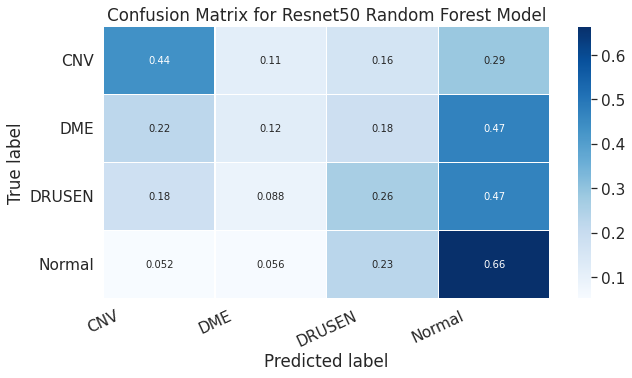

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(test_label, rrs_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Blues, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Resnet50 Random Forest Model')
plt.show()

In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

#test_labelz = test_labelz.reshape(-1,1)
rs_score = rforest.predict_proba(test_feature)

#Binarize the output
rs_bin = label_binarize(test_label, classes=[1, 2, 3, 4])
n_classes = rs_bin.shape[1]

#zf_score = zf_score.reshape(-1,1)
#val_pred  = val_pred.reshape(-1,1)
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(rs_bin[:, i], rs_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
#fpr["micro"], tpr["micro"], _ = metrics.roc_curve(test_labelz.ravel(), rzf_pred.ravel())
#roc_auc["micro"] = metrics.auc(fpr["micro"], tpr["micro"])

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


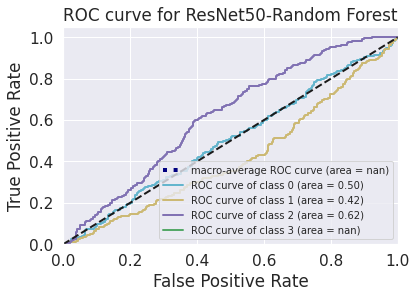

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])

'''# Plot all ROC curves
plt.figure()
plt.plot(
    fpr["micro"],
    tpr["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="deeppink",
    linestyle=":",
    linewidth=4,
)
'''
plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['c', 'y', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )
plt.rc('legend', fontsize=10)
plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC curve for ResNet50-Random Forest")
plt.legend(loc="lower right")
plt.show()



In [ ]:
print(classification_report(test_label, rrs_pred))


              precision    recall  f1-score   support

         0.0       0.49      0.44      0.46       250
         1.0       0.32      0.12      0.17       250
         2.0       0.31      0.26      0.29       250
         3.0       0.35      0.66      0.46       250

    accuracy                           0.37      1000
   macro avg       0.37      0.37      0.35      1000
weighted avg       0.37      0.37      0.35      1000



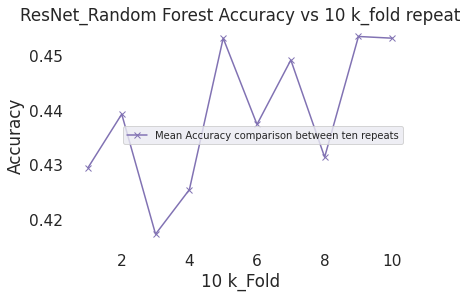

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	rfc_scores = cross_val_score(rforest, val_feature, val_label, scoring='accuracy', cv=cv)
	results.append(np.mean(rfc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('ResNet_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

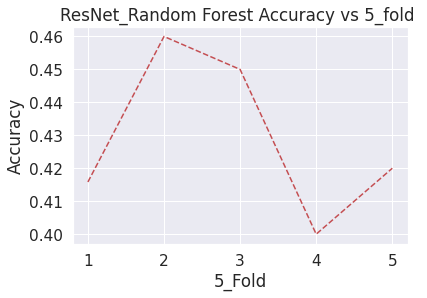

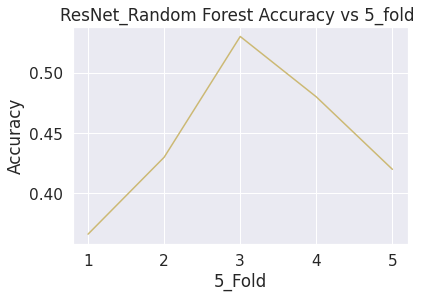

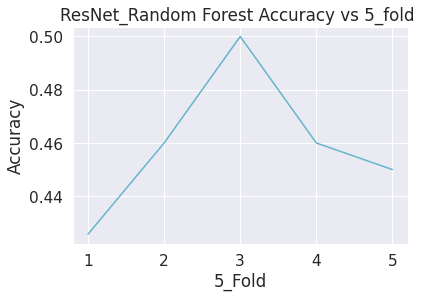

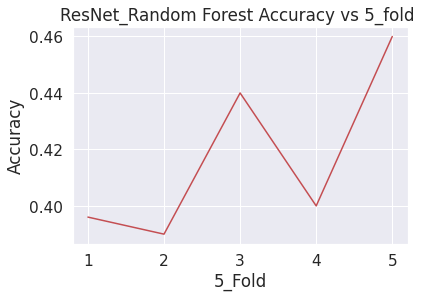

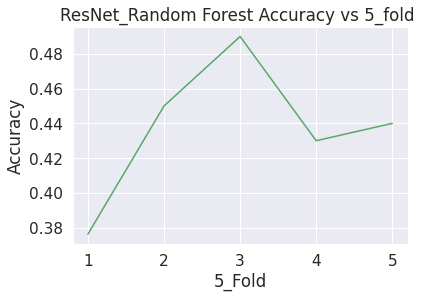

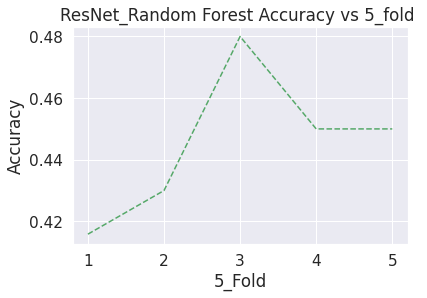

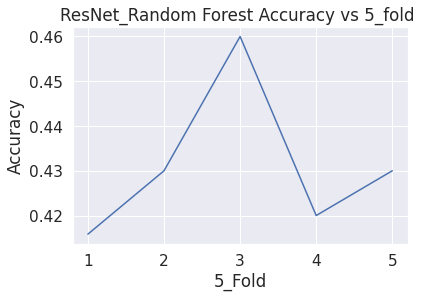

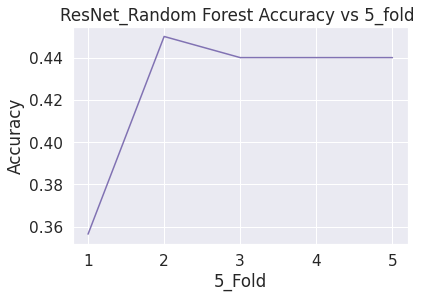

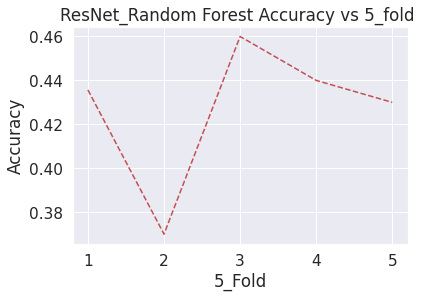

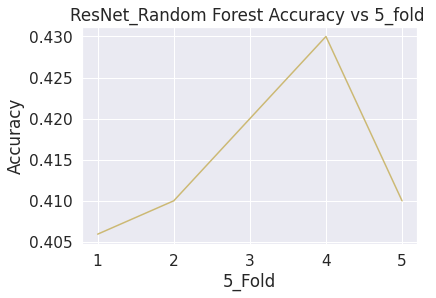

No handles with labels found to put in legend.


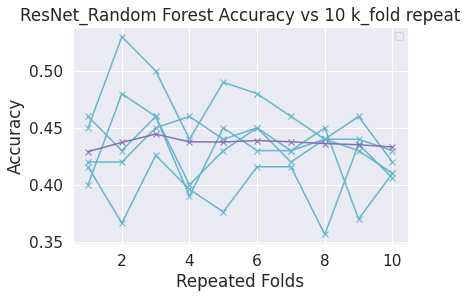

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, val_feature, val_label, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('ResNet_Random Forest Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('ResNet_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
'''def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(rforest, val_feature, val_label, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()'''

In [ ]:
'''from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())'''


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/backend/resource_tracker.py:120: UserWarning: resource_tracker: process died unexpectedly, relaunching.  Some folders/sempahores might leak.
  warnings.warn('resource_tracker: process died unexpectedly, '


> folds=1, accuracy=0.687 (0.670,0.730)
> folds=2, accuracy=0.671 (0.653,0.710)
> folds=3, accuracy=0.677 (0.620,0.750)
> folds=4, accuracy=0.687 (0.650,0.740)
> folds=5, accuracy=0.687 (0.620,0.730)
> folds=6, accuracy=0.685 (0.640,0.713)
> folds=7, accuracy=0.675 (0.644,0.720)
> folds=8, accuracy=0.675 (0.650,0.700)
> folds=9, accuracy=0.689 (0.640,0.750)
> folds=10, accuracy=0.671 (0.650,0.700)


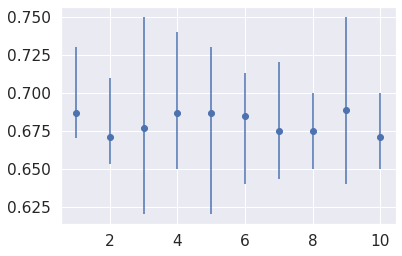

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

# <font color='YellowGreen'> Using U-like Architecture to extract Features </font>

## <font color='green'> Feature Selection Using ZFNet </font>




In [ ]:
#coding=utf-8  
from keras.models import Sequential  
from keras.layers import Dense,Flatten,Dropout  
from keras.layers.convolutional import Conv2D,MaxPooling2D  
from keras.utils.np_utils import to_categorical  
import numpy as np  
seed = 7  
np.random.seed(seed)  
  
zf = Sequential()  
zf.add(Conv2D(96,(7,7),strides=(2,2),input_shape=(224,224,3),padding='valid',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(256,(5,5),strides=(2,2),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(256,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Flatten())  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4,activation='softmax'))  
zf.summary()  

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 109, 109, 96)      14208     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 96)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 27, 27, 256)       614656    
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 13, 13, 256)      0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 13, 13, 384)       885120    
                                                                 
 conv2d_8 (Conv2D)           (None, 13, 13, 384)      

In [ ]:
zf.compile(loss='categorical_crossentropy',optimizer='sgd', metrics='accuracy')  


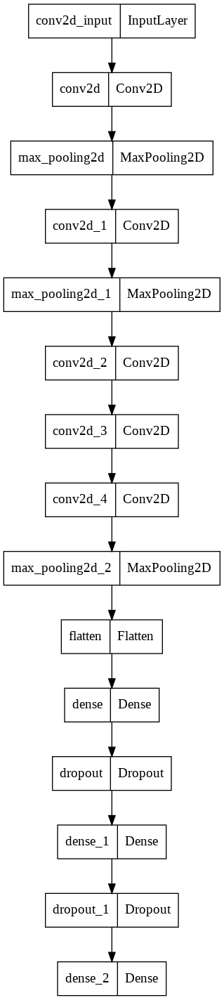

In [ ]:
plot_model(zf, to_file='zfnet.png')

In [ ]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

    train_path = data_dir+'/train'
    val_path = data_dir+'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN','NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [ ]:
train_batchez, val_batchez, test_batchez = Kermany2018(50, 224, '/content/drive/MyDrive/OCT2017-Data/')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 50
epoch = 20
val_size = 501

In [ ]:
np.array(train_batchez[0][1]).shape

(50, 4)

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
import time

start1 = time.clock()
start2 = time.time()


%memit history_zf = zf.fit(train_batchez, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batchez, epochs=epoch, verbose=1)

end1 = time.clock()
end2 = time.time()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/10
155/155 [==============================] - 119s 770ms/step - loss: 0.8959 - accuracy: 0.6249 - val_loss: 0.8516 - val_accuracy: 0.6627
Epoch 2/10
155/155 [==============================] - 118s 763ms/step - loss: 0.8717 - accuracy: 0.6311 - val_loss: 0.8869 - val_accuracy: 0.6607
Epoch 3/10
155/155 [==============================] - 119s 764ms/step - loss: 0.8501 - accuracy: 0.6385 - val_loss: 0.7732 - val_accuracy: 0.6986
Epoch 4/10
155/155 [==============================] - 118s 760ms/step - loss: 0.8324 - accuracy: 0.6546 - val_loss: 0.7871 - val_accuracy: 0.6886
Epoch 5/10
155/155 [==============================] - 119s 764ms/step - loss: 0.8018 - accuracy: 0.6723 - val_loss: 0.8162 - val_accuracy: 0.6707
Epoch 6/10
155/155 [==============================] - 118s 762ms/step - loss: 0.7886 - accuracy: 0.6686 - val_loss: 0.7509 - val_accuracy: 0.7046
Epoch 7/10
155/155 [==============================] - 118s 761ms/step - loss: 0.7673 - accuracy: 0.6813 - val_loss: 0.7702 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  if __name__ == '__main__':


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 30.546428000000006 duration2= 30.57327961921692


In [ ]:
zf.layers[7]._name='conv4'
print(zf.layers[7].name)

conv4


In [ ]:
from keras.models import Model

#layer_name = 'conv4'
zf_base = Model(inputs=zf.input, outputs=zf.get_layer('conv4').output)
#zf_output = zf_base.predict(test_batches)

In [ ]:
def z_extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 6, 6, 256))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(224, 224),
      batch_size=batch_size,
      class_mode='binary')
 

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = zf_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [ ]:
batch_size = 50
epoch = 10 

In [ ]:
train_featurez, train_labelz = z_extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
validation_featurez, validation_labelz = z_extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
test_featurez, test_labelz = z_extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
train_featurez = np.reshape(train_featurez, (7752, 6 * 6 * 256))
validation_featurez = np.reshape(validation_featurez, (501, 6 * 6 * 256))
test_featurez = np.reshape(test_featurez, (1000, 6 * 6 * 256))

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')


In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit rforest.fit(train_featurez, train_labelz)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


peak memory: 9315.97 MiB, increment: 0.00 MiB


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 64.8525239999999 duration2= 64.78346014022827


In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'zfnet-forest_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, validation_featurez, validation_labelz, cv=5)
np.average(scores)
np.mean(scores)

0.6786138613861386

In [ ]:
rzf_pred = rforest.predict(test_featurez)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_labelz, rzf_pred)


0.776

In [ ]:
cm = confusion_matrix(test_labelz, rzf_pred)
cm

array([[230,  10,   9,   1],
       [ 21, 147,  40,  42],
       [ 36,  18, 166,  30],
       [  0,   4,  13, 233]])

In [ ]:
from sklearn.metrics import confusion_matrix

cnf_matrix = cm
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.92  0.588 0.664 0.932]
Specificity :  [0.924      0.95733333 0.91733333 0.90266667]
Precision :  [0.80139373 0.82122905 0.72807018 0.76143791]
FPR :  [0.076      0.04266667 0.08266667 0.09733333]
FNR :  [0.08  0.412 0.336 0.068]
Accuracy :  [0.923 0.865 0.854 0.91 ]


In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

#test_labelz = test_labelz.reshape(-1,1)
zf_score = rforest.predict_proba(test_featurez)

#Binarize the output
zf_bin = label_binarize(test_labelz, classes=[1, 2, 3, 4])
n_classes = zf_bin.shape[1]

#zf_score = zf_score.reshape(-1,1)
#val_pred  = val_pred.reshape(-1,1)
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(zf_bin[:, i], zf_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
#fpr["micro"], tpr["micro"], _ = metrics.roc_curve(test_labelz.ravel(), rzf_pred.ravel())
#roc_auc["micro"] = metrics.auc(fpr["micro"], tpr["micro"])

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


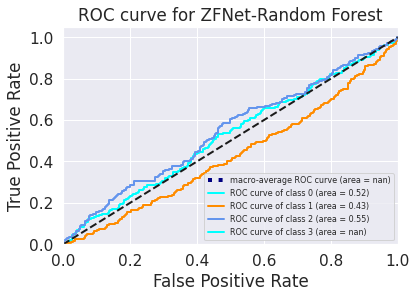

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])

'''# Plot all ROC curves
plt.figure()
plt.plot(
    fpr["micro"],
    tpr["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="deeppink",
    linestyle=":",
    linewidth=4,
)
'''
plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC curve for ZFNet-Random Forest")
plt.legend(loc="lower right", fontsize='8')
plt.show()

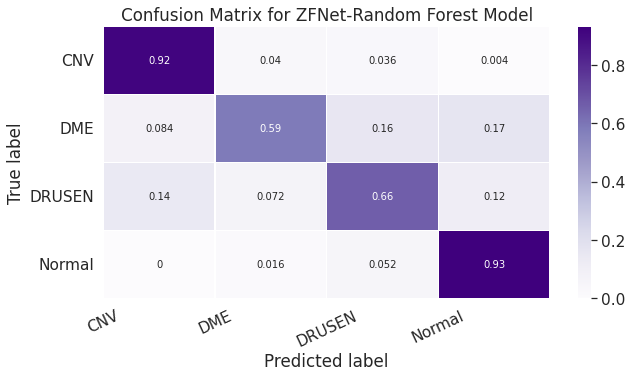

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(test_labelz, rzf_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Purples, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN','Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for ZFNet-Random Forest Model')
plt.show()

In [ ]:
print(classification_report(test_labelz, rzf_pred))


              precision    recall  f1-score   support

         0.0       0.80      0.92      0.86       250
         1.0       0.82      0.59      0.69       250
         2.0       0.73      0.66      0.69       250
         3.0       0.76      0.93      0.84       250

    accuracy                           0.78      1000
   macro avg       0.78      0.78      0.77      1000
weighted avg       0.78      0.78      0.77      1000



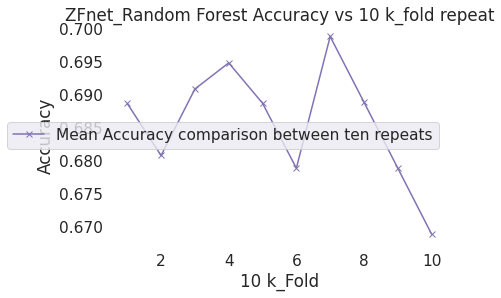

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	rfc_scores = cross_val_score(rforest, validation_featurez, validation_labelz, scoring='accuracy', cv=cv)
	results.append(np.mean(rfc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('ZFnet_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

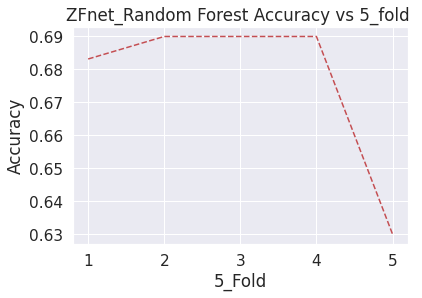

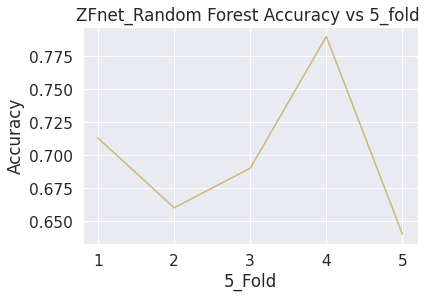

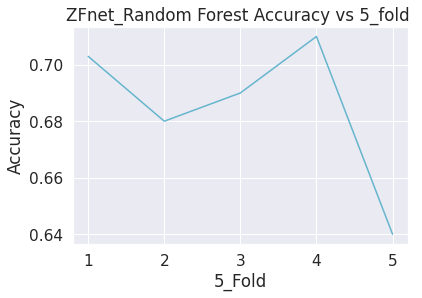

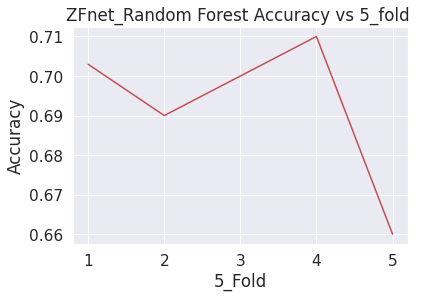

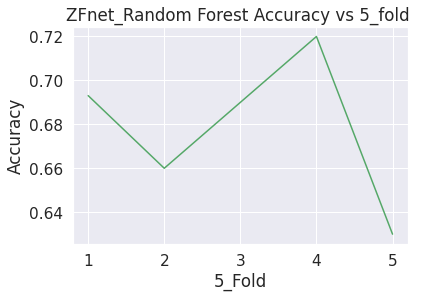

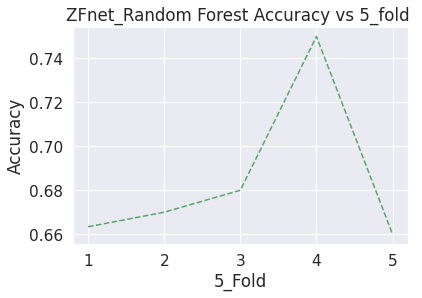

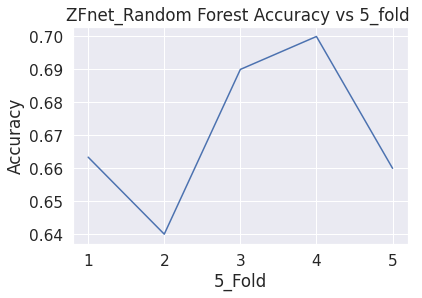

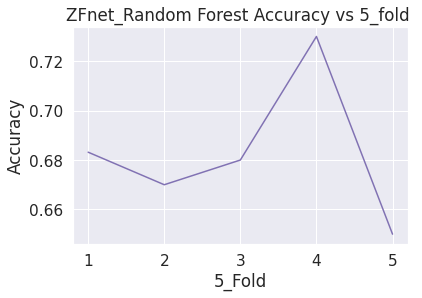

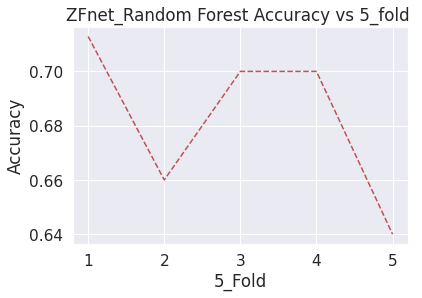

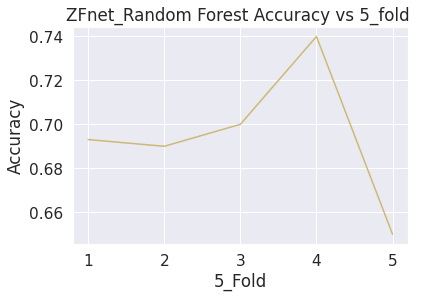

No handles with labels found to put in legend.


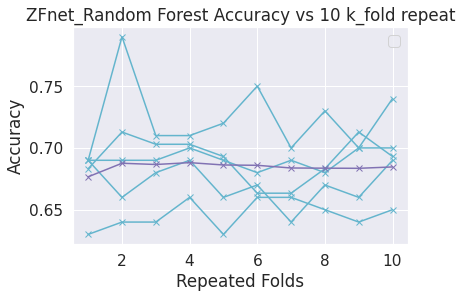

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, validation_featurez, validation_labelz, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('ZFnet_Random Forest Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('ZFnet_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(rforest, validation_featurez, validation_labelz, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())


> folds=1, accuracy=0.697 (0.660,0.730)
> folds=2, accuracy=0.697 (0.650,0.760)
> folds=3, accuracy=0.695 (0.660,0.740)
> folds=4, accuracy=0.685 (0.650,0.750)
> folds=5, accuracy=0.683 (0.650,0.710)
> folds=6, accuracy=0.697 (0.670,0.740)
> folds=7, accuracy=0.719 (0.680,0.750)
> folds=8, accuracy=0.695 (0.660,0.740)
> folds=9, accuracy=0.681 (0.650,0.720)
> folds=10, accuracy=0.693 (0.640,0.750)


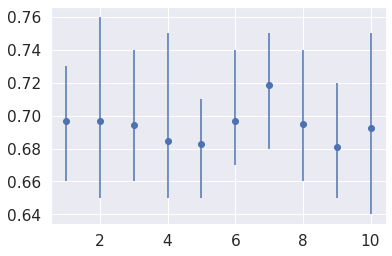

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

# <font color='gold'> Comparing the significance of different feature extraction models </font>

In [19]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

    train_path = data_dir+'/train'
    val_path = data_dir+'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN' ,'NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [20]:
train_batches, val_batches, test_batches = Kermany2018(50, 150, '/content/drive/MyDrive/OCT2017-Data')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [85]:
def model_extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 3, 3, 256))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(150, 150),
      batch_size = batch_size,
      class_mode ='binary')
 

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = zf_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [31]:
batch_size = 50
epoch = 10

In [89]:
train_feature, train_label = model_extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
validation_feature, validation_label = model_extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
test_feature, test_label = model_extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [91]:
train_feature = np.reshape(train_feature, (7752, 3 * 3 * 256))
validation_feature = np.reshape(validation_feature, (501, 3 * 3 * 256))
test_feature = np.reshape(test_feature, (1000, 3 * 3 * 256))

In [21]:

kcnn = Sequential()
kcnn.add(Conv2D(16, (3, 3), activation='relu', input_shape=(150, 150, 3), kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Dropout(0.2))
kcnn.add(Conv2D(4, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Dropout(0.2))



In [22]:
kcnn.add(Flatten())

kcnn.add(Dense(4, activation='softmax'))

In [23]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 50
epoch = 10
val_size = 501

In [24]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [25]:
from tensorflow.keras import optimizers

opt1 = tf.keras.optimizers.SGD(learning_rate=0.01)


In [26]:
kcnn.compile(optimizer=opt1, loss='categorical_crossentropy', metrics=['accuracy'])

In [27]:

history = kcnn.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=epoch, class_weight=class_weight, verbose=1)


Epoch 1/10
155/155 [==============================] - 2384s 15s/step - loss: 1.4262 - accuracy: 0.2546 - val_loss: 1.3859 - val_accuracy: 0.2475
Epoch 2/10
155/155 [==============================] - 69s 444ms/step - loss: 1.3884 - accuracy: 0.2511 - val_loss: 1.3825 - val_accuracy: 0.3094
Epoch 3/10
155/155 [==============================] - 69s 442ms/step - loss: 1.3882 - accuracy: 0.2505 - val_loss: 1.3825 - val_accuracy: 0.3094
Epoch 4/10
155/155 [==============================] - 69s 448ms/step - loss: 1.3863 - accuracy: 0.2640 - val_loss: 1.3837 - val_accuracy: 0.3313
Epoch 5/10
155/155 [==============================] - 69s 444ms/step - loss: 1.3867 - accuracy: 0.2605 - val_loss: 1.3849 - val_accuracy: 0.2515
Epoch 6/10
155/155 [==============================] - 69s 444ms/step - loss: 1.3853 - accuracy: 0.2583 - val_loss: 1.3844 - val_accuracy: 0.2774
Epoch 7/10
155/155 [==============================] - 69s 444ms/step - loss: 1.3840 - accuracy: 0.2743 - val_loss: 1.3848 - val_ac

In [28]:
kcnn.layers[17]._name='conv11'
print(kcnn.layers[17].name)

conv11


In [29]:
from keras.models import Model

#layer_name = 'conv11'
kcnn_base = Model(inputs=kcnn.input, outputs=kcnn.get_layer('conv11').output)
#kcnn_output = kcnn_base.predict(test_batches)

In [41]:

from keras.applications.vgg16 import VGG16
vgg_16 = VGG16()

553476096/553467096 [==============================] - 2s 0us/step


In [44]:
vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

for layer in vgg16_base.layers:
            layer.trainable = False


In [55]:
#from tf.keras.applications.resnet50 import ResNet50

resnet_50 = tf.keras.applications.resnet50.ResNet50()


102981632/102967424 [==============================] - 2s 0us/step


In [56]:
resnet50_base = tf.keras.applications.resnet50.ResNet50(weights='imagenet', include_top=False, input_shape=(150,150, 3))


94781440/94765736 [==============================] - 1s 0us/step


In [79]:
#coding=utf-8  
from keras.models import Sequential  
from keras.layers import Dense,Flatten,Dropout  
from keras.layers.convolutional import Conv2D,MaxPooling2D  
from keras.utils.np_utils import to_categorical  
import numpy as np  
seed = 7  
np.random.seed(seed)  
  
zf = Sequential()  
zf.add(Conv2D(96,(7,7),strides=(2,2),input_shape=(150,150,3),padding='valid',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(256,(5,5),strides=(2,2),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(256,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Flatten())  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4,activation='softmax'))  
 

In [80]:
zf.compile(loss='categorical_crossentropy',optimizer='sgd', metrics='accuracy')  


In [81]:

history_zf = zf.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=10, verbose=1)



Epoch 1/10
155/155 [==============================] - 77s 493ms/step - loss: 1.3395 - accuracy: 0.3912 - val_loss: 1.3094 - val_accuracy: 0.4072
Epoch 2/10
155/155 [==============================] - 69s 447ms/step - loss: 1.3153 - accuracy: 0.3973 - val_loss: 1.2747 - val_accuracy: 0.4072
Epoch 3/10
155/155 [==============================] - 69s 445ms/step - loss: 1.2732 - accuracy: 0.4259 - val_loss: 1.2867 - val_accuracy: 0.4112
Epoch 4/10
155/155 [==============================] - 69s 445ms/step - loss: 1.2362 - accuracy: 0.4520 - val_loss: 1.1644 - val_accuracy: 0.4731
Epoch 5/10
155/155 [==============================] - 70s 449ms/step - loss: 1.2028 - accuracy: 0.4690 - val_loss: 1.2414 - val_accuracy: 0.4271
Epoch 6/10
155/155 [==============================] - 69s 446ms/step - loss: 1.1699 - accuracy: 0.4906 - val_loss: 1.1662 - val_accuracy: 0.4591
Epoch 7/10
155/155 [==============================] - 69s 443ms/step - loss: 1.1383 - accuracy: 0.5035 - val_loss: 1.1662 - val_ac

In [82]:
zf.layers[7]._name='conv4'
print(zf.layers[7].name)

conv4


In [83]:
from keras.models import Model

#layer_name = 'conv4'
zf_base = Model(inputs=zf.input, outputs=zf.get_layer('conv4').output)
#zf_output = zf_base.predict(test_batches)

In [38]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')


In [93]:
rforest.fit(train_feature, train_label)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=10, min_samples_leaf=2)

In [40]:
cnr_pred = rforest.predict(test_feature)

In [54]:
vr_pred = rforest.predict(test_feature)

In [74]:
rrs_pred = rforest.predict(test_feature)

In [94]:
rzf_pred = rforest.predict(test_feature)

In [95]:
from mlxtend.evaluate import ftest
import numpy as np


In [96]:
f, p_value = ftest(cnr_pred, 
                   vr_pred,
                   rrs_pred,
                   rzf_pred)

print('F: %.3f' % f)
print('p-value: %.3f' % p_value)

#prf_pred,

F: 2.349
p-value: 0.096


/usr/local/lib/python3.7/dist-packages/mlxtend/evaluate/f_test.py:80: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  mod in y_model_predictions)).astype(int)


In [101]:
f, p_value = ftest(cnr_pred, vr_pred, rrs_pred)

print('F: %.3f' % f)
print('p-value: %.3f' % p_value)

F: 4.427
p-value: 0.036


/usr/local/lib/python3.7/dist-packages/mlxtend/evaluate/f_test.py:80: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  mod in y_model_predictions)).astype(int)


In [104]:
f, p_value = ftest(cnr_pred, rzf_pred, vr_pred)
print('F: %.3f' % f)
print('p-value: %.3f' % p_value)

F: 2.410
p-value: 0.121


/usr/local/lib/python3.7/dist-packages/mlxtend/evaluate/f_test.py:80: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  mod in y_model_predictions)).astype(int)


In [105]:
f, p_value = ftest(rrs_pred, rzf_pred, vr_pred)
print('F: %.3f' % f)
print('p-value: %.3f' % p_value)

F: 0.870
p-value: 0.351


/usr/local/lib/python3.7/dist-packages/mlxtend/evaluate/f_test.py:80: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  mod in y_model_predictions)).astype(int)


In [106]:
f, p_value = ftest(rrs_pred, rzf_pred, cnr_pred)
print('F: %.3f' % f)
print('p-value: %.3f' % p_value)

F: 0.928
p-value: 0.336


/usr/local/lib/python3.7/dist-packages/mlxtend/evaluate/f_test.py:80: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  mod in y_model_predictions)).astype(int)


In [97]:
from mlxtend.evaluate import combined_ftest_5x2cv

In [ ]:
f, p = combined_ftest_5x2cv(estimator1=cnr_pred,
                            estimator2=prf_pred,
                            X=ptest_data, y=ptest_label,
                            random_seed=1)

print('F statistic: %.3f' % f)
print('p value: %.3f' % p)

In [ ]:
f, p = combined_ftest_5x2cv(estimator1=cnr_pred,
                            estimator2=vr_pred,
                            X=ptest_data, y=ptest_label,
                            random_seed=1)

print('F statistic: %.3f' % f)
print('p value: %.3f' % p)

In [ ]:
f, p = combined_ftest_5x2cv(estimator1=cnr_pred,
                            estimator2=rrs_pred,
                            X=ptest_data, y=ptest_label,
                            random_seed=1)

print('F statistic: %.3f' % f)
print('p value: %.3f' % p)

In [ ]:
f, p = combined_ftest_5x2cv(estimator1=cnr_pred,
                            estimator2=rzf_pred,
                            X=ptest_data, y=ptest_label,
                            random_seed=1)

print('F statistic: %.3f' % f)
print('p value: %.3f' % p)

## <font color='blue'> Q4: How CNNS perform in classification of retina different cases in comparison to Machine learning classifiers using base CNN for feature extraction? </font>
-	Does CNN perform better in the classification of three Retina diseases and normal retina in comparison with Machine Learning Classifiers such as Random Forest and XGBoost?
-	Does CNN have better efficiency (Time, Memory usage, Computation cost) in comparison to Machine Learning techniques such as Random Forest and XGBoost classifier?


# <font color='DeepPink'> Comparing Deep Learning Models for Classification </font>

## <font color='magenta'> Using VGG16 for Classification </font>

In [ ]:

from keras.applications.vgg16 import VGG16
vgg_16 = VGG16()

553476096/553467096 [==============================] - 8s 0us/step


In [ ]:
vgg_16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in vgg16_base.layers[:15]:
            layer.trainable = False



In [ ]:
for layer in vgg16_base.layers[15:]:
    layer.trainable = True

In [ ]:
vgg16_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import numpy as np
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import optimizers
from tensorflow.keras.layers import BatchNormalization


In [ ]:

vgg16c = Sequential()
vgg16c.add(vgg16_base)
#vgg16c.add(Conv2D(256, (4, 4), activation='relu'))
#vgg16c.add(MaxPooling2D(2, 2))
vgg16c.add(Flatten())
vgg16c.add(Dense(256, activation='relu'))
vgg16c.add(Dense(64, activation='relu'))
vgg16c.add(Dense(4,activation='softmax'))


In [ ]:
'''
vgg16c = Sequential()
#vgg16c.add(vgg16_base)
vgg16c.add(Dense(256, activation='relu', input_dim=7 * 7 * 512))
vgg16c.add(Dropout(0.5))
vgg16c.add(Dense(4, activation='softmax'))
'''


In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
'''
def extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 7, 7, 512))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(224, 224),
      batch_size=batch_size,
      class_mode='binary')
 

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = vgg16_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels
  '''

In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 50
epoch = 20
val_size = 501

In [ ]:
% memit train_features, train_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
% memit val_features, val_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
% memit test_features, test_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
peak memory: 6716.23 MiB, increment: 3948.05 MiB
Found 501 images belonging to 4 classes.
peak memory: 6716.05 MiB, increment: 0.07 MiB
Found 1000 images belonging to 4 classes.
peak memory: 6715.87 MiB, increment: 0.01 MiB


In [ ]:
'''
train_features = np.reshape(train_features, (7752, 7 * 7 * 512))
validation_features = np.reshape(val_features, (501, 7 * 7 * 512))
test_features = np.reshape(test_features, (1000, 7* 7 * 512))
'''

In [ ]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

    train_path = data_dir+'/train'
    val_path = data_dir+'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN','NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [ ]:
train_batchez, val_batchez, test_batchez = Kermany2018(50, 224, '/content/drive/MyDrive/OCT2017-Data/')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
from keras import metrics

In [ ]:
sp_sn = tf.keras.metrics.SpecificityAtSensitivity(0.6)
sn_sp = tf.keras.metrics.SensitivityAtSpecificity(0.6)

metrics=['accuracy', 'FalseNegatives', 'Precision', 'Recall', sp_sn, sn_sp, 'AUC']

vgg16c.compile(optimizer=optimizers.RMSprop(lr=2e-5), 
              loss='categorical_crossentropy',
              metrics=metrics)



/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [ ]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017_2/vgg16c-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]


In [ ]:
!pip -q install memory_profiler

In [ ]:
!pip install psutil # optional dependency for memory profiler to execute fast

In [ ]:
%load_ext  memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit vgg = vgg16c.fit(train_batchez, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batchez, epochs=15, class_weight=class_weight,  verbose=1)


#%memit vgg = vgg16c.fit(train_features, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_features, epochs=10, class_weight=class_weight, callbacks=callbacks_list, verbose=1)



# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/15
155/155 [==============================] - 150s 951ms/step - loss: 0.8299 - accuracy: 0.6748 - false_negatives: 3853.0000 - precision: 0.8274 - recall: 0.5028 - specificity_at_sensitivity_23: 0.9348 - sensitivity_at_specificity_23: 0.9201 - auc: 0.8882 - val_loss: 0.5137 - val_accuracy: 0.8283 - val_false_negatives: 99.0000 - val_precision: 0.8720 - val_recall: 0.8024 - val_specificity_at_sensitivity_23: 0.9860 - val_sensitivity_at_specificity_23: 0.9741 - val_auc: 0.9550
Epoch 2/15
155/155 [==============================] - 147s 946ms/step - loss: 0.4264 - accuracy: 0.8465 - false_negatives: 1405.0000 - precision: 0.8746 - recall: 0.8187 - specificity_at_sensitivity_23: 0.9895 - sensitivity_at_specificity_23: 0.9921 - auc: 0.9687 - val_loss: 0.4400 - val_accuracy: 0.8523 - val_false_negatives: 79.0000 - val_precision: 0.8719 - val_recall: 0.8423 - val_specificity_at_sensitivity_23: 0.9953 - val_sensitivity_at_specificity_23: 0.9820 - val_auc: 0.9661
Epoch 3/15
155/155 [====

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 2171.917607999999 duration2= 2757.453390598297


In [ ]:
np.save('/content/drive/MyDrive/OCT2017-Data/history-vggc.npy',vgg.history)

In [ ]:
history-vgg=np.load('/content/drive/MyDrive/OCT2017-Data/history-vggc.npy',allow_pickle='TRUE').item()


In [ ]:
best_epoch_model = np.argmin(vgg.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, vgg.history['val_loss'][best_epoch_model], vgg.history['val_accuracy'][best_epoch_model]))

best epoch:11 validation loss:0.271 validation acc:0.922


In [ ]:
print(vgg.history.keys())

dict_keys(['loss', 'accuracy', 'false_negatives', 'precision', 'recall', 'specificity_at_sensitivity_23', 'sensitivity_at_specificity_23', 'auc', 'val_loss', 'val_accuracy', 'val_false_negatives', 'val_precision', 'val_recall', 'val_specificity_at_sensitivity_23', 'val_sensitivity_at_specificity_23', 'val_auc'])


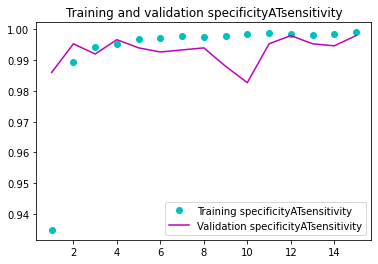

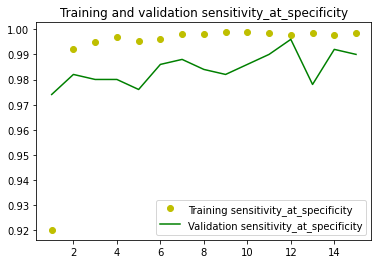

In [ ]:
import matplotlib.pyplot as plt

specificityATsensitivity = vgg.history['specificity_at_sensitivity_23']
sensitivityATspecificity = vgg.history['sensitivity_at_specificity_23']
val_specificityATsensitivity = vgg.history['val_specificity_at_sensitivity_23']
val_sensitivityATspecificity = vgg.history['val_sensitivity_at_specificity_23']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training specificityATsensitivity')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation specificityATsensitivity')
plt.title('Training and validation specificityATsensitivity')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training sensitivity_at_specificity')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation sensitivity_at_specificity')
plt.title('Training and validation sensitivity_at_specificity')
plt.legend()
plt.show()

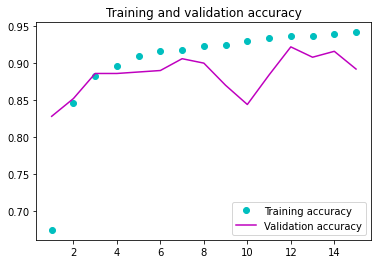

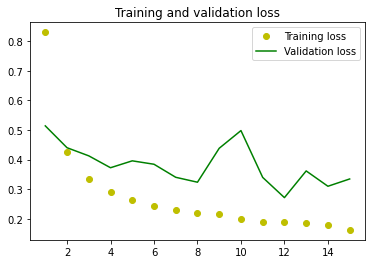

In [ ]:
import matplotlib.pyplot as plt

acc = vgg.history['accuracy']
val_acc = vgg.history['val_accuracy']
loss = vgg.history['loss']
val_loss = vgg.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'co', label='Training accuracy')
plt.plot(epochs, val_acc, 'm', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'yo', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

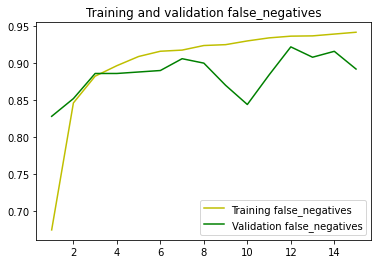

In [ ]:
import matplotlib.pyplot as plt

falseNegatives = vgg.history['false_negatives']
val_falseNegatives = vgg.history['val_false_negatives']


epochs = range(1, len(falseNegatives) + 1)

plt.plot(epochs, acc, 'y-', label='Training false_negatives')
plt.plot(epochs, val_acc, 'g', label='Validation false_negatives')
plt.title('Training and validation false_negatives')
plt.legend()



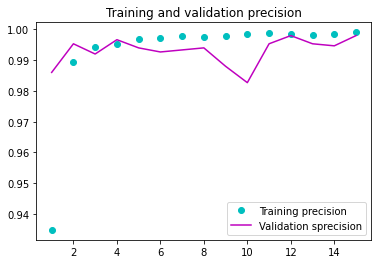

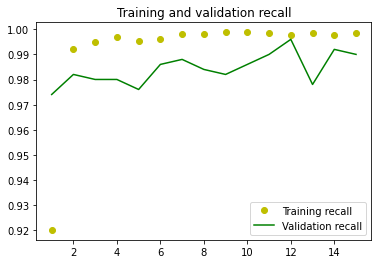

In [ ]:
import matplotlib.pyplot as plt

Precision = vgg.history['precision']
Recall = vgg.history['recall']
val_Precision = vgg.history['val_precision']
val_Recall = vgg.history['val_recall']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training precision')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation sprecision')
plt.title('Training and validation precision')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training recall')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation recall')
plt.title('Training and validation recall')
plt.legend()
plt.show()

In [ ]:
vg_pred =vgg16c.predict(test_batchez)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


#Confution Matrix and Classification Report
vg_pred = np.argmax(vg_pred, axis=1)

cm_vg = confusion_matrix(test_batchez.classes, vg_pred)

print('Confusion Matrix')
print(cm_vg)


Confusion Matrix
[[82 62 41 65]
 [70 62 44 74]
 [83 68 40 59]
 [94 53 45 58]]


In [ ]:
from sklearn.metrics import confusion_matrix


FP = cm_vg.sum(axis=0) - np.diag(cm_vg)  
FN = cm_vg.sum(axis=1) - np.diag(cm_vg)
TP = np.diag(cm_vg)
TN = cm_vg.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.328 0.248 0.16  0.232]
Specificity :  [0.67066667 0.756      0.82666667 0.736     ]
Precision :  [0.24924012 0.25306122 0.23529412 0.2265625 ]
FPR :  [0.32933333 0.244      0.17333333 0.264     ]
FNR :  [0.672 0.752 0.84  0.768]
Accuracy :  [0.585 0.629 0.66  0.61 ]


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_batchez.classes, vg_pred)


0.242

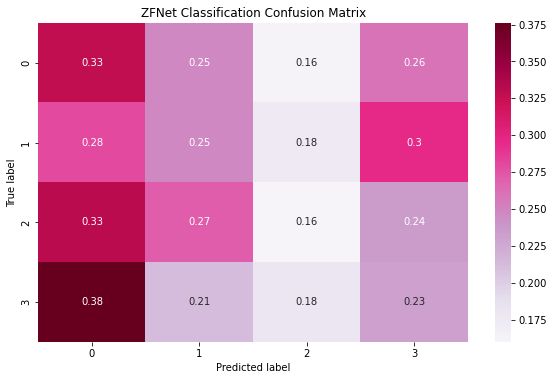

In [ ]:
import seaborn as sns


cm_vg = cm_vg.astype('float') / cm_vg.sum(axis=1)[:, np.newaxis]
figure = plt.figure(figsize=(8, 5))
sns.heatmap(cm_vg, annot=True,cmap=plt.cm.PuRd)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('ZFNet Classification Confusion Matrix')
plt.show()

In [ ]:
import math

n = 150
#number_of_examples = len(train_batches.filenames)
number_generator = math.ceil(2250 / (1.0 * n)) 
#number_generator = round((2250 / (1.0 * n)), 2)

# 1.0 above is to skip integer division

ztrain_label = []
ztrain_data = []

for i in range(0,int(number_generator)):
    ztrain_label.extend(np.array(train_generator1[i][1]))
    ztrain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
ztrain_label = np.array(ztrain_label)
ztrain_data = np.array(ztrain_data)

In [ ]:
np.array(ztrain_data).shape

(2250, 224, 224, 3)

In [ ]:
ztrain_data = ztrain_data.reshape([2250, 224*224*3])

In [ ]:

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(750 / (1.0 * n)) 
#number_generator = round((750 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

ztest_label = []
ztest_data = []

for i in range(0,int(number_generator)):
    ztest_label.extend(np.array(test_generator1[i][1]))
    ztest_data.extend(np.array(test_generator1[i][0]))


In [ ]:
ztest_label = np.array(ztest_label)
ztest_data = np.array(ztest_data)

In [ ]:
ztest_label.shape

(750,)

In [ ]:
ztest_data = ztest_data.reshape([750, 224*224*3])

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(300 / (1.0 * n)) 
#number_generator = round((300 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

zval_label1 = []
zval_data1 = []

for i in range(0,int(number_generator)):
    zval_label1.extend(np.array(val_generator1[i][1]))
    zval_data1.extend(np.array(val_generator1[i][0]))


In [ ]:
zval_label = np.array(zval_label1)
zval_data = np.array(zval_data1)

In [ ]:
zval_data.shape

(300, 224, 224, 3)

In [ ]:
zval_data = zval_data.reshape (300, 224*224*3)

In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
vg_scores = vgg16c.evaluate_generator(val_batchez)
print("%s: %.2f%%" % (vgg16c.metrics_names[1], vg_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 89.02%


In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.model_selection import KFold, StratifiedKFold
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint



#set early stopping criteria
pat = 3 #this is the number of epochs with no improvment after which the training will stop
early_stopping = EarlyStopping(monitor='accuracy', patience=pat, verbose=1)

#define the model checkpoint callback -> this will keep on saving the model as a physical file
model_checkpoint = ModelCheckpoint('vg_oct_1.h5', verbose=1, save_best_only=True)

#define a function to fit the model
def fit_and_evaluate(train, val, EPOCHS=8, BATCH_SIZE=50):
    model = None
    model = vgg16c
    results = model.fit(train, epochs=EPOCHS, batch_size=BATCH_SIZE, callbacks=[early_stopping, model_checkpoint], 
              validation_data=val,  shuffle=True, verbose=1, class_weight=class_weight)  
    print("Val Score: ", model.evaluate(val))
    return results

In [ ]:
n_folds=5
epochs=8
batch_size=150

#save the model history in a list after fitting so that we can plot later
model_history = [] 
s1 = 0
s2 = 0

for i in range(n_folds):
    '''print("Training on Fold: ",i+1)
    td = ztrain_data[s1:600*i]
    tl = ztrain_label[s1:600*i]
    vd = zval_data[s2:60*i]
    vl = zval_label[s2:60*i]
    s1 = 600*i
    s2 = 60*i'''
    h = fit_and_evaluate(test_batchez, val_batchez, epochs, batch_size)
    model_history.append(h)
    print("======="*12, model_history, end="\n\n\n")

Epoch 1/8
20/20 [==============================] - ETA: 0s - loss: 0.1201 - accuracy: 0.9690 - false_negatives: 32.0000 - precision: 0.9690 - recall: 0.9680 - specificity_at_sensitivity_23: 0.9997 - sensitivity_at_specificity_23: 0.9970 - auc: 0.9965
Epoch 1: val_loss improved from inf to 0.33377, saving model to vg_oct_1.h5
20/20 [==============================] - 17s 848ms/step - loss: 0.1201 - accuracy: 0.9690 - false_negatives: 32.0000 - precision: 0.9690 - recall: 0.9680 - specificity_at_sensitivity_23: 0.9997 - sensitivity_at_specificity_23: 0.9970 - auc: 0.9965 - val_loss: 0.3338 - val_accuracy: 0.8982 - val_false_negatives: 62.0000 - val_precision: 0.9052 - val_recall: 0.8762 - val_specificity_at_sensitivity_23: 0.9953 - val_sensitivity_at_specificity_23: 0.9840 - val_auc: 0.9783
Epoch 2/8
20/20 [==============================] - ETA: 0s - loss: 0.0509 - accuracy: 0.9870 - false_negatives: 13.0000 - precision: 0.9890 - recall: 0.9870 - specificity_at_sensitivity_23: 0.9993 - se

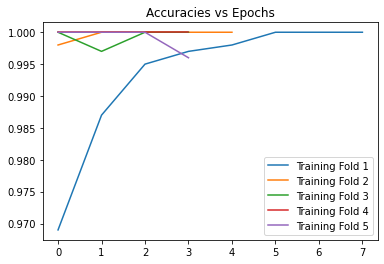

In [ ]:
plt.title('Accuracies vs Epochs')
plt.plot(model_history[0].history['accuracy'], label='Training Fold 1')
plt.plot(model_history[1].history['accuracy'], label='Training Fold 2')
plt.plot(model_history[2].history['accuracy'], label='Training Fold 3')
plt.plot(model_history[3].history['accuracy'], label='Training Fold 4')
plt.plot(model_history[4].history['accuracy'], label='Training Fold 5')
plt.legend()
plt.show()

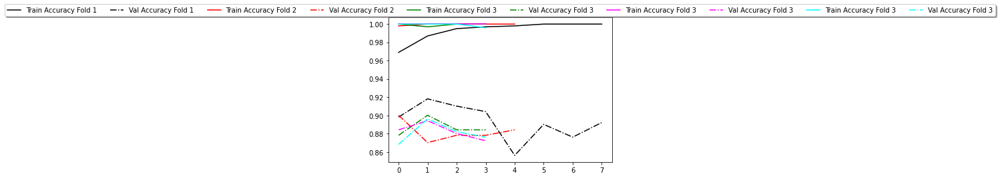

In [ ]:
plt.title('Train Accuracy vs Val Accuracy')
plt.plot(model_history[0].history['accuracy'], label='Train Accuracy Fold 1', color='black')
plt.plot(model_history[0].history['val_accuracy'], label='Val Accuracy Fold 1', color='black', linestyle = "dashdot")
plt.plot(model_history[1].history['accuracy'], label='Train Accuracy Fold 2', color='red', )
plt.plot(model_history[1].history['val_accuracy'], label='Val Accuracy Fold 2', color='red', linestyle = "dashdot")
plt.plot(model_history[2].history['accuracy'], label='Train Accuracy Fold 3', color='green', )
plt.plot(model_history[2].history['val_accuracy'], label='Val Accuracy Fold 3', color='green', linestyle = "dashdot")
plt.plot(model_history[3].history['accuracy'], label='Train Accuracy Fold 3', color='magenta', )
plt.plot(model_history[3].history['val_accuracy'], label='Val Accuracy Fold 3', color='magenta', linestyle = "dashdot")
plt.plot(model_history[4].history['accuracy'], label='Train Accuracy Fold 3', color='cyan', )
plt.plot(model_history[4].history['val_accuracy'], label='Val Accuracy Fold 3', color='cyan', linestyle = "dashdot")
plt.legend(loc='center', bbox_to_anchor=(0.5, 1.05), ncol=10, fancybox=True, shadow=True)
#plt.legend()
plt.show()

## <font color='magenta'> Using ZFnet for classification </font>

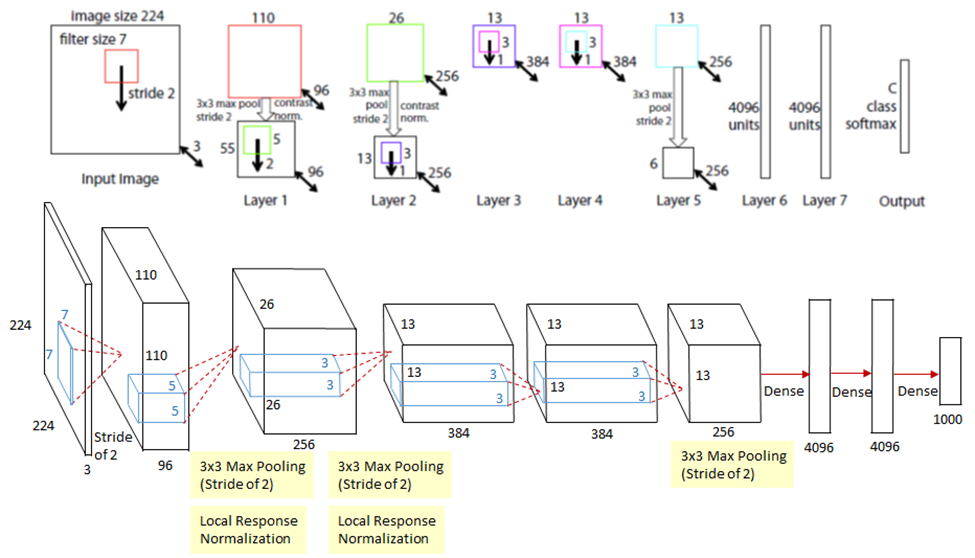

In [ ]:
#coding=utf-8  
from keras.models import Sequential  
from keras.layers import Dense,Flatten,Dropout  
from keras.layers.convolutional import Conv2D,MaxPooling2D  
from keras.utils.np_utils import to_categorical  
import numpy as np  
seed = 7  
np.random.seed(seed)  
  
zf = Sequential()  
zf.add(Conv2D(96,(7,7),strides=(2,2),input_shape=(224,224,3),padding='valid',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(256,(5,5),strides=(2,2),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(256,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Flatten())  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4,activation='softmax'))  
zf.summary()  

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 109, 109, 96)      14208     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 54, 54, 96)       0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 27, 27, 256)       614656    
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 13, 13, 256)      0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 13, 13, 384)       885120    
                                                                 
 conv2d_13 (Conv2D)          (None, 13, 13, 384)      

In [ ]:
from keras import metrics

In [ ]:
sp_sn = tf.keras.metrics.SpecificityAtSensitivity(0.6)
sn_sp = tf.keras.metrics.SensitivityAtSpecificity(0.6)

metrics=['accuracy', 'FalseNegatives', 'Precision', 'Recall', sp_sn, sn_sp, 'AUC']

zf.compile(loss='categorical_crossentropy',optimizer='sgd', metrics=metrics)  

In [ ]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

    train_path = data_dir+'/train'
    val_path = data_dir+'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN','NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [ ]:
train_batchez, val_batchez, test_batchez = Kermany2018(50, 224, '/content/drive/MyDrive/OCT2017-Data/')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 50
epoch = 20
val_size = 501

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [ ]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017_2/zfnet4-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [ ]:
!pip -q install memory_profiler

In [ ]:
!pip install psutil # optional dependency for memory profiler to execute fast

In [ ]:
%load_ext  memory_profiler

In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit zf_c = zf.fit(train_batchez, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batchez, epochs=10, class_weight=class_weight, callbacks=callbacks_list, verbose=1)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/10
155/155 [==============================] - 129s 827ms/step - loss: 1.0318 - accuracy: 0.5538 - false_negatives: 5343.0000 - precision: 0.7607 - recall: 0.3106 - specificity_at_sensitivity_2: 0.8154 - sensitivity_at_specificity_2: 0.8245 - auc: 0.8088 - val_loss: 0.9348 - val_accuracy: 0.5649 - val_false_negatives: 308.0000 - val_precision: 0.8283 - val_recall: 0.3852 - val_specificity_at_sensitivity_2: 0.8277 - val_sensitivity_at_specificity_2: 0.8503 - val_auc: 0.8378
Epoch 2/10
155/155 [==============================] - 122s 784ms/step - loss: 0.9808 - accuracy: 0.5766 - false_negatives: 4961.0000 - precision: 0.7652 - recall: 0.3599 - specificity_at_sensitivity_2: 0.8436 - sensitivity_at_specificity_2: 0.8480 - auc: 0.8265 - val_loss: 0.9467 - val_accuracy: 0.6128 - val_false_negatives: 329.0000 - val_precision: 0.8821 - val_recall: 0.3433 - val_specificity_at_sensitivity_2: 0.8836 - val_sensitivity_at_specificity_2: 0.8802 - val_auc: 0.8545
Epoch 3/10
155/155 [==========

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 1208.0921710000002 duration2= 1347.368259191513


In [ ]:
best_epoch_model = np.argmin(zf_c.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, zf_c.history['val_loss'][best_epoch_model], zf_c.history['val_accuracy'][best_epoch_model]))

best epoch:9 validation loss:0.750 validation acc:0.685


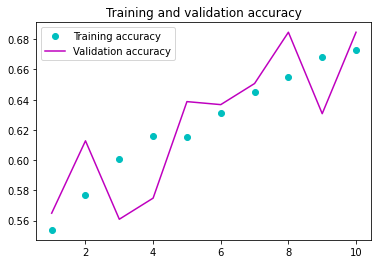

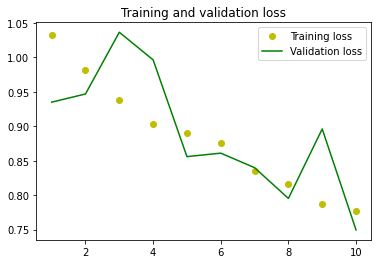

In [ ]:
import matplotlib.pyplot as plt

acc = zf_c.history['accuracy']
val_acc = zf_c.history['val_accuracy']
loss = zf_c.history['loss']
val_loss = zf_c.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'co', label='Training accuracy')
plt.plot(epochs, val_acc, 'm', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'yo', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [ ]:
np.save('/content/drive/MyDrive/OCT2017-Data/history-zfc.npy',zf_c.history)

In [ ]:
history-zfc=np.load('/content/drive/MyDrive/OCT2017-Data/history-zfc.npy',allow_pickle='TRUE').item()


In [ ]:
best_epoch_model = np.argmin(zf_c.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, zf_c.history['val_loss'][best_epoch_model], zf_c.history['val_accuracy'][best_epoch_model]))

best epoch:9 validation loss:0.750 validation acc:0.685


In [ ]:
print(zf_c.history.keys())

dict_keys(['loss', 'accuracy', 'false_negatives', 'precision', 'recall', 'specificity_at_sensitivity_2', 'sensitivity_at_specificity_2', 'auc', 'val_loss', 'val_accuracy', 'val_false_negatives', 'val_precision', 'val_recall', 'val_specificity_at_sensitivity_2', 'val_sensitivity_at_specificity_2', 'val_auc'])


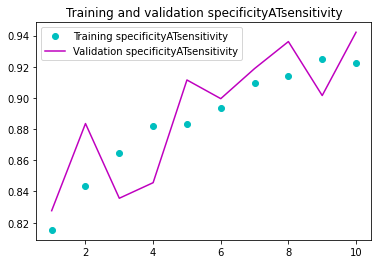

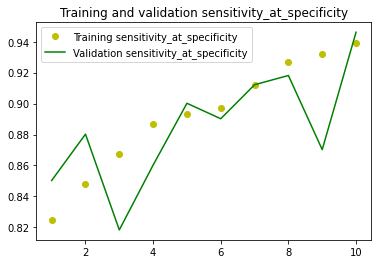

In [ ]:
import matplotlib.pyplot as plt

specificityATsensitivity = zf_c.history['specificity_at_sensitivity_2']
sensitivityATspecificity = zf_c.history['sensitivity_at_specificity_2']
val_specificityATsensitivity = zf_c.history['val_specificity_at_sensitivity_2']
val_sensitivityATspecificity = zf_c.history['val_sensitivity_at_specificity_2']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training specificityATsensitivity')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation specificityATsensitivity')
plt.title('Training and validation specificityATsensitivity')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training sensitivity_at_specificity')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation sensitivity_at_specificity')
plt.title('Training and validation sensitivity_at_specificity')
plt.legend()
plt.show()

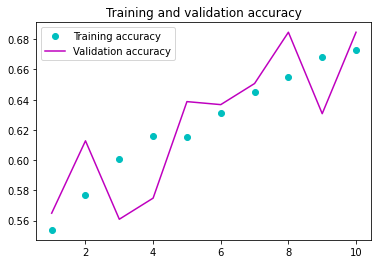

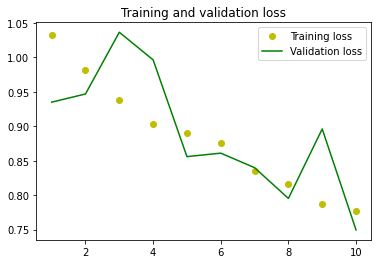

In [ ]:
import matplotlib.pyplot as plt

acc = zf_c.history['accuracy']
val_acc = zf_c.history['val_accuracy']
loss = zf_c.history['loss']
val_loss = zf_c.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'co', label='Training accuracy')
plt.plot(epochs, val_acc, 'm', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'yo', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

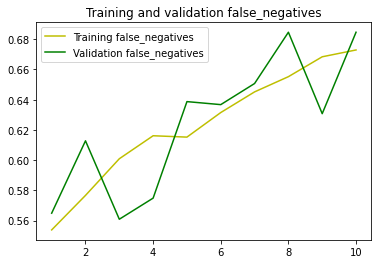

In [ ]:
import matplotlib.pyplot as plt

falseNegatives = zf_c.history['false_negatives']
val_falseNegatives = zf_c.history['val_false_negatives']


epochs = range(1, len(falseNegatives) + 1)

plt.plot(epochs, acc, 'y-', label='Training false_negatives')
plt.plot(epochs, val_acc, 'g', label='Validation false_negatives')
plt.title('Training and validation false_negatives')
plt.legend()



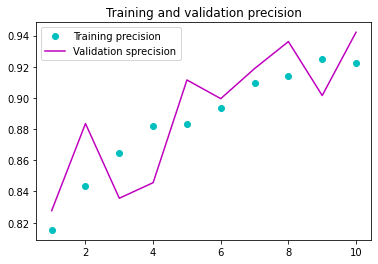

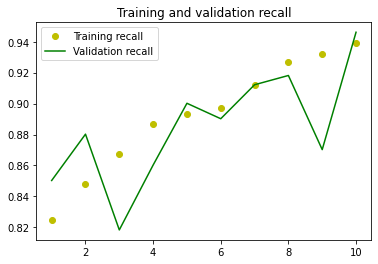

In [ ]:
import matplotlib.pyplot as plt

Precision = zf_c.history['precision']
Recall = zf_c.history['recall']
val_Precision = zf_c.history['val_precision']
val_Recall = zf_c.history['val_recall']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training precision')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation sprecision')
plt.title('Training and validation precision')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training recall')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation recall')
plt.title('Training and validation recall')
plt.legend()
plt.show()

In [ ]:
zf_pred =zf.predict(test_batchez)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


#Confution Matrix and Classification Report
zf_pred = np.argmax(zf_pred, axis=1)

cm_zf = confusion_matrix(test_batchez.classes, zf_pred)

print('Confusion Matrix')
print(cm_zf)


Confusion Matrix
[[69 39 74 68]
 [74 43 63 70]
 [60 42 63 85]
 [69 47 58 76]]


In [ ]:
from sklearn.metrics import confusion_matrix


FP = cm_zf.sum(axis=0) - np.diag(cm_zf)  
FN = cm_zf.sum(axis=1) - np.diag(cm_zf)
TP = np.diag(cm_zf)
TN = cm_zf.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.276 0.172 0.252 0.304]
Specificity :  [0.72933333 0.82933333 0.74       0.70266667]
Precision :  [0.25367647 0.25146199 0.24418605 0.2541806 ]
FPR :  [0.27066667 0.17066667 0.26       0.29733333]
FNR :  [0.724 0.828 0.748 0.696]
Accuracy :  [0.616 0.665 0.618 0.603]


In [ ]:
print(classification_report(test_batchez.classes, zf_pred))


              precision    recall  f1-score   support

           0       0.25      0.28      0.26       250
           1       0.25      0.17      0.20       250
           2       0.24      0.25      0.25       250
           3       0.25      0.30      0.28       250

    accuracy                           0.25      1000
   macro avg       0.25      0.25      0.25      1000
weighted avg       0.25      0.25      0.25      1000



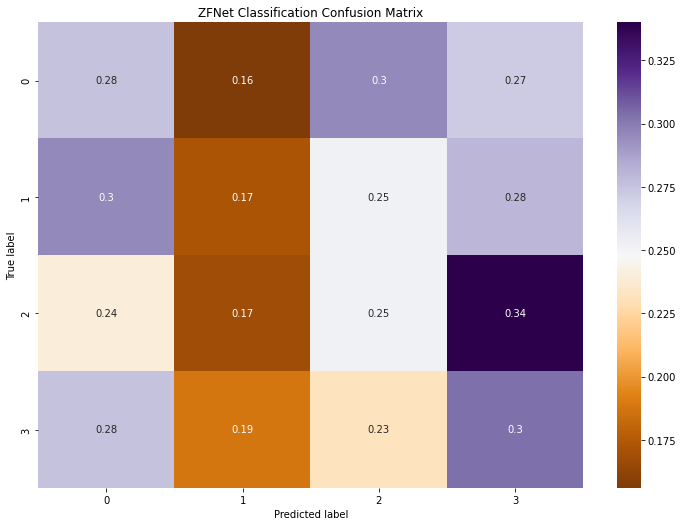

In [ ]:
import seaborn as sns


cm_zf = cm_zf.astype('float') / cm_zf.sum(axis=1)[:, np.newaxis]
figure = plt.figure(figsize=(10, 7))
sns.heatmap(cm_zf, annot=True,cmap=plt.cm.PuOr)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('ZFNet Classification Confusion Matrix')
plt.show()

In [ ]:
import math

n = 150
#number_of_examples = len(train_batches.filenames)
number_generator = math.ceil(2250 / (1.0 * n)) 
#number_generator = round((2250 / (1.0 * n)), 2)

# 1.0 above is to skip integer division

ztrain_label = []
ztrain_data = []

for i in range(0,int(number_generator)):
    ztrain_label.extend(np.array(train_generator1[i][1]))
    ztrain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
ztrain_label = np.array(ztrain_label)
ztrain_data = np.array(ztrain_data)

In [ ]:
np.array(ztrain_data).shape

(2250, 224, 224, 3)

In [ ]:
ztrain_data = ztrain_data.reshape([2250, 224*224*3])

In [ ]:

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(750 / (1.0 * n)) 
#number_generator = round((750 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

ztest_label = []
ztest_data = []

for i in range(0,int(number_generator)):
    ztest_label.extend(np.array(test_generator1[i][1]))
    ztest_data.extend(np.array(test_generator1[i][0]))


In [ ]:
ztest_label = np.array(ztest_label)
ztest_data = np.array(ztest_data)

In [ ]:
ztest_label.shape

In [ ]:
ztest_data = ztest_data.reshape([750, 224*224*3])

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(300 / (1.0 * n)) 
#number_generator = round((300 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

zval_label1 = []
zval_data1 = []

for i in range(0,int(number_generator)):
    zval_label1.extend(np.array(val_generator1[i][1]))
    zval_data1.extend(np.array(val_generator1[i][0]))


In [ ]:
zval_label = np.array(zval_label1)
zval_data = np.array(zval_data1)

In [ ]:
zval_data.shape

In [ ]:
zval_data = zval_data.reshape (300, 224*224*3)

In [ ]:
zf_scores = zf.evaluate_generator(val_batchez)
print("%s: %.2f%%" % (zf.metrics_names[1], zf_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 48.10%


In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.model_selection import KFold, StratifiedKFold
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint



#set early stopping criteria
pat = 3 #this is the number of epochs with no improvment after which the training will stop
early_stopping = EarlyStopping(monitor='accuracy', patience=pat, verbose=1)

#define the model checkpoint callback -> this will keep on saving the model as a physical file
model_checkpoint = ModelCheckpoint('zf_oct_1.h5', verbose=1, save_best_only=True)

#define a function to fit the model
def fit_and_evaluate(train, val, EPOCHS=8, BATCH_SIZE=50):
    model = None
    model = zf
    results = model.fit(train, epochs=EPOCHS, batch_size=BATCH_SIZE, callbacks=[early_stopping, model_checkpoint], 
              validation_data=val,  shuffle=True, verbose=1, weights=)  
    print("Val Score: ", model.evaluate(val))
    return results

In [ ]:
n_folds=5
epochs=8
batch_size=150

#save the model history in a list after fitting so that we can plot later
model_history = [] 
s1 = 0
s2 = 0

for i in range(n_folds):
    '''print("Training on Fold: ",i+1)
    td = ztrain_data[s1:600*i]
    tl = ztrain_label[s1:600*i]
    vd = zval_data[s2:60*i]
    vl = zval_label[s2:60*i]
    s1 = 600*i
    s2 = 60*i'''
    h = fit_and_evaluate(test_batchez, val_batchez, epochs, batch_size)
    model_history.append(h)
    print("======="*12, model_history, end="\n\n\n")

Epoch 1/8
7/7 [==============================] - ETA: 0s - loss: 1.2682 - accuracy: 0.4020
Epoch 1: val_loss improved from inf to 1.59671, saving model to zf_oct_1.h5
7/7 [==============================] - 19s 3s/step - loss: 1.2682 - accuracy: 0.4020 - val_loss: 1.5967 - val_accuracy: 0.2655
Epoch 2/8
7/7 [==============================] - ETA: 0s - loss: 1.1956 - accuracy: 0.4650
Epoch 2: val_loss did not improve from 1.59671
7/7 [==============================] - 14s 2s/step - loss: 1.1956 - accuracy: 0.4650 - val_loss: 1.6823 - val_accuracy: 0.2435
Epoch 3/8
7/7 [==============================] - ETA: 0s - loss: 1.2207 - accuracy: 0.4420
Epoch 3: val_loss improved from 1.59671 to 1.49112, saving model to zf_oct_1.h5
7/7 [==============================] - 12s 2s/step - loss: 1.2207 - accuracy: 0.4420 - val_loss: 1.4911 - val_accuracy: 0.2635
Epoch 4/8
7/7 [==============================] - ETA: 0s - loss: 1.1688 - accuracy: 0.4870
Epoch 4: val_loss did not improve from 1.49112
7/7 [

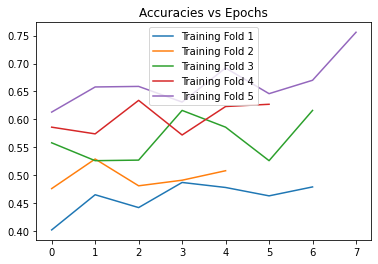

In [ ]:
plt.title('Accuracies vs Epochs')
plt.plot(model_history[0].history['accuracy'], label='Training Fold 1')
plt.plot(model_history[1].history['accuracy'], label='Training Fold 2')
plt.plot(model_history[2].history['accuracy'], label='Training Fold 3')
plt.plot(model_history[3].history['accuracy'], label='Training Fold 4')
plt.plot(model_history[4].history['accuracy'], label='Training Fold 5')
plt.legend()
plt.show()

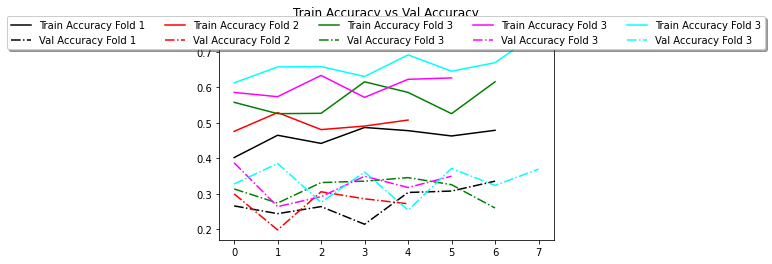

In [ ]:
plt.title('Train Accuracy vs Val Accuracy')
plt.plot(model_history[0].history['accuracy'], label='Train Accuracy Fold 1', color='black')
plt.plot(model_history[0].history['val_accuracy'], label='Val Accuracy Fold 1', color='black', linestyle = "dashdot")
plt.plot(model_history[1].history['accuracy'], label='Train Accuracy Fold 2', color='red', )
plt.plot(model_history[1].history['val_accuracy'], label='Val Accuracy Fold 2', color='red', linestyle = "dashdot")
plt.plot(model_history[2].history['accuracy'], label='Train Accuracy Fold 3', color='green', )
plt.plot(model_history[2].history['val_accuracy'], label='Val Accuracy Fold 3', color='green', linestyle = "dashdot")
plt.plot(model_history[3].history['accuracy'], label='Train Accuracy Fold 3', color='magenta', )
plt.plot(model_history[3].history['val_accuracy'], label='Val Accuracy Fold 3', color='magenta', linestyle = "dashdot")
plt.plot(model_history[4].history['accuracy'], label='Train Accuracy Fold 3', color='cyan', )
plt.plot(model_history[4].history['val_accuracy'], label='Val Accuracy Fold 3', color='cyan', linestyle = "dashdot")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=5, fancybox=True, shadow=True)
#plt.legend()
plt.show()

In [ ]:
def plot_roc(Pred, Pred_Label):
  fp, tp, _ = sklearn.metrics.roc_curve(labels, predictions).

### <font color='DeepPink'> Using CNN as Classifier on the CNN base feature extraction




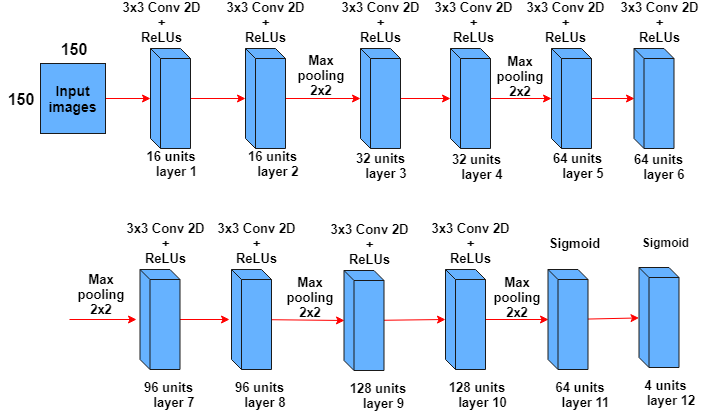

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import numpy as np
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import optimizers
from tensorflow.keras.layers import BatchNormalization


In [ ]:
kcnn = Sequential()
kcnn.add(Conv2D(16, (3, 3), activation='relu',kernel_initializer='he_uniform', input_shape=(224, 224, 3)))

kcnn.add(Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))


kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))


kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())

kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='sigmoid',  padding='same'))
kcnn.add(Dropout(0.2))

kcnn.add(Conv2D(4, (3, 3), activation='sigmoid',  padding='same'))

kcnn.add(Dropout(0.2))


In [ ]:
kcnn.add(Flatten())
#kcnn.add(Dense(4, activation='relu'))
kcnn.add(Dense(4, activation='softmax'))

In [ ]:
kcnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 222, 222, 16)      448       
                                                                 
 conv2d_13 (Conv2D)          (None, 222, 222, 16)      2320      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 111, 111, 16)     0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 111, 111, 32)      4640      
                                                                 
 conv2d_15 (Conv2D)          (None, 111, 111, 32)      9248      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 55, 55, 32)       0         
 2D)                                                  

In [ ]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

 
    train_path = data_dir +'/train'
    val_path = data_dir +'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN','NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [ ]:
train_batches, val_batches, test_batches = Kermany2018(150, 224, '/content/drive/MyDrive/OCT2017-Data/')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 150
epoch = 10
val_size = 501

In [ ]:
from keras import metrics


sp_sn = tf.keras.metrics.SpecificityAtSensitivity(0.6)
sn_sp = tf.keras.metrics.SensitivityAtSpecificity(0.6)

metrics=['accuracy', 'FalseNegatives', 'Precision', 'Recall', sp_sn, sn_sp, 'AUC']

kcnn.compile(loss='categorical_crossentropy',optimizer='sgd', metrics=metrics)  

wj=n_samples / (n_classes * n_samplesj)

wj is the weight for each class(j signifies the class)/
n_samplesis the total number of samples or rows in the dataset/
n_classesis the total number of unique classes in the target/
n_samplesjis the total number of rows of the respective class/

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [ ]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017-Data/CNN_C-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
#import memory_profiler

In [ ]:
#from memory_profiler import profile


In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit kcnn_c = kcnn.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=15, class_weight=class_weight, callbacks=callbacks_list, verbose=1)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/15
51/51 [==============================] - 158s 3s/step - loss: 1.4674 - accuracy: 0.2403 - false_negatives: 7521.0000 - precision: 0.2243 - recall: 0.0169 - specificity_at_sensitivity_27: 0.3564 - sensitivity_at_specificity_27: 0.3750 - auc: 0.4820 - val_loss: 1.3871 - val_accuracy: 0.2395 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_27: 0.3699 - val_sensitivity_at_specificity_27: 0.2834 - val_auc: 0.4983
Epoch 2/15
51/51 [==============================] - 143s 3s/step - loss: 1.4111 - accuracy: 0.2627 - false_negatives: 7647.0000 - precision: 0.2727 - recall: 3.9216e-04 - specificity_at_sensitivity_27: 0.4036 - sensitivity_at_specificity_27: 0.4061 - auc: 0.5086 - val_loss: 1.3867 - val_accuracy: 0.2375 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_27: 0.3872 - val_sensitivity_at_specificity_27: 0.2874 - val_auc: 0.5003
Epoch 3/15
5

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 2156.717249000001 duration2= 2556.920436143875


In [ ]:
np.save('/content/drive/MyDrive/OCT2017-Data/history-kcnnc.npy',kcnn_c.history)

In [ ]:
history-zfc=np.load('/content/drive/MyDrive/OCT2017-Data/history-kcnnc.npy',allow_pickle='TRUE').item()


In [ ]:
best_epoch_model = np.argmin(kcnn_c.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, kcnn_c.history['val_loss'][best_epoch_model], kcnn_c.history['val_accuracy'][best_epoch_model]))

best epoch:14 validation loss:1.360 validation acc:0.417


In [ ]:
knn_scores = kcnn.evaluate_generator(val_batches, verbose=0)
print("%s: %.2f%%" % (kcnn.metrics_names[1], knn_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 42.12%


In [ ]:
print(kcnn_c.history.keys())

dict_keys(['loss', 'accuracy', 'false_negatives', 'precision', 'recall', 'specificity_at_sensitivity_27', 'sensitivity_at_specificity_27', 'auc', 'val_loss', 'val_accuracy', 'val_false_negatives', 'val_precision', 'val_recall', 'val_specificity_at_sensitivity_27', 'val_sensitivity_at_specificity_27', 'val_auc'])


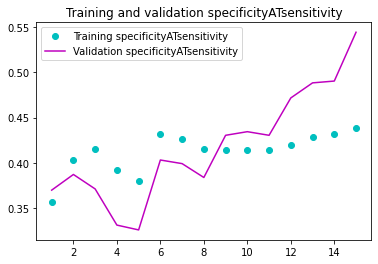

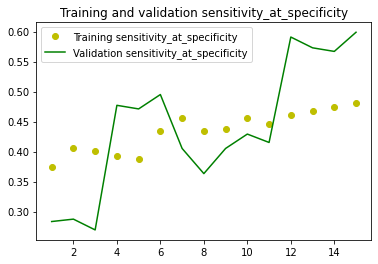

In [ ]:
import matplotlib.pyplot as plt

specificityATsensitivity = kcnn_c.history['specificity_at_sensitivity_27']
sensitivityATspecificity = kcnn_c.history['sensitivity_at_specificity_27']
val_specificityATsensitivity = kcnn_c.history['val_specificity_at_sensitivity_27']
val_sensitivityATspecificity = kcnn_c.history['val_sensitivity_at_specificity_27']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training specificityATsensitivity')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation specificityATsensitivity')
plt.title('Training and validation specificityATsensitivity')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training sensitivity_at_specificity')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation sensitivity_at_specificity')
plt.title('Training and validation sensitivity_at_specificity')
plt.legend()
plt.show()

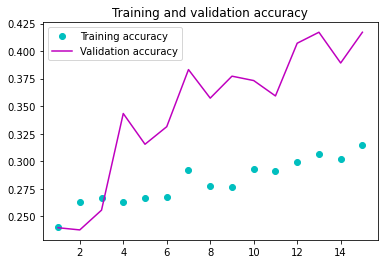

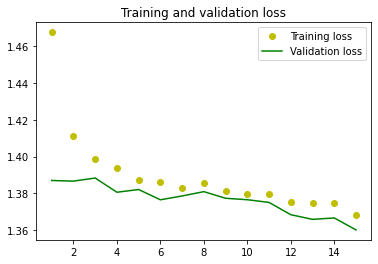

In [ ]:
import matplotlib.pyplot as plt

acc = kcnn_c.history['accuracy']
val_acc = kcnn_c.history['val_accuracy']
loss = kcnn_c.history['loss']
val_loss = kcnn_c.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'co', label='Training accuracy')
plt.plot(epochs, val_acc, 'm', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'yo', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

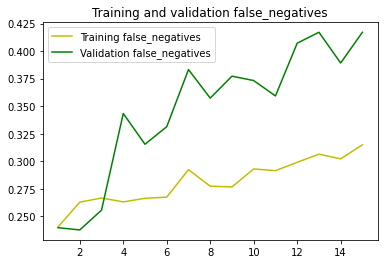

In [ ]:
import matplotlib.pyplot as plt

falseNegatives = kcnn_c.history['false_negatives']
val_falseNegatives = kcnn_c.history['val_false_negatives']


epochs = range(1, len(falseNegatives) + 1)

plt.plot(epochs, acc, 'y-', label='Training false_negatives')
plt.plot(epochs, val_acc, 'g', label='Validation false_negatives')
plt.title('Training and validation false_negatives')
plt.legend()



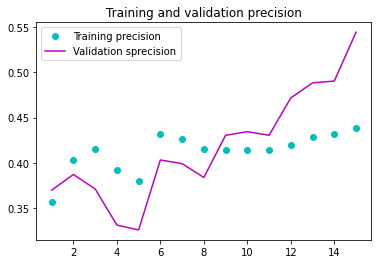

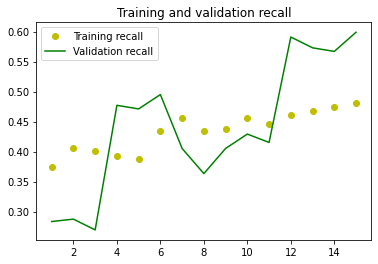

In [ ]:
import matplotlib.pyplot as plt

Precision = kcnn_c.history['precision']
Recall = kcnn_c.history['recall']
val_Precision = kcnn_c.history['val_precision']
val_Recall = kcnn_c.history['val_recall']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training precision')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation sprecision')
plt.title('Training and validation precision')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training recall')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation recall')
plt.title('Training and validation recall')
plt.legend()
plt.show()

In [ ]:
kcnn_pred =kcnn.predict(test_batches)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


#Confution Matrix and Classification Report
kcnn_pred = np.argmax(kcnn_pred, axis=1)

cm_kcnn = confusion_matrix(test_batches.classes, kcnn_pred)

print('Confusion Matrix')
print(cm_kcnn)


Confusion Matrix
[[ 76   5  58 111]
 [ 74   1  49 126]
 [ 76  10  46 118]
 [ 56   3  65 126]]


In [ ]:
from sklearn.metrics import confusion_matrix

cnf_matrix = cm_kcnn
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.304 0.004 0.184 0.504]
Specificity :  [0.72533333 0.976      0.77066667 0.52666667]
Precision :  [0.26950355 0.05263158 0.21100917 0.26195426]
FPR :  [0.27466667 0.024      0.22933333 0.47333333]
FNR :  [0.696 0.996 0.816 0.496]
Accuracy :  [0.62  0.733 0.624 0.521]


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_batches.classes, kcnn_pred)


0.249

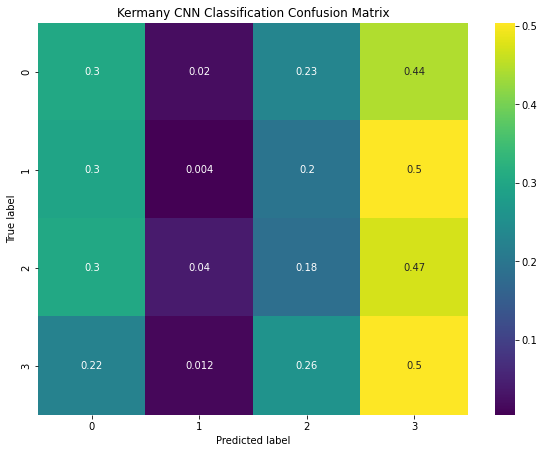

In [ ]:
import seaborn as sns

cm_kcnn = cm_kcnn.astype('float') / cm_kcnn.sum(axis=1)[:, np.newaxis]
figure = plt.figure(figsize=(8, 6))
sns.heatmap(cm_kcnn, annot=True,cmap=plt.cm.viridis)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Kermany CNN Classification Confusion Matrix')
plt.show()

In [ ]:
kcnn_scores = kcnn.evaluate_generator(val_batches)
print("%s: %.2f%%" % (kcnn.metrics_names[1], kcnn_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 42.91%


In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.model_selection import KFold, StratifiedKFold
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint

weights = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

#set early stopping criteria
pat = 3 #this is the number of epochs with no improvment after which the training will stop
early_stopping = EarlyStopping(monitor='accuracy', patience=pat, verbose=1)

#define the model checkpoint callback -> this will keep on saving the model as a physical file
model_checkpoint = ModelCheckpoint('kcnn_oct_1.h5', verbose=1, save_best_only=True)

#define a function to fit the model
def fit_and_evaluate(train, val, EPOCHS=8, BATCH_SIZE=50):
    model = None
    model = kcnn
    results = model.fit(train, epochs=EPOCHS, batch_size=BATCH_SIZE, callbacks=[early_stopping, model_checkpoint], 
              validation_data=val,  shuffle=True, verbose=1, class_weight=weights)  
    print("Val Score: ", model.evaluate(val))
    return results

In [ ]:
n_folds=5
epochs=8
batch_size=150

#save the model history in a list after fitting so that we can plot later
model_history = [] 
s1 = 0
s2 = 0



for i in range(n_folds):
    '''print("Training on Fold: ",i+1)
    td = ztrain_data[s1:600*i]
    tl = ztrain_label[s1:600*i]
    vd = zval_data[s2:60*i]
    vl = zval_label[s2:60*i]
    s1 = 600*i
    s2 = 60*i'''
    h = fit_and_evaluate(test_batches, val_batches, epochs, batch_size)
    model_history.append(h)
    print("======="*12, model_history, end="\n\n\n")

Epoch 1/8
7/7 [==============================] - ETA: 0s - loss: 1.4817 - accuracy: 0.3280 - false_negatives: 1000.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - specificity_at_sensitivity_27: 0.5100 - sensitivity_at_specificity_27: 0.5110 - auc: 0.6038
Epoch 1: val_loss improved from inf to 1.38010, saving model to kcnn_oct_1.h5
7/7 [==============================] - 17s 3s/step - loss: 1.4817 - accuracy: 0.3280 - false_negatives: 1000.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - specificity_at_sensitivity_27: 0.5100 - sensitivity_at_specificity_27: 0.5110 - auc: 0.6038 - val_loss: 1.3801 - val_accuracy: 0.3194 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_27: 0.3360 - val_sensitivity_at_specificity_27: 0.4311 - val_auc: 0.5371
Epoch 2/8
7/7 [==============================] - ETA: 0s - loss: 1.4749 - accuracy: 0.3300 - false_negatives: 1000.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - specificit

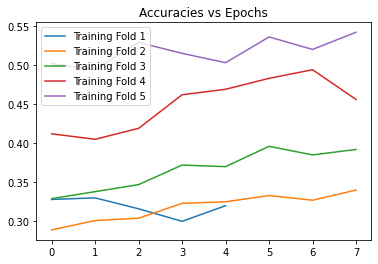

In [ ]:
plt.title('Accuracies vs Epochs')
plt.plot(model_history[0].history['accuracy'], label='Training Fold 1')
plt.plot(model_history[1].history['accuracy'], label='Training Fold 2')
plt.plot(model_history[2].history['accuracy'], label='Training Fold 3')
plt.plot(model_history[3].history['accuracy'], label='Training Fold 4')
plt.plot(model_history[4].history['accuracy'], label='Training Fold 5')
plt.legend()
plt.show()

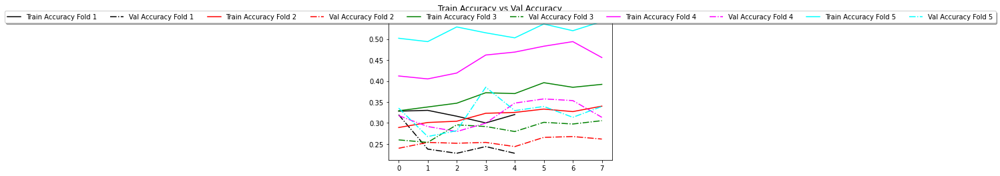

In [ ]:
plt.title('Train Accuracy vs Val Accuracy')
plt.plot(model_history[0].history['accuracy'], label='Train Accuracy Fold 1', color='black')
plt.plot(model_history[0].history['val_accuracy'], label='Val Accuracy Fold 1', color='black', linestyle = "dashdot")
plt.plot(model_history[1].history['accuracy'], label='Train Accuracy Fold 2', color='red', )
plt.plot(model_history[1].history['val_accuracy'], label='Val Accuracy Fold 2', color='red', linestyle = "dashdot")
plt.plot(model_history[2].history['accuracy'], label='Train Accuracy Fold 3', color='green', )
plt.plot(model_history[2].history['val_accuracy'], label='Val Accuracy Fold 3', color='green', linestyle = "dashdot")
plt.plot(model_history[3].history['accuracy'], label='Train Accuracy Fold 4', color='magenta', )
plt.plot(model_history[3].history['val_accuracy'], label='Val Accuracy Fold 4', color='magenta', linestyle = "dashdot")
plt.plot(model_history[4].history['accuracy'], label='Train Accuracy Fold 5', color='cyan', )
plt.plot(model_history[4].history['val_accuracy'], label='Val Accuracy Fold 5', color='cyan', linestyle = "dashdot")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=10, fancybox=True, shadow=True)
#plt.legend()
plt.show()

In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'kcnnc_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

## <font color='DeepPink'> Using SVM as last layer of CNN for Classifier </font>



---


## <font color='magenta'> Using CNN - SVM for Classification- Using Hinge loss and Regularization </font>

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import numpy as np
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import optimizers
from keras.losses import categorical_hinge


In [ ]:
cnsv = Sequential()
cnsv.add(Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_uniform', input_shape=(224, 224, 3)))
cnsv.add(Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(128, (3, 3), activation='relu',kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(64, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))


In [ ]:
from tensorflow.keras import regularizers


cnsv.add(Flatten())
cnsv.add(Dense(64, activation='sigmoid'))
cnsv.add(Dense(4, kernel_regularizer=tf.keras.regularizers.l2(0.01), activation = "softmax"))


In [ ]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

 
    train_path = data_dir +'/train'
    val_path = data_dir +'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN','NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [ ]:
train_batches, val_batches, test_batches = Kermany2018(50, 224, '/content/drive/MyDrive/OCT2017-Data/')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 50
epoch = 10
val_size = 501

In [ ]:
from keras import metrics


sp_sn = tf.keras.metrics.SpecificityAtSensitivity(0.6)
sn_sp = tf.keras.metrics.SensitivityAtSpecificity(0.6)

metrics=['accuracy', 'FalseNegatives', 'Precision', 'Recall', sp_sn, sn_sp, 'AUC']

cnsv.compile(loss='categorical_hinge',optimizer='adam', metrics=metrics)  

wj=n_samples / (n_classes * n_samplesj)

wj is the weight for each class(j signifies the class)/
n_samplesis the total number of samples or rows in the dataset/
n_classesis the total number of unique classes in the target/
n_samplesjis the total number of rows of the respective class/

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [ ]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017-Data/CNN_SV-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
#import memory_profiler

In [ ]:
#from memory_profiler import profile


In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit cnsv_c = cnsv.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=20, class_weight=class_weight, callbacks=callbacks_list, verbose=1)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/20
155/155 [==============================] - 145s 918ms/step - loss: 1.0854 - accuracy: 0.2475 - false_negatives: 7750.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - specificity_at_sensitivity_42: 0.3429 - sensitivity_at_specificity_42: 0.3365 - auc: 0.5106 - val_loss: 1.0720 - val_accuracy: 0.1916 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_42: 0.0000e+00 - val_sensitivity_at_specificity_42: 0.2575 - val_auc: 0.3917
Epoch 2/20
155/155 [==============================] - 140s 901ms/step - loss: 1.0581 - accuracy: 0.3338 - false_negatives: 7517.0000 - precision: 0.7741 - recall: 0.0301 - specificity_at_sensitivity_42: 0.3441 - sensitivity_at_specificity_42: 0.3339 - auc: 0.5816 - val_loss: 1.0534 - val_accuracy: 0.2615 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_42: 0.2794 - val_sensitivity_at_specificity_42: 0.4152 - val_auc: 0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 1493.637568000002 duration2= 1550.3251552581787


In [ ]:
np.save('/content/drive/MyDrive/OCT2017-Data/history-cnsvc.npy',cnsv_c.history)

In [ ]:
history_cnsv=np.load('/content/drive/MyDrive/OCT2017-Data/history-cnsv.npy',allow_pickle='TRUE').item()


In [ ]:
best_epoch_model = np.argmin(cnsv_c.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, cnsv_c.history['val_loss'][best_epoch_model], cnsv_c.history['val_accuracy'][best_epoch_model]))

best epoch:10 validation loss:0.830 validation acc:0.447


In [ ]:
cnsv_scores = cnsv.evaluate_generator(val_batches, verbose=0)
print("%s: %.2f%%" % (cnsv.metrics_names[1], cnsv_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 45.31%


In [ ]:
print(cnsv_c.history.keys())

dict_keys(['loss', 'accuracy', 'false_negatives', 'precision', 'recall', 'specificity_at_sensitivity_42', 'sensitivity_at_specificity_42', 'auc', 'val_loss', 'val_accuracy', 'val_false_negatives', 'val_precision', 'val_recall', 'val_specificity_at_sensitivity_42', 'val_sensitivity_at_specificity_42', 'val_auc'])


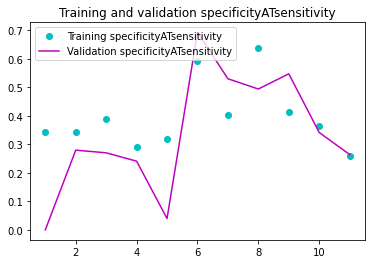

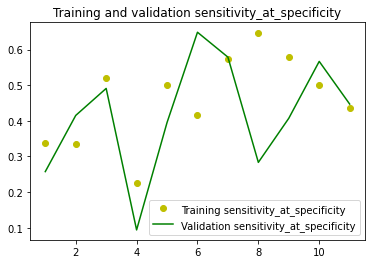

In [ ]:
import matplotlib.pyplot as plt

specificityATsensitivity = cnsv_c.history['specificity_at_sensitivity_42']
sensitivityATspecificity = cnsv_c.history['sensitivity_at_specificity_42']
val_specificityATsensitivity = cnsv_c.history['val_specificity_at_sensitivity_42']
val_sensitivityATspecificity = cnsv_c.history['val_sensitivity_at_specificity_42']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training specificityATsensitivity')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation specificityATsensitivity')
plt.title('Training and validation specificityATsensitivity')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training sensitivity_at_specificity')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation sensitivity_at_specificity')
plt.title('Training and validation sensitivity_at_specificity')
plt.legend()
plt.show()

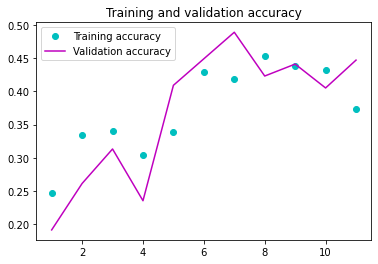

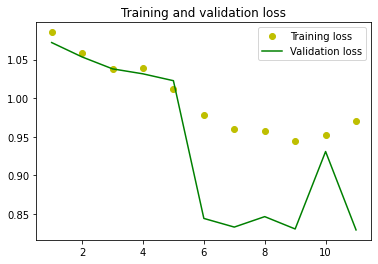

In [ ]:
import matplotlib.pyplot as plt

acc = cnsv_c.history['accuracy']
val_acc = cnsv_c.history['val_accuracy']
loss = cnsv_c.history['loss']
val_loss = cnsv_c.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'co', label='Training accuracy')
plt.plot(epochs, val_acc, 'm', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'yo', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

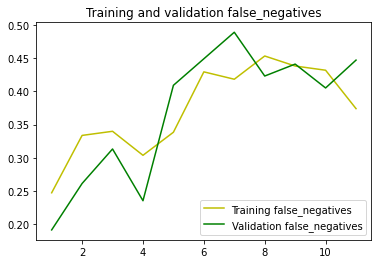

In [ ]:
import matplotlib.pyplot as plt

falseNegatives = cnsv_c.history['false_negatives']
val_falseNegatives = cnsv_c.history['val_false_negatives']


epochs = range(1, len(falseNegatives) + 1)

plt.plot(epochs, acc, 'y-', label='Training false_negatives')
plt.plot(epochs, val_acc, 'g', label='Validation false_negatives')
plt.title('Training and validation false_negatives')
plt.legend()



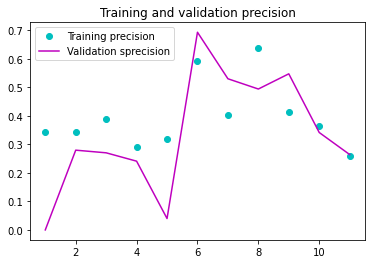

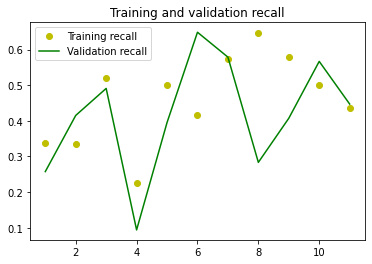

In [ ]:
import matplotlib.pyplot as plt

Precision = cnsv_c.history['precision']
Recall = cnsv_c.history['recall']
val_Precision = cnsv_c.history['val_precision']
val_Recall = cnsv_c.history['val_recall']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training precision')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation sprecision')
plt.title('Training and validation precision')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training recall')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation recall')
plt.title('Training and validation recall')
plt.legend()
plt.show()

In [ ]:
cnsv_pred =cnsv.predict(test_batches)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


#Confution Matrix and Classification Report
cnsv_pred = np.argmax(cnsv_pred, axis=1)

cm_cnsv = confusion_matrix(test_batches.classes, cnsv_pred)

print('Confusion Matrix')
print(cm_cnsv)


Confusion Matrix
[[163   0   0  87]
 [167   0   0  83]
 [167   0   0  83]
 [162   0   0  88]]


In [ ]:
from sklearn.metrics import confusion_matrix

cnsv_matrix = cm_cnsv
FP = cnsv_matrix.sum(axis=0) - np.diag(cnsv_matrix)  
FN = cnsv_matrix.sum(axis=1) - np.diag(cnsv_matrix)
TP = np.diag(cnsv_matrix)
TN = cnsv_matrix.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.652 0.    0.    0.352]
Specificity :  [0.33866667 1.         1.         0.66266667]
Precision :  [0.24734446        nan        nan 0.25806452]
FPR :  [0.66133333 0.         0.         0.33733333]
FNR :  [0.348 1.    1.    0.648]
Accuracy :  [0.417 0.75  0.75  0.585]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_batches.classes, cnsv_pred)


0.251

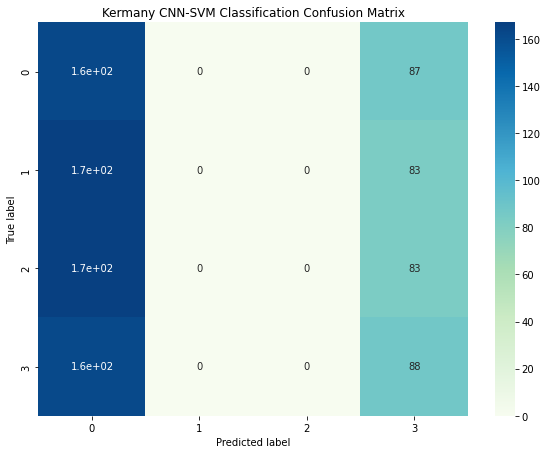

In [ ]:
import seaborn as sns


figure = plt.figure(figsize=(8, 6))
sns.heatmap(cm_cnsv, annot=True,cmap=plt.cm.GnBu)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Kermany CNN-SVM Classification Confusion Matrix')
plt.show()

In [ ]:
cnsv_scores = cnsv.evaluate_generator(val_batches)
print("%s: %.2f%%" % (cnsv.metrics_names[1], cnsv_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 43.51%


In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.model_selection import KFold, StratifiedKFold
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint



#set early stopping criteria
pat = 3 #this is the number of epochs with no improvment after which the training will stop
early_stopping = EarlyStopping(monitor='accuracy', patience=pat, verbose=1)

#define the model checkpoint callback -> this will keep on saving the model as a physical file
model_checkpoint = ModelCheckpoint('cnsvoct_1.h5', verbose=1, save_best_only=True)

#define a function to fit the model
def fit_and_evaluate(train, val, EPOCHS=8, BATCH_SIZE=50):
    model = None
    model = cnsv
    results = model.fit(train, epochs=EPOCHS, batch_size=BATCH_SIZE, callbacks=[early_stopping, model_checkpoint], 
              validation_data=val,  shuffle=True, verbose=1, class_weight=class_weight)  
    print("Val Score: ", model.evaluate(val))
    return results

In [ ]:
n_folds=5
epochs=8
batch_size=150

#save the model history in a list after fitting so that we can plot later
model_history = [] 
s1 = 0
s2 = 0

for i in range(n_folds):
    '''print("Training on Fold: ",i+1)
    td = ztrain_data[s1:600*i]
    tl = ztrain_label[s1:600*i]
    vd = zval_data[s2:60*i]
    vl = zval_label[s2:60*i]
    s1 = 600*i
    s2 = 60*i'''
    h = fit_and_evaluate(test_batches, val_batches, epochs, batch_size)
    model_history.append(h)
    print("======="*12, model_history, end="\n\n\n")

Epoch 1/8
20/20 [==============================] - ETA: 0s - loss: 1.0433 - accuracy: 0.4330 - false_negatives: 828.0000 - precision: 0.8473 - recall: 0.1720 - specificity_at_sensitivity_42: 0.2313 - sensitivity_at_specificity_42: 0.4780 - auc: 0.6929
Epoch 1: val_loss improved from inf to 0.96898, saving model to cnsvoct_1.h5
20/20 [==============================] - 15s 767ms/step - loss: 1.0433 - accuracy: 0.4330 - false_negatives: 828.0000 - precision: 0.8473 - recall: 0.1720 - specificity_at_sensitivity_42: 0.2313 - sensitivity_at_specificity_42: 0.4780 - auc: 0.6929 - val_loss: 0.9690 - val_accuracy: 0.2894 - val_false_negatives: 471.0000 - val_precision: 1.0000 - val_recall: 0.0599 - val_specificity_at_sensitivity_42: 0.0745 - val_sensitivity_at_specificity_42: 0.2934 - val_auc: 0.5620
Epoch 2/8
20/20 [==============================] - ETA: 0s - loss: 1.0274 - accuracy: 0.4410 - false_negatives: 810.0000 - precision: 0.8796 - recall: 0.1900 - specificity_at_sensitivity_42: 0.2543

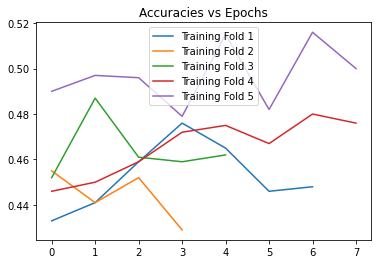

In [ ]:
plt.title('Accuracies vs Epochs')
plt.plot(model_history[0].history['accuracy'], label='Training Fold 1')
plt.plot(model_history[1].history['accuracy'], label='Training Fold 2')
plt.plot(model_history[2].history['accuracy'], label='Training Fold 3')
plt.plot(model_history[3].history['accuracy'], label='Training Fold 4')
plt.plot(model_history[4].history['accuracy'], label='Training Fold 5')
plt.legend()
plt.show()

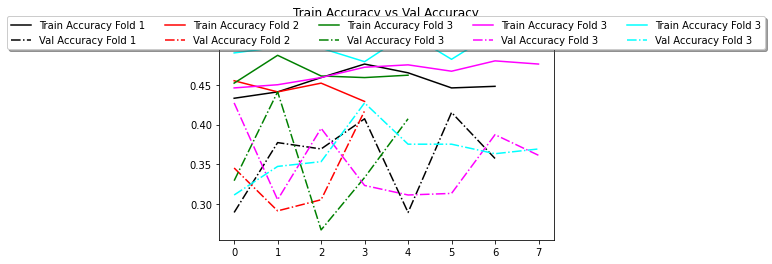

In [ ]:
plt.title('Train Accuracy vs Val Accuracy')
plt.plot(model_history[0].history['accuracy'], label='Train Accuracy Fold 1', color='black')
plt.plot(model_history[0].history['val_accuracy'], label='Val Accuracy Fold 1', color='black', linestyle = "dashdot")
plt.plot(model_history[1].history['accuracy'], label='Train Accuracy Fold 2', color='red', )
plt.plot(model_history[1].history['val_accuracy'], label='Val Accuracy Fold 2', color='red', linestyle = "dashdot")
plt.plot(model_history[2].history['accuracy'], label='Train Accuracy Fold 3', color='green', )
plt.plot(model_history[2].history['val_accuracy'], label='Val Accuracy Fold 3', color='green', linestyle = "dashdot")
plt.plot(model_history[3].history['accuracy'], label='Train Accuracy Fold 3', color='magenta', )
plt.plot(model_history[3].history['val_accuracy'], label='Val Accuracy Fold 3', color='magenta', linestyle = "dashdot")
plt.plot(model_history[4].history['accuracy'], label='Train Accuracy Fold 3', color='cyan', )
plt.plot(model_history[4].history['val_accuracy'], label='Val Accuracy Fold 3', color='cyan', linestyle = "dashdot")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=5, fancybox=True, shadow=True)
#plt.legend()
plt.show()

In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'cnsvc_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

In [ ]:
import pickle

filename = 'cnsv_model.sav'
pickle.dump(cnsv, open(filename, 'wb'))

INFO:tensorflow:Assets written to: ram://d90739b1-b1e3-46b3-9a12-b4eabaceb4d9/assets


In [ ]:

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(test_batches, test_label)
print(result)

# <font color='gold'> Comparing the significance of different Classification models </font>

In [3]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

    train_path = data_dir+'/train'
    val_path = data_dir+'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN' ,'NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [4]:
train_batches, val_batches, test_batches = Kermany2018(50, 150, '/content/drive/MyDrive/OCT2017-Data')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
def model_extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 3, 3, 256))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(150, 150),
      batch_size = batch_size,
      class_mode ='binary')
 

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = zf_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [5]:
batch_size = 50
epoch = 10

In [ ]:
train_feature, train_label = model_extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
validation_feature, validation_label = model_extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
test_feature, test_label = model_extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
train_feature = np.reshape(train_feature, (7752, 3 * 3 * 256))
validation_feature = np.reshape(validation_feature, (501, 3 * 3 * 256))
test_feature = np.reshape(test_feature, (1000, 3 * 3 * 256))

In [6]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 50
epoch = 10
val_size = 501

In [9]:
kcnn = Sequential()
kcnn.add(Conv2D(16, (3, 3), activation='relu',kernel_initializer='he_uniform', input_shape=(150, 150, 3)))

kcnn.add(Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))


kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))


kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())

kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))

kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='sigmoid',  padding='same'))
kcnn.add(Dropout(0.2))

kcnn.add(Conv2D(4, (3, 3), activation='sigmoid',  padding='same'))

kcnn.add(Dropout(0.2))


In [10]:
kcnn.add(Flatten())
#kcnn.add(Dense(4, activation='relu'))
kcnn.add(Dense(4, activation='softmax'))

In [11]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [114]:
from tensorflow.keras import optimizers

opt1 = tf.keras.optimizers.SGD(learning_rate=0.01)


In [12]:
kcnn.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])

In [13]:

history = kcnn.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=10, class_weight=class_weight, verbose=1)


Epoch 1/10
155/155 [==============================] - 83s 478ms/step - loss: 1.4167 - accuracy: 0.2730 - val_loss: 1.3751 - val_accuracy: 0.3214
Epoch 2/10
155/155 [==============================] - 70s 452ms/step - loss: 1.3867 - accuracy: 0.2671 - val_loss: 1.3683 - val_accuracy: 0.4291
Epoch 3/10
155/155 [==============================] - 69s 447ms/step - loss: 1.3795 - accuracy: 0.2890 - val_loss: 1.3562 - val_accuracy: 0.4611
Epoch 4/10
155/155 [==============================] - 69s 446ms/step - loss: 1.3649 - accuracy: 0.3283 - val_loss: 1.3259 - val_accuracy: 0.4511
Epoch 5/10
155/155 [==============================] - 69s 446ms/step - loss: 1.3365 - accuracy: 0.3692 - val_loss: 1.2728 - val_accuracy: 0.4192
Epoch 6/10
155/155 [==============================] - 70s 450ms/step - loss: 1.2683 - accuracy: 0.4218 - val_loss: 1.1565 - val_accuracy: 0.5429
Epoch 7/10
155/155 [==============================] - 69s 448ms/step - loss: 1.1925 - accuracy: 0.4715 - val_loss: 1.1803 - val_ac

In [15]:
cnsv = Sequential()
cnsv.add(Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_uniform', input_shape=(150, 150, 3)))
cnsv.add(Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))

cnsv.add(Conv2D(128, (3, 3), activation='relu',kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(64, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))


In [16]:
from tensorflow.keras import regularizers


cnsv.add(Flatten())
cnsv.add(Dense(64, activation='sigmoid'))
cnsv.add(Dense(4, kernel_regularizer=tf.keras.regularizers.l2(0.01), activation = "softmax"))


In [17]:
from keras import metrics

cnsv.compile(loss='categorical_hinge',optimizer='adam', metrics='accuracy')  

In [18]:

cnsv_c = cnsv.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=10, class_weight=class_weight, verbose=1)


Epoch 1/10
155/155 [==============================] - 73s 465ms/step - loss: 1.0867 - accuracy: 0.2543 - val_loss: 1.0729 - val_accuracy: 0.1976
Epoch 2/10
155/155 [==============================] - 70s 449ms/step - loss: 1.0645 - accuracy: 0.2492 - val_loss: 1.0577 - val_accuracy: 0.1916
Epoch 3/10
155/155 [==============================] - 70s 449ms/step - loss: 1.0540 - accuracy: 0.2421 - val_loss: 1.0505 - val_accuracy: 0.2036
Epoch 4/10
155/155 [==============================] - 70s 449ms/step - loss: 1.0455 - accuracy: 0.2512 - val_loss: 1.0401 - val_accuracy: 0.2036
Epoch 5/10
155/155 [==============================] - 70s 453ms/step - loss: 1.0381 - accuracy: 0.2547 - val_loss: 1.0346 - val_accuracy: 0.4072
Epoch 6/10
155/155 [==============================] - 70s 450ms/step - loss: 1.0334 - accuracy: 0.2572 - val_loss: 1.0295 - val_accuracy: 0.1916
Epoch 7/10
155/155 [==============================] - 69s 448ms/step - loss: 1.0284 - accuracy: 0.2450 - val_loss: 1.0253 - val_ac

In [135]:
vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

for layer in vgg16_base.layers[:15]:
            layer.trainable = False



In [136]:
for layer in vgg16_base.layers[15:]:
    layer.trainable = True

In [137]:

vgg16c = Sequential()
vgg16c.add(vgg16_base)
#vgg16c.add(Conv2D(256, (4, 4), activation='relu'))
#vgg16c.add(MaxPooling2D(2, 2))
vgg16c.add(Flatten())
vgg16c.add(Dense(256, activation='relu'))
vgg16c.add(Dense(64, activation='relu'))
vgg16c.add(Dense(4,activation='softmax'))


In [138]:


vgg16c.compile(optimizer=optimizers.RMSprop(lr=2e-5), 
              loss='categorical_crossentropy',
              metrics='accuracy')



/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [139]:
vg16_c = vgg16c.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=10, class_weight=class_weight, verbose=1)

Epoch 1/10
155/155 [==============================] - 123s 468ms/step - loss: 0.9145 - accuracy: 0.6185 - val_loss: 0.8378 - val_accuracy: 0.6367
Epoch 2/10
155/155 [==============================] - 72s 466ms/step - loss: 0.5503 - accuracy: 0.7895 - val_loss: 0.5010 - val_accuracy: 0.8263
Epoch 3/10
155/155 [==============================] - 73s 469ms/step - loss: 0.4460 - accuracy: 0.8284 - val_loss: 0.7180 - val_accuracy: 0.7206
Epoch 4/10
155/155 [==============================] - 71s 460ms/step - loss: 0.3947 - accuracy: 0.8532 - val_loss: 0.4308 - val_accuracy: 0.8563
Epoch 5/10
155/155 [==============================] - 71s 458ms/step - loss: 0.3520 - accuracy: 0.8730 - val_loss: 0.3995 - val_accuracy: 0.8743
Epoch 6/10
155/155 [==============================] - 71s 457ms/step - loss: 0.3356 - accuracy: 0.8766 - val_loss: 0.4119 - val_accuracy: 0.8643
Epoch 7/10
155/155 [==============================] - 72s 462ms/step - loss: 0.3214 - accuracy: 0.8800 - val_loss: 0.3579 - val_a

In [20]:
#coding=utf-8  
from keras.models import Sequential  
from keras.layers import Dense,Flatten,Dropout  
from keras.layers.convolutional import Conv2D,MaxPooling2D  
from keras.utils.np_utils import to_categorical  
import numpy as np  
seed = 7  
np.random.seed(seed)  
  
zf = Sequential()  
zf.add(Conv2D(96,(7,7),strides=(2,2),input_shape=(150,150,3),padding='valid',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(256,(5,5),strides=(2,2),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(256,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Flatten())  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4,activation='softmax'))  
 

In [21]:
zf.compile(loss='categorical_crossentropy',optimizer='sgd', metrics='accuracy')  


In [22]:

history_zf = zf.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=10, verbose=1)



Epoch 1/10
155/155 [==============================] - 71s 453ms/step - loss: 1.3352 - accuracy: 0.3948 - val_loss: 1.3058 - val_accuracy: 0.4072
Epoch 2/10
155/155 [==============================] - 69s 446ms/step - loss: 1.3074 - accuracy: 0.4017 - val_loss: 1.2866 - val_accuracy: 0.4072
Epoch 3/10
155/155 [==============================] - 70s 453ms/step - loss: 1.2703 - accuracy: 0.4285 - val_loss: 1.4323 - val_accuracy: 0.4052
Epoch 4/10
155/155 [==============================] - 69s 447ms/step - loss: 1.2379 - accuracy: 0.4508 - val_loss: 1.1588 - val_accuracy: 0.4810
Epoch 5/10
155/155 [==============================] - 69s 447ms/step - loss: 1.2034 - accuracy: 0.4706 - val_loss: 1.1646 - val_accuracy: 0.4651
Epoch 6/10
155/155 [==============================] - 69s 448ms/step - loss: 1.1734 - accuracy: 0.4872 - val_loss: 1.1909 - val_accuracy: 0.4451
Epoch 7/10
155/155 [==============================] - 70s 452ms/step - loss: 1.1468 - accuracy: 0.4969 - val_loss: 1.1362 - val_ac

In [14]:
cnd_pred = kcnn.predict(test_batches)

In [ ]:
vd_pred = rforest.predict(test_batches)

In [19]:
cnsv_pred = cnsv.predict(test_batches)

In [134]:
dzf_pred = zf.predict(test_batches)

In [ ]:
from mlxtend.evaluate import ftest
import numpy as np


In [141]:
f, p_value = ftest(cnd_pred, 
                   vd_pred,
                   cnsv_pred,
                   dzf_pred)

print('F: %.3f' % f)
print('p-value: %.3f' % p_value)

#prf_pred,

ValueError: ignored

In [ ]:
f, p_value = ftest(cnd_pred, vd_pred, cnsv_pred)

print('F: %.3f' % f)
print('p-value: %.3f' % p_value)

F: 4.427
p-value: 0.036


/usr/local/lib/python3.7/dist-packages/mlxtend/evaluate/f_test.py:80: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  mod in y_model_predictions)).astype(int)


In [ ]:
f, p_value = ftest(cnd_pred, dzf_pred, vd_pred)
print('F: %.3f' % f)
print('p-value: %.3f' % p_value)

F: 2.410
p-value: 0.121


/usr/local/lib/python3.7/dist-packages/mlxtend/evaluate/f_test.py:80: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  mod in y_model_predictions)).astype(int)


In [ ]:
f, p_value = ftest(cnsv_pred, dzf_pred, vd_pred)
print('F: %.3f' % f)
print('p-value: %.3f' % p_value)

F: 0.870
p-value: 0.351


/usr/local/lib/python3.7/dist-packages/mlxtend/evaluate/f_test.py:80: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  mod in y_model_predictions)).astype(int)


In [ ]:
f, p_value = ftest(cnsv_pred, dzf_pred, cnd_pred)
print('F: %.3f' % f)
print('p-value: %.3f' % p_value)

F: 0.928
p-value: 0.336


/usr/local/lib/python3.7/dist-packages/mlxtend/evaluate/f_test.py:80: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  mod in y_model_predictions)).astype(int)


# <font color='BlueViolet'> Using Machine learning Algorithms (Random Forest, XGBoost) </font>


## <font color='purple'> Using Random Forest as feature extractor and Classifier </font>

In [ ]:
import math

n = 150
#number_of_examples = len(train_batches.filenames)
number_generator = math.ceil(2250 / (1.0 * n)) 
#number_generator = round((2250 / (1.0 * n)), 2)

# 1.0 above is to skip integer division

strain_label = []
strain_data = []

for i in range(0,int(number_generator)):
    strain_label.extend(np.array(train_generator1[i][1]))
    strain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
strain_label = np.array(strain_label)
strain_data = np.array(strain_data)

In [ ]:
np.array(strain_data).shape

(2250, 224, 224, 3)

In [ ]:
strain_data = strain_data.reshape([2250, 224*224*3])

In [ ]:

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(750 / (1.0 * n)) 
#number_generator = round((750 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

stest_label = []
stest_data = []

for i in range(0,int(number_generator)):
    stest_label.extend(np.array(test_generator1[i][1]))
    stest_data.extend(np.array(test_generator1[i][0]))


In [ ]:
stest_label = np.array(stest_label)
stest_data = np.array(stest_data)

In [ ]:
stest_label.shape

(750,)

In [ ]:
stest_data = stest_data.reshape([750, 224*224*3])

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(300 / (1.0 * n)) 
#number_generator = round((300 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

sval_label1 = []
sval_data1 = []

for i in range(0,int(number_generator)):
    sval_label1.extend(np.array(val_generator1[i][1]))
    sval_data1.extend(np.array(val_generator1[i][0]))


In [ ]:
sval_label = np.array(sval_label1)
sval_data = np.array(sval_data1)

In [ ]:
sval_data.shape

(300, 224, 224, 3)

In [ ]:
sval_data = sval_data.reshape (300, 224*224*3)

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
#number_generator = math.ceil(500 / (1.0 * n)) 
number_generator = round((500 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

sval_label2 = []
sval_data2 = []

for i in range(0,int(number_generator)):
    sval_label2.extend(np.array(val_generator1[i][1]))
    sval_data2.extend(np.array(val_generator1[i][0]))


In [ ]:
svalcv_label = np.array(sval_label2)
svalcv_data = np.array(sval_data2)

In [ ]:
svalcv_data.shape

(450, 224, 224, 3)

In [ ]:
svalcv_data = svalcv_data.reshape (450, 224*224*3)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV



rfc=RandomForestClassifier(random_state=42)
param_grid = { 
    'min_samples_leaf': [2, 4],
    'max_features': ['auto', 'sqrt'],
    'max_depth' : [10,20],
    'criterion' :['gini', 'entropy']
}
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(sval_data, sval_label)

NameError: ignored

In [ ]:
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'max_features': 'auto',
 'min_samples_leaf': 2}

In [ ]:
import pickle
import time
#import scalene

In [ ]:
#from scalene import scalene_profiler


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')


In [ ]:
start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


rforest.fit(strain_data, strain_label)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 140.679451 duration2= 140.83994507789612


In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'forest_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

In [ ]:
rf_pred = rforest.predict(stest_data)

In [ ]:

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(ptest_data, ptest_label)
print(result)

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, sval_data, sval_label, cv=5)
np.average(scores)
np.mean(scores)

0.44333333333333336

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(stest_label, rf_pred)


0.33066666666666666

In [ ]:
cm = confusion_matrix(stest_label,rf_pred)

In [ ]:
from sklearn.metrics import confusion_matrix

cnf_matrix = cm
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.30851064 0.00552486 0.11398964 0.88829787]
Specificity :  [0.90747331 0.98945518 0.92100539 0.28825623]
Precision :  [0.52727273 0.14285714 0.33333333 0.29453263]
FPR :  [0.09252669 0.01054482 0.07899461 0.71174377]
FNR :  [0.69148936 0.99447514 0.88601036 0.11170213]
Accuracy :  [0.75733333 0.752      0.71333333 0.43866667]


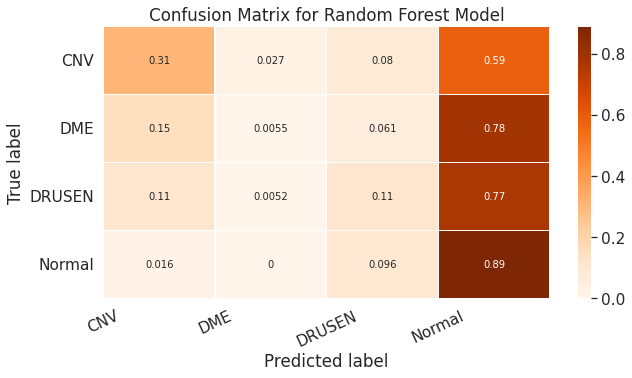

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(stest_label, rf_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Oranges, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Random Forest Model')
plt.show()

In [ ]:
print(classification_report(stest_label, rf_pred))


              precision    recall  f1-score   support

         0.0       0.53      0.31      0.39       188
         1.0       0.14      0.01      0.01       181
         2.0       0.33      0.11      0.17       193
         3.0       0.29      0.89      0.44       188

    accuracy                           0.33       750
   macro avg       0.32      0.33      0.25       750
weighted avg       0.33      0.33      0.25       750



In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

rf1 = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=4, class_weight='balanced')
rf1.fit(strain_data, strain_label)
rf_score = rforest.predict_proba(stest_data)

#Binarize the output
rf_bin = label_binarize(stest_label, classes=[1, 2, 3, 4])
n_classes = rf_bin.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(rf_bin[:, i], rf_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


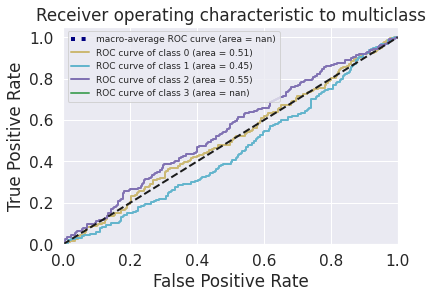

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['y','c', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

#fig, ax = plt.subplots(figsize=(8, 6))

plt.set_facecolor = 'white'
plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC curve for Random Forest Classifier")
plt.legend(loc="upper left", fontsize='9')
plt.show()

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	rfc_scores = cross_val_score(rforest, svalcv_data, svalcv_label, scoring='accuracy', cv=cv)
	results.append(np.mean(rfc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

KeyboardInterrupt: ignored

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, sval_data, sval_label, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('Random Forest Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(rforest, svalcv_data, svalcv_label, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())


In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

## <font color='purple'> Using XGBoost for Classification </font>

In [ ]:
import math

n = 150
#number_of_examples = len(train_batches.filenames)
number_generator = math.ceil(2250 / (1.0 * n)) 
#number_generator = round((2250 / (1.0 * n)), 2)

# 1.0 above is to skip integer division

xtrain_label = []
xtrain_data = []

for i in range(0,int(number_generator)):
    xtrain_label.extend(np.array(train_generator1[i][1]))
    xtrain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
xtrain_label = np.array(xtrain_label)
xtrain_data = np.array(xtrain_data)

In [ ]:
np.array(xtrain_data).shape

(2250, 224, 224, 3)

In [ ]:
xtrain_data = xtrain_data.reshape([2250, 224*224*3])

In [ ]:

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(750 / (1.0 * n)) 
#number_generator = round((750 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

xtest_label = []
xtest_data = []

for i in range(0,int(number_generator)):
    xtest_label.extend(np.array(test_generator1[i][1]))
    xtest_data.extend(np.array(test_generator1[i][0]))


In [ ]:
xtest_label = np.array(xtest_label)
xtest_data = np.array(xtest_data)

In [ ]:
xtest_data = xtest_data.reshape([750, 224*224*3])

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(300 / (1.0 * n)) 
#number_generator = round((300 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

xval_label1 = []
xval_data1 = []

for i in range(0,int(number_generator)):
    xval_label1.extend(np.array(val_generator1[i][1]))
    xval_data1.extend(np.array(val_generator1[i][0]))


In [ ]:
xval_label = np.array(xval_label1)
xval_data = np.array(xval_data1)

In [ ]:
xval_data.shape

(300, 224, 224, 3)

In [ ]:
xval_data = xval_data.reshape (300, 224*224*3)

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
#number_generator = math.ceil(450 / (1.0 * n)) 
number_generator = round((450 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

xval_label2 = []
xval_data2 = []

for i in range(0,int(number_generator)):
    xval_label2.extend(np.array(val_generator1[i][1]))
    xval_data2.extend(np.array(val_generator1[i][0]))


In [ ]:
xvalcv_label = np.array(xval_label2)
xvalcv_data = np.array(xval_data2)

In [ ]:
xvalcv_data.shape

(450, 224, 224, 3)

In [ ]:
xvalcv_data = xvalcv_data.reshape (450, 224*224*3)

In [ ]:
import xgboost as xgb
from xgboost import XGBClassifier

from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import StratifiedKFold


In [ ]:
xgbc = xgb.XGBClassifier(objective="multi:softprob", random_state=42, max_depth = 1, n_estimators = 10)

In [ ]:
import pickle
import time
#import scalene

In [ ]:
'''xgbc = XGBClassifier(learning_rate=0.02, objective='binary:logistic', weights='balanced',
                    silent=True, nthread=1, scale_pos_weight=100)
xgbc = xgb.XGBClassifier(learning_rate = 0.1,
                max_depth = 2, alpha = 10, n_estimators = 20)'''

In [ ]:
start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


xgbc.fit(xtrain_data, xtrain_label)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 2139.2229389999998 duration2= 1109.5825235843658


In [ ]:

# save the model to disk
filename = '/content/drive/MyDrive/OCT2017_2/xgboost_model.sav'
pickle.dump(xgbc, open(filename, 'wb'))
 

In [ ]:
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(xtest_data, xtest_label)
print(result)

In [ ]:
xgb_pred = xgbc.predict(xtest_data)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(xtest_label, xgb_pred)


0.2906666666666667

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(xgbc, xval_data, xval_label, cv=5)
np.average(scores)
np.mean(scores)

0.4095238095238095

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(xtest_label, xgb_pred)


0.34933333333333333

In [ ]:
confusion_matrix(xtest_label, xgb_pred)


array([[46, 29, 31, 79],
       [32, 39, 27, 87],
       [43, 29, 38, 82],
       [34, 36, 23, 95]])

In [ ]:
from sklearn.metrics import confusion_matrix

cnf_matrix = cm
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.408 0.168 0.304 0.52 ]
Specificity :  [0.81866667 0.86933333 0.78666667 0.65866667]
Precision :  [0.42857143 0.3        0.3220339  0.33678756]
FPR :  [0.18133333 0.13066667 0.21333333 0.34133333]
FNR :  [0.592 0.832 0.696 0.48 ]
Accuracy :  [0.716 0.694 0.666 0.624]


In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

xgb1 = xgb.XGBClassifier(probability = True, class_weight='balanced')
xgb1.fit(xtest_data, xtest_label)
xg_score = xgb1.predict_proba(xval_data)

#Binarize the output
xg_bin = label_binarize(xval_label, classes=[1, 2, 3, 4])
n_classes = xg_bin.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(xg_bin[:, i], xg_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


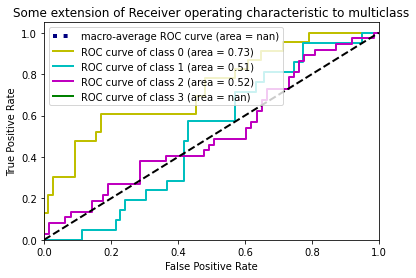

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['y','c', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC curve for XGBoost Classifier")
plt.legend(loc="upper left")
plt.show()

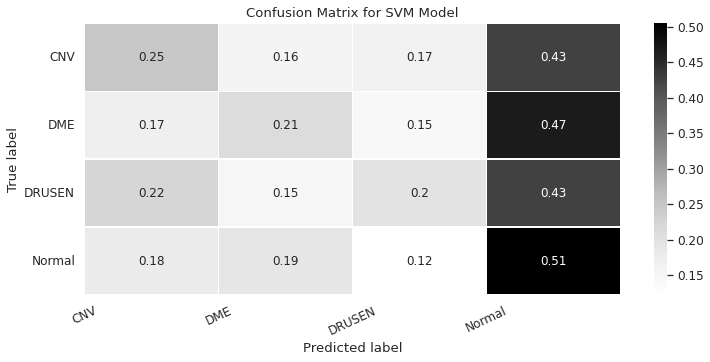

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(xtest_label, xgb_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(12,5))
sns.set(font_scale=1.1)
sns.heatmap(matrix, annot=True, annot_kws={'size':12},
            cmap=plt.cm.viridis, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for XGBoost Model')
plt.show()

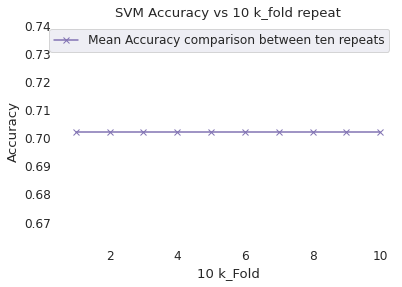

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	xg_scores = cross_val_score(xgbc, xvalcv_data, xvalcv_label, scoring='accuracy', cv=cv)
	results.append(np.mean(xg_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('SVM Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

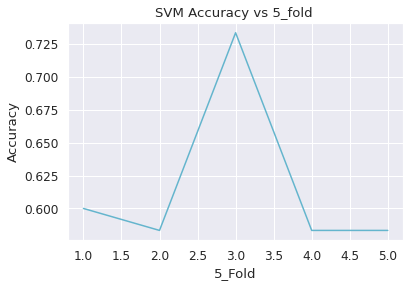

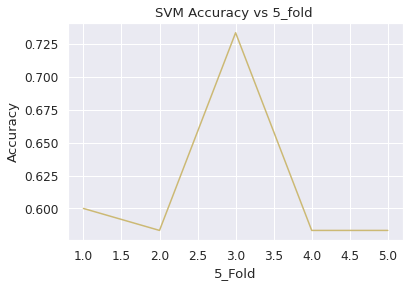

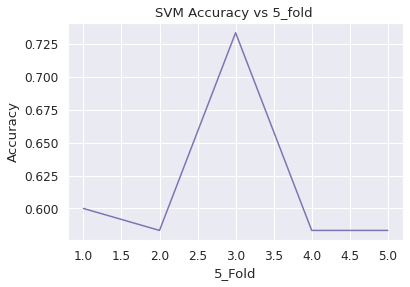

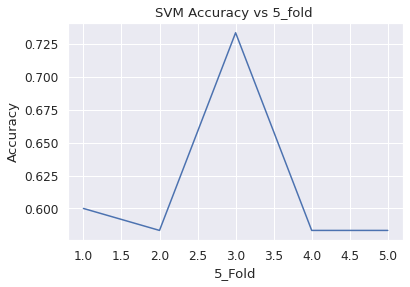

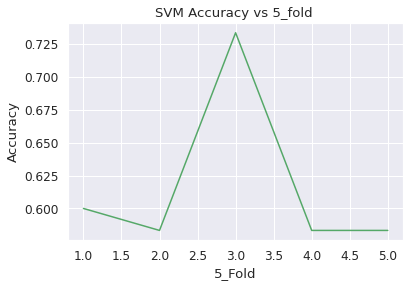

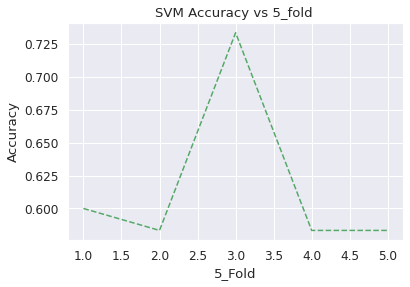

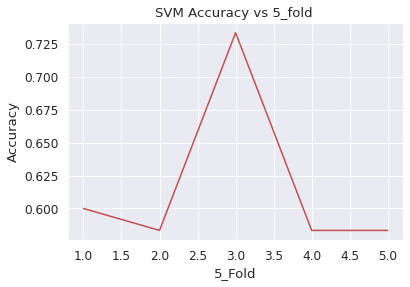

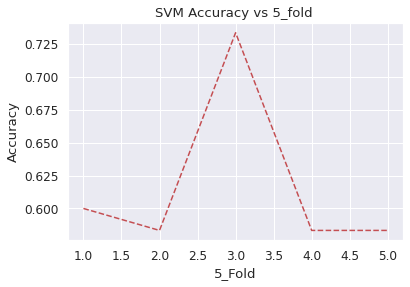

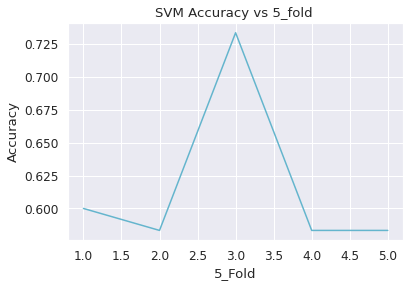

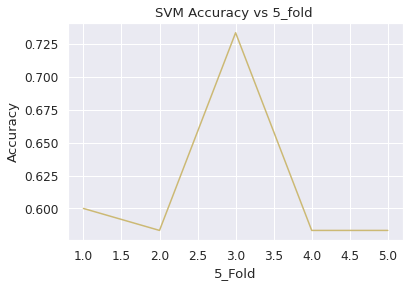

No handles with labels found to put in legend.


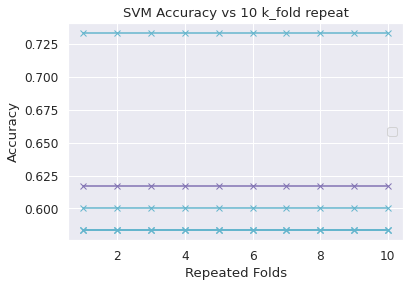

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(svc, sval_data, sval_label, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('SVM Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('SVM Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(svc, sval_data, sval_label, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(svc,LeaveOneOut())


> folds=1, accuracy=0.617 (0.583,0.733)
> folds=2, accuracy=0.617 (0.583,0.733)
> folds=3, accuracy=0.617 (0.583,0.733)
> folds=4, accuracy=0.617 (0.583,0.733)
> folds=5, accuracy=0.617 (0.583,0.733)
> folds=6, accuracy=0.617 (0.583,0.733)
> folds=7, accuracy=0.617 (0.583,0.733)
> folds=8, accuracy=0.617 (0.583,0.733)
> folds=9, accuracy=0.617 (0.583,0.733)
> folds=10, accuracy=0.617 (0.583,0.733)


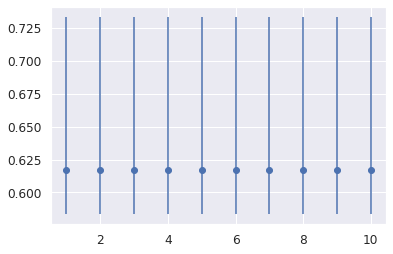

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(svc, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

## <font color='purple'> Using Random Forest and XGBoost And Ensemble Learning </font>

## <font color='blue'> Q5: Does performance of Model for classification of different Retina diseases vary with different evaluation measures, such as Accuracy, Recall, specificity, Confusion Matrix, ROC and Brier Score measures? </font>

In [ ]:
# how to compute the numer of trainable and non trainable weights in a model

from keras import backend as K
import numpy

trainable_count = int(numpy.sum([K.count_params(p) for p in set(model.trainable_weights)]))

non_trainable_count = int(numpy.sum([K.count_params(p) for p in set(model.non_trainable_weights)]))

print(trainable_count,non_trainable_count)

3996394 0


In [ ]:
# how to compute the memory allocated by the activations of a model

batch = 1
shapes_count = int(numpy.sum([numpy.prod(numpy.array([s if isinstance(s, int) 
                                                      else 1 for s in l.output_shape])) 
                              for l in model.layers]))
memory = shapes_count * 4 * batch

print(memory)

3643436


## Feature Selection using SVM

In [ ]:
# to calculate memory
!pip install -q scalene

     |████████████████████████████████| 588 kB 9.9 MB/s 
     |████████████████████████████████| 229 kB 33.5 MB/s 
     |████████████████████████████████| 51 kB 6.4 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.0.0 which is incompatible.


In [ ]:
scalene <yourapp.py>
%load_ext scalene


In [ ]:
$ scalene linearmodel.py --html >> linearmodel-scalene.html

In [ ]:
import math

n = 150
#number_of_examples = len(train_batches.filenames)
number_generator = math.ceil(2250 / (1.0 * n)) 
#number_generator = round((2250 / (1.0 * n)), 2)

# 1.0 above is to skip integer division

strain_label = []
strain_data = []

for i in range(0,int(number_generator)):
    strain_label.extend(np.array(train_generator1[i][1]))
    strain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
strain_label = np.array(strain_label)
strain_data = np.array(strain_data)

In [ ]:
np.array(strain_data).shape

(2250, 224, 224, 3)

In [ ]:
strain_data = strain_data.reshape([2250, 224*224*3])

In [ ]:

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(750 / (1.0 * n)) 
#number_generator = round((750 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

stest_label = []
stest_data = []

for i in range(0,int(number_generator)):
    stest_label.extend(np.array(test_generator1[i][1]))
    stest_data.extend(np.array(test_generator1[i][0]))


In [ ]:
stest_label = np.array(stest_label)
stest_data = np.array(stest_data)

In [ ]:
stest_label.shape

(750,)

In [ ]:
stest_data = stest_data.reshape([750, 224*224*3])

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(300 / (1.0 * n)) 
#number_generator = round((300 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

sval_label1 = []
sval_data1 = []

for i in range(0,int(number_generator)):
    sval_label1.extend(np.array(val_generator1[i][1]))
    sval_data1.extend(np.array(val_generator1[i][0]))


In [ ]:
sval_label = np.array(sval_label1)
sval_data = np.array(sval_data1)

In [ ]:
sval_data.shape

(300, 224, 224, 3)

In [ ]:
sval_data = sval_data.reshape (300, 224*224*3)

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
#number_generator = math.ceil(500 / (1.0 * n)) 
number_generator = round((500 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

sval_label2 = []
sval_data2 = []

for i in range(0,int(number_generator)):
    sval_label2.extend(np.array(val_generator1[i][1]))
    sval_data2.extend(np.array(val_generator1[i][0]))


In [ ]:
svalcv_label = np.array(sval_label2)
svalcv_data = np.array(sval_data2)

In [ ]:
svalcv_data.shape

(450, 224, 224, 3)

In [ ]:
svalcv_data = svalcv_data.reshape (450, 224*224*3)

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# C is the penalty parameter of the error term. 
# the gamma parameter defines how far the influence of a single training example reaches

parameters = {'kernel':('linear', 'rbf'), 'C':[1, 10], 'gamma': [1, 0.01]}
svc = SVC()
grid = GridSearchCV(svc, parameters)
grid.fit(svalcv_data, svalcv_label)

#GridSearchCV(estimator=SVC(),param_grid={'C': [1, 10], 'kernel': ('linear', 'rbf')})


In [ ]:
grid.best_params_

{'C': 1, 'gamma': 1, 'kernel': 'linear'}

In [ ]:
from sklearn.svm import SVC

svc = SVC(kernel='linear', gamma=1, C=1, random_state=10, class_weight='balanced')
#svc.fit(strain_data ,strain_label, class_weight=class_weights)


In [ ]:
from sklearn.svm import SVC

svc = SVC(random_state=10, class_weight='balanced')
#svc.fit(strain_data ,strain_label, class_weight=class_weights)


In [ ]:
from sklearn.utils import compute_class_weight
from sklearn.utils import class_weight

class_weights = class_weight.compute_class_weight(class_weight ='balanced', classes=np.unique(strain_label), y=np.array(strain_label))

class_weights = dict(zip(np.unique(strain_label), class_weights))

class_weights


{0.0: 1.2096774193548387,
 1.0: 1.358695652173913,
 2.0: 1.2417218543046358,
 3.0: 0.6127450980392157}

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
scores = cross_val_score(svc, svalcv_data, svalcv_label, cv=cv)
np.average(scores)
np.mean(scores)

0.4755555555555555

In [ ]:
scores

array([0.46666667, 0.6       , 0.46666667, 0.46666667, 0.36666667,
       0.53333333, 0.53333333, 0.43333333, 0.36666667, 0.46666667,
       0.53333333, 0.4       , 0.36666667, 0.5       , 0.63333333])

In [ ]:
!pip install -q -U scalene

     |████████████████████████████████| 588 kB 5.3 MB/s 
     |████████████████████████████████| 229 kB 49.5 MB/s 
     |████████████████████████████████| 51 kB 6.0 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.0.0 which is incompatible.


In [ ]:
import pickle
import time
#import scalene

In [ ]:
#from scalene import scalene_profiler


In [ ]:
start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


svc.fit(strain_data, strain_label)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 2139.2229389999998 duration2= 1109.5825235843658


In [ ]:
print(scalene.scalene_statistics)
print(scalene.scalene_output)

<module 'scalene.scalene_statistics' from '/usr/local/lib/python3.7/dist-packages/scalene/scalene_statistics.py'>
<module 'scalene.scalene_output' from '/usr/local/lib/python3.7/dist-packages/scalene/scalene_output.py'>


In [ ]:

# save the model to disk
filename = '/content/drive/MyDrive/OCT2017_2/svc_model.sav'
pickle.dump(svc, open(filename, 'wb'))
 

In [ ]:

# save the model to disk
filename = '/content/drive/MyDrive/OCT2017_2/svc_grd.sav'
pickle.dump(svc, open(filename, 'wb'))
 

In [ ]:
svc_pred = svc.predict(stest_data)

In [ ]:
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(stest_data, stest_label)
print(result)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(stest_label, svc_pred)


0.2906666666666667

In [ ]:
confusion_matrix(stest_label, svc_pred)


array([[46, 29, 31, 79],
       [32, 39, 27, 87],
       [43, 29, 38, 82],
       [34, 36, 23, 95]])

In [ ]:
from sklearn.metrics import confusion_matrix

cnf_matrix = cm
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print('Sensitivity : ',TPR)

# Specificity or true negative rate
TNR = TN/(TN+FP)
print('Specificity : ',TNR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print('Precision : ',PPV)

# Fall out or false positive rate
FPR = FP/(FP+TN)
print('FPR : ',FPR)
# False negative rate
FNR = FN/(TP+FN)
print('FNR : ',FNR)
# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print('Accuracy : ',ACC)

Sensitivity :  [0.408 0.168 0.304 0.52 ]
Specificity :  [0.81866667 0.86933333 0.78666667 0.65866667]
Precision :  [0.42857143 0.3        0.3220339  0.33678756]
FPR :  [0.18133333 0.13066667 0.21333333 0.34133333]
FNR :  [0.592 0.832 0.696 0.48 ]
Accuracy :  [0.716 0.694 0.666 0.624]


In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

svc1 = SVC(probability = True, class_weight='balanced')
svc1.fit(stest_data, stest_label)
sv_score = svc1.predict_proba(sval_data)

#Binarize the output
sv_bin = label_binarize(sval_label, classes=[1, 2, 3, 4])
n_classes = sv_bin.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(sv_bin[:, i], sv_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


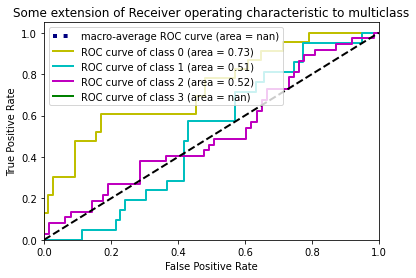

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['y','c', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="upper left")
plt.show()

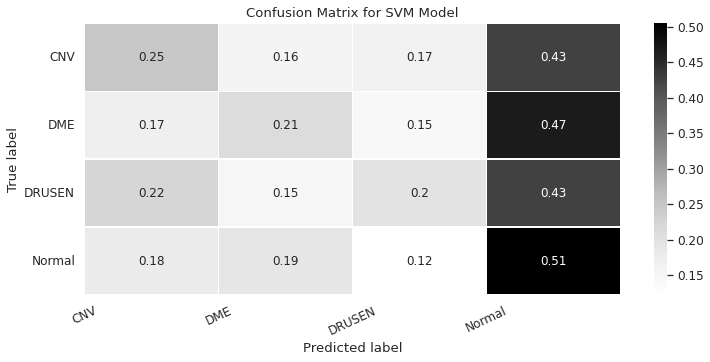

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(stest_label, svc_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(12,5))
sns.set(font_scale=1.1)
sns.heatmap(matrix, annot=True, annot_kws={'size':12},
            cmap=plt.cm.Greys, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for SVM Model')
plt.show()

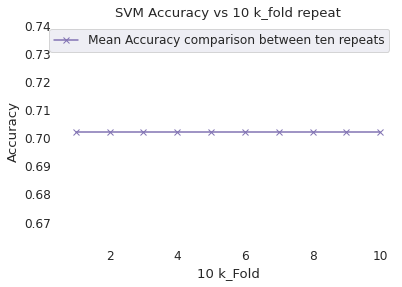

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	svc_scores = cross_val_score(svc, svalcv_data, svalcv_label, scoring='accuracy', cv=cv)
	results.append(np.mean(svc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('SVM Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

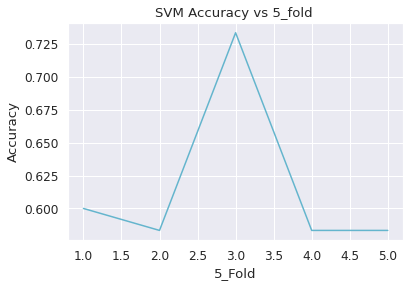

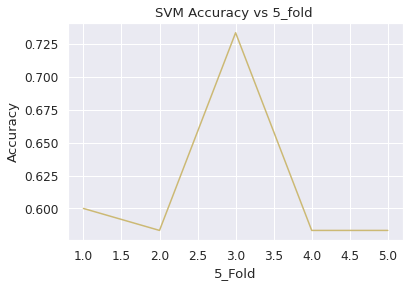

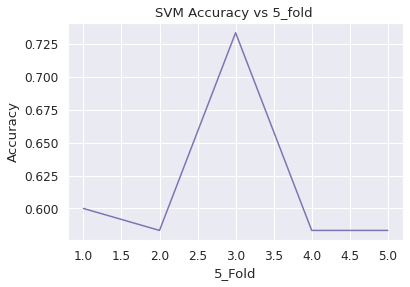

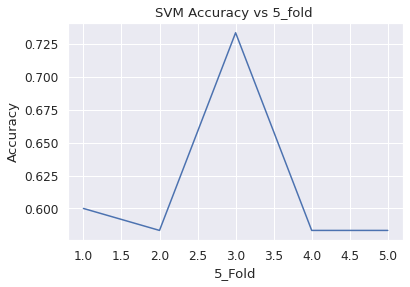

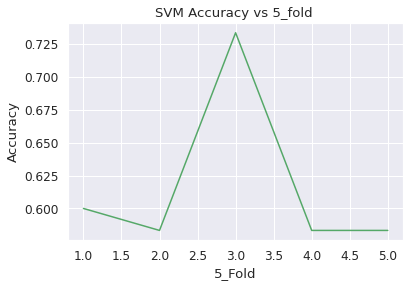

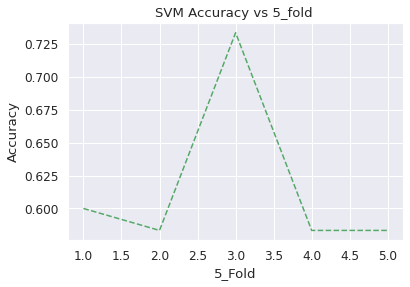

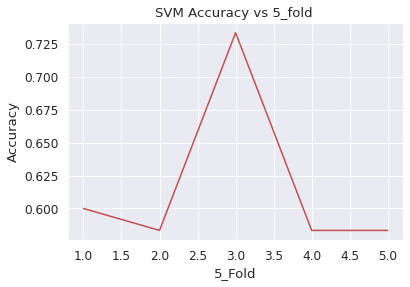

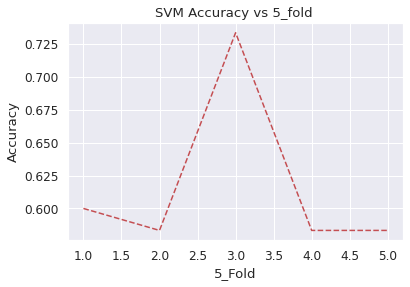

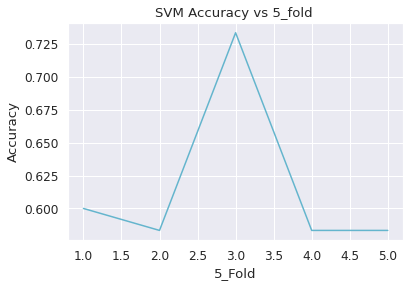

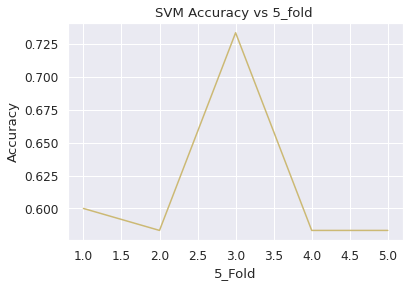

No handles with labels found to put in legend.


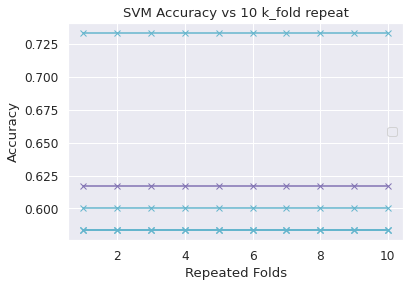

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(svc, sval_data, sval_label, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('SVM Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('SVM Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(svc, sval_data, sval_label, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(svc,LeaveOneOut())


> folds=1, accuracy=0.617 (0.583,0.733)
> folds=2, accuracy=0.617 (0.583,0.733)
> folds=3, accuracy=0.617 (0.583,0.733)
> folds=4, accuracy=0.617 (0.583,0.733)
> folds=5, accuracy=0.617 (0.583,0.733)
> folds=6, accuracy=0.617 (0.583,0.733)
> folds=7, accuracy=0.617 (0.583,0.733)
> folds=8, accuracy=0.617 (0.583,0.733)
> folds=9, accuracy=0.617 (0.583,0.733)
> folds=10, accuracy=0.617 (0.583,0.733)


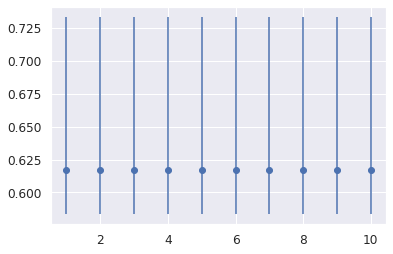

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(svc, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

In [ ]:
!pip install -q scikit-plot

In [ ]:
import scikitplot as skplt
import matplotlib.pyplot as plt

y_true = stest_label
y_probas = svc_pred
skplt.metrics.plot_roc_curve(y_true, y_probas)
plt.show()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=FutureWarning)


IndexError: ignored

In [ ]:
import seaborn as sns
from matplotlib import cm


# Get and reshape confusion matrix data
matrix = confusion_matrix(stest_label, svc_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greys, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for SVC Model')
plt.show()

In [ ]:
print(classification_report(stest_label, svc_pred))


              precision    recall  f1-score   support

         0.0       0.31      0.36      0.33       141
         1.0       0.53      0.07      0.12       151
         2.0       0.30      0.54      0.39       153
         3.0       0.38      0.36      0.37       155

    accuracy                           0.33       600
   macro avg       0.38      0.33      0.30       600
weighted avg       0.38      0.33      0.30       600

